In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



In [2]:
!pip install missingno
!pip install plotly
!pip install chart_studio
import plotly.express as px
from plotly.subplots import make_subplots
import chart_studio.plotly as py
import plotly.graph_objects as go
%matplotlib notebook

In [3]:
import warnings            
warnings.filterwarnings("ignore") 

In [238]:
data = pd.read_csv(r"/Users/admin/IMDBmovies.csv")
print('Reading CSV')

Reading CSV


In [239]:
data.head(15)

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,...,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,tt1392190,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,http://www.madmaxmovie.com/,George Miller,What a Lovely Day.,...,An apocalyptic story set in the furthest reach...,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,262500,tt2908446,13.112507,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,http://www.thedivergentseries.movie/#insurgent,Robert Schwentke,One Choice Can Destroy You,...,Beatrice Prior must confront her inner demons ...,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,140607,tt2488496,11.173104,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,http://www.starwars.com/films/star-wars-episod...,J.J. Abrams,Every generation has a story.,...,Thirty years after defeating the Galactic Empi...,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,168259,tt2820852,9.335014,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,http://www.furious7.com/,James Wan,Vengeance Hits Home,...,Deckard Shaw seeks revenge against Dominic Tor...,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09
5,281957,tt1663202,9.110700,135000000,532950503,The Revenant,Leonardo DiCaprio|Tom Hardy|Will Poulter|Domhn...,http://www.foxmovies.com/movies/the-revenant,Alejandro GonzÃ¡lez IÃ±Ã¡rritu,"(n. One who has returned, as if from the dead.)",...,"In the 1820s, a frontiersman, Hugh Glass, sets...",156,Western|Drama|Adventure|Thriller,Regency Enterprises|Appian Way|CatchPlay|Anony...,12/25/15,3929,7.2,2015,1.241999e+08,4.903142e+08
6,87101,tt1340138,8.654359,155000000,440603537,Terminator Genisys,Arnold Schwarzenegger|Jason Clarke|Emilia Clar...,http://www.terminatormovie.com/,Alan Taylor,Reset the future,...,"The year is 2029. John Connor, leader of the r...",125,Science Fiction|Action|Thriller|Adventure,Paramount Pictures|Skydance Productions,6/23/15,2598,5.8,2015,1.425999e+08,4.053551e+08
7,286217,tt3659388,7.667400,108000000,595380321,The Martian,Matt Damon|Jessica Chastain|Kristen Wiig|Jeff ...,http://www.foxmovies.com/movies/the-martian,Ridley Scott,Bring Him Home,...,"During a manned mission to Mars, Astronaut Mar...",141,Drama|Adventure|Science Fiction,Twentieth Century Fox Film Corporation|Scott F...,9/30/15,4572,7.6,2015,9.935996e+07,5.477497e+08
8,211672,tt2293640,7.404165,74000000,1156730962,Minions,Sandra Bullock|Jon Hamm|Michael Keaton|Allison...,http://www.minionsmovie.com/,Kyle Balda|Pierre Coffin,"Before Gru, they had a history of bad bosses",...,"Minions Stuart, Kevin and Bob are recruited by...",91,Family|Animation|Adventure|Comedy,Universal Pictures|Illumination Entertainment,6/17/15,2893,6.5,2015,6.807997e+07,1.064192e+09
9,150540,tt2096673,6.326804,175000000,853708609,Inside Out,Amy Poehler|Phyllis Smith|Richard Kind|Bill Ha...,http://movies.disney.com/inside-out,Pete Docter,Meet the little voices inside your head.,...,"Growing up can be a bumpy road, and it's no ex...",94,Comedy|Animation|Family,Walt Disney Pictures|Pixar Animation Studios|W...,6/9/15

In [240]:
data.shape

(10866, 21)

In [226]:
data.describe() # Describes the statistics for the numerical variables in the Dataset.

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj
count,10866.000000,10866.000000,1.086600e+04,1.086600e+04,10866.000000,10866.000000,10866.000000,10866.000000,1.086600e+04,1.086600e+04
mean,66064.177434,0.646441,1.462570e+07,3.982332e+07,102.070863,217.389748,5.974922,2001.322658,1.755104e+07,5.136436e+07
std,92130.136561,1.000185,3.091321e+07,1.170035e+08,31.381405,575.619058,0.935142,12.812941,3.430616e+07,1.446325e+08
min,5.000000,0.000065,0.000000e+00,0.000000e+00,0.000000,10.000000,1.500000,1960.000000,0.000000e+00,0.000000e+00
25%,10596.250000,0.207583,0.000000e+00,0.000000e+00,90.000000,17.000000,5.400000,1995.000000,0.000000e+00,0.000000e+00
50%,20669.000000,0.383856,0.000000e+00,0.000000e+00,99.000000,38.000000,6.000000,2006.000000,0.000000e+00,0.000000e+00
75%,75610.000000,0.713817,1.500000e+07,2.400000e+07,111.000000,145.750000,6.600000,2011.000000,2.085325e+07,3.369710e+07
max,417859.000000,32.985763,4.250000e+08,2.781506e+09,900.000000,9767.000000,9.200000,2015.000000,4.250000e+08,2.827124e+09


In [227]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10866 non-null  int64  
 1   imdb_id               10856 non-null  object 
 2   popularity            10866 non-null  float64
 3   budget                10866 non-null  int64  
 4   revenue               10866 non-null  int64  
 5   original_title        10866 non-null  object 
 6   cast                  10790 non-null  object 
 7   homepage              2936 non-null   object 
 8   director              10822 non-null  object 
 9   tagline               8042 non-null   object 
 10  keywords              9373 non-null   object 
 11  overview              10862 non-null  object 
 12  runtime               10866 non-null  int64  
 13  genres                10843 non-null  object 
 14  production_companies  9836 non-null   object 
 15  release_date       

<IPython.core.display.Javascript object>


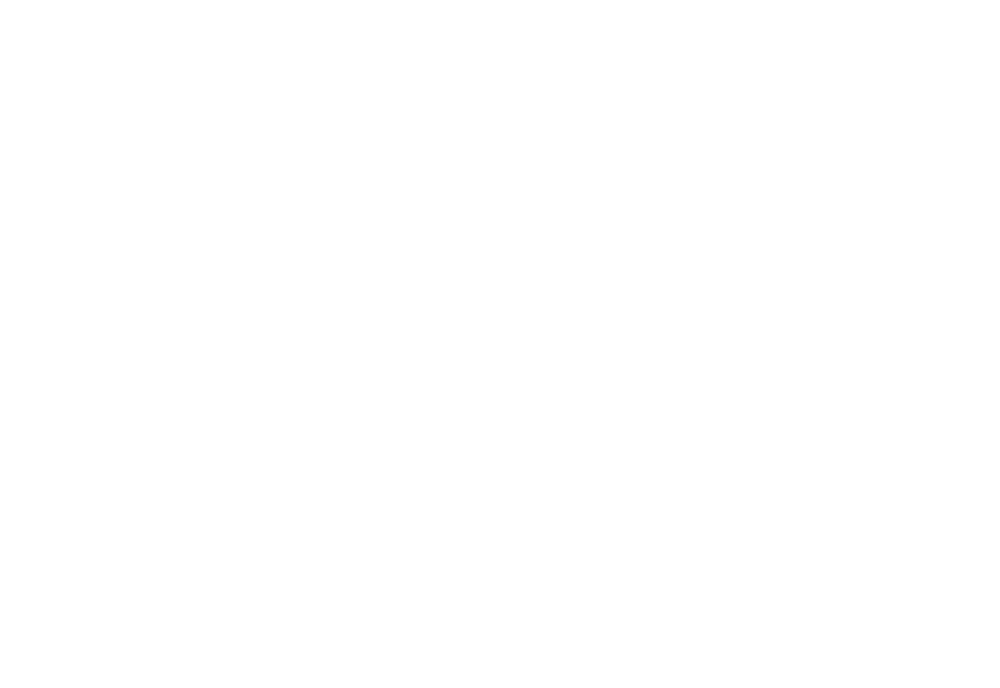

<IPython.core.display.Javascript object>


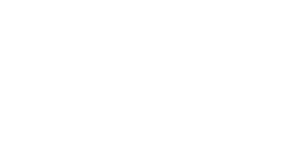

<IPython.core.display.Javascript object>


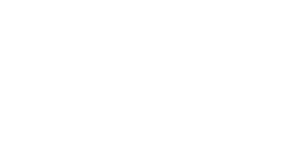

<IPython.core.display.Javascript object>


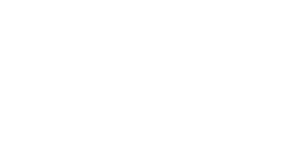

<IPython.core.display.Javascript object>


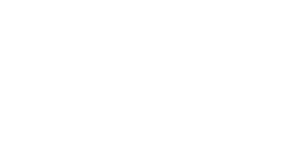

<IPython.core.display.Javascript object>


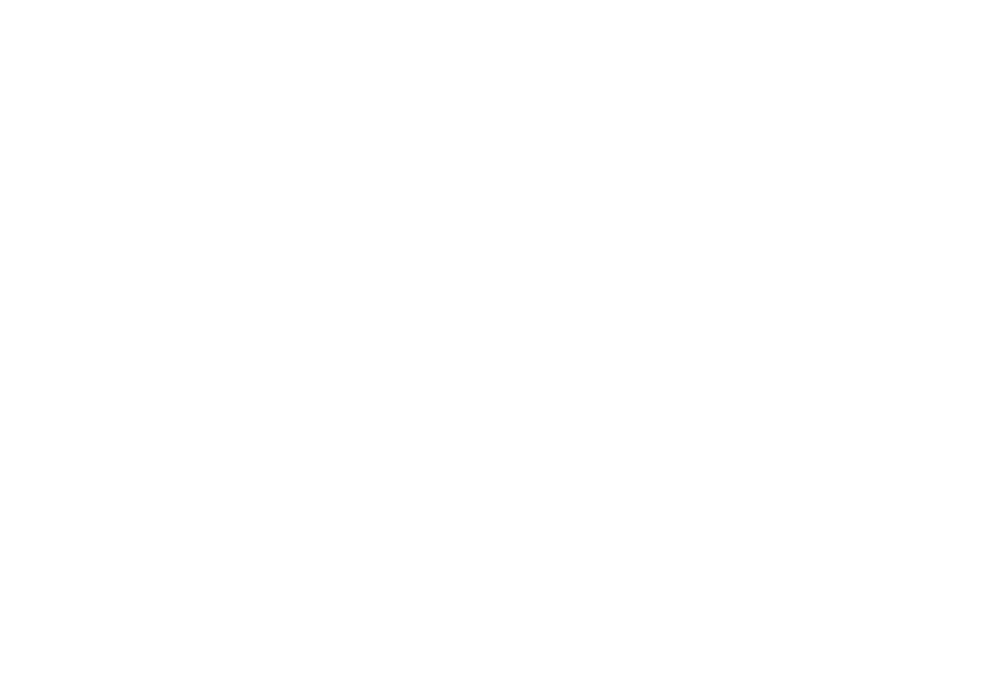

<IPython.core.display.Javascript object>


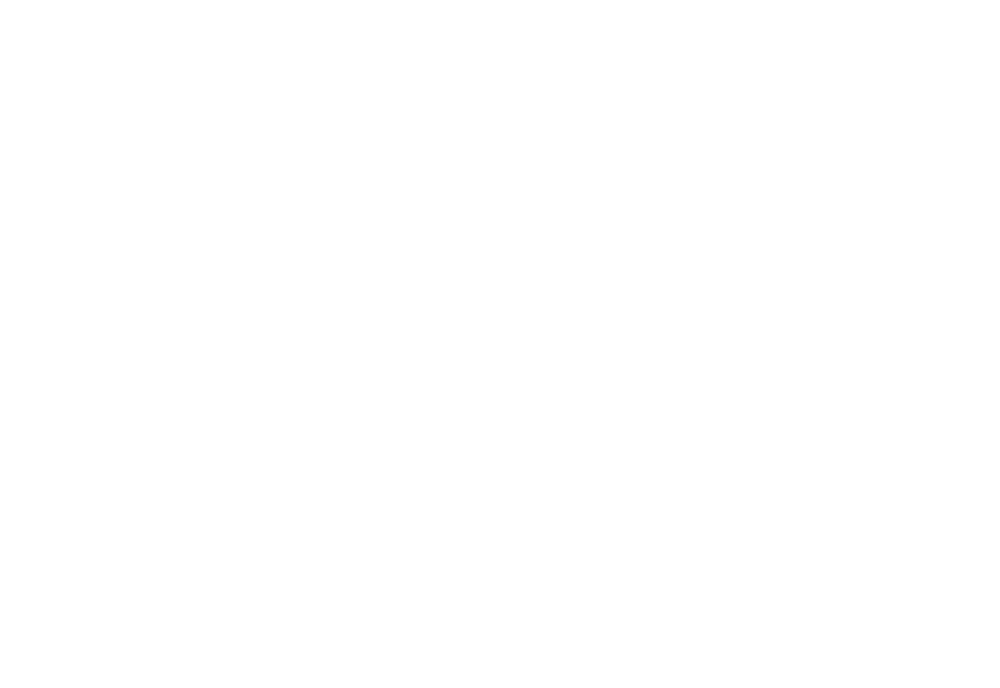

<IPython.core.display.Javascript object>


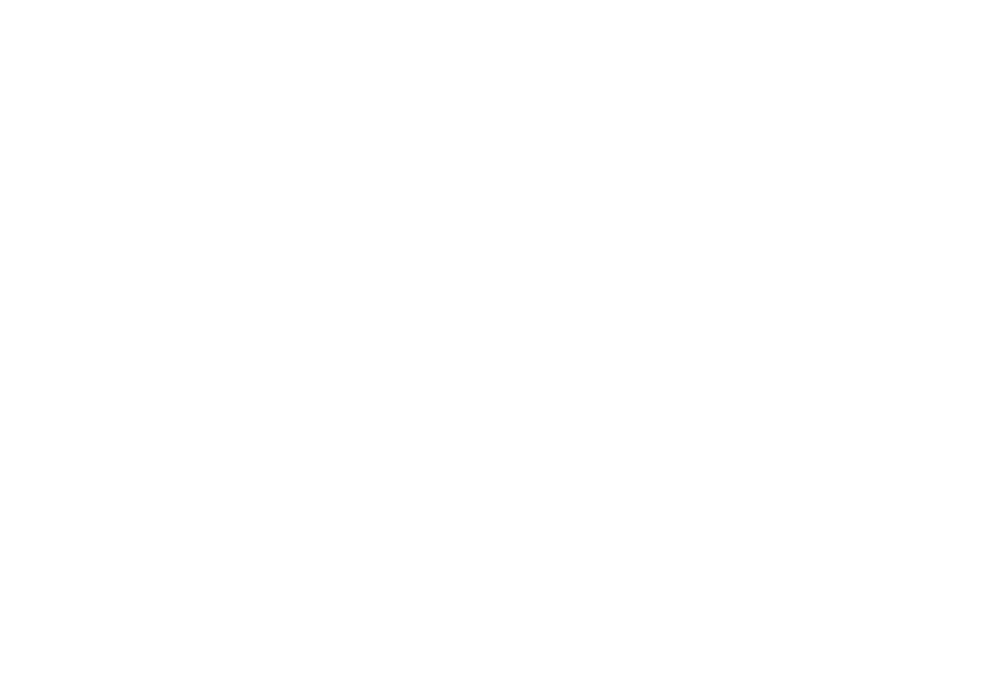

<IPython.core.display.Javascript object>


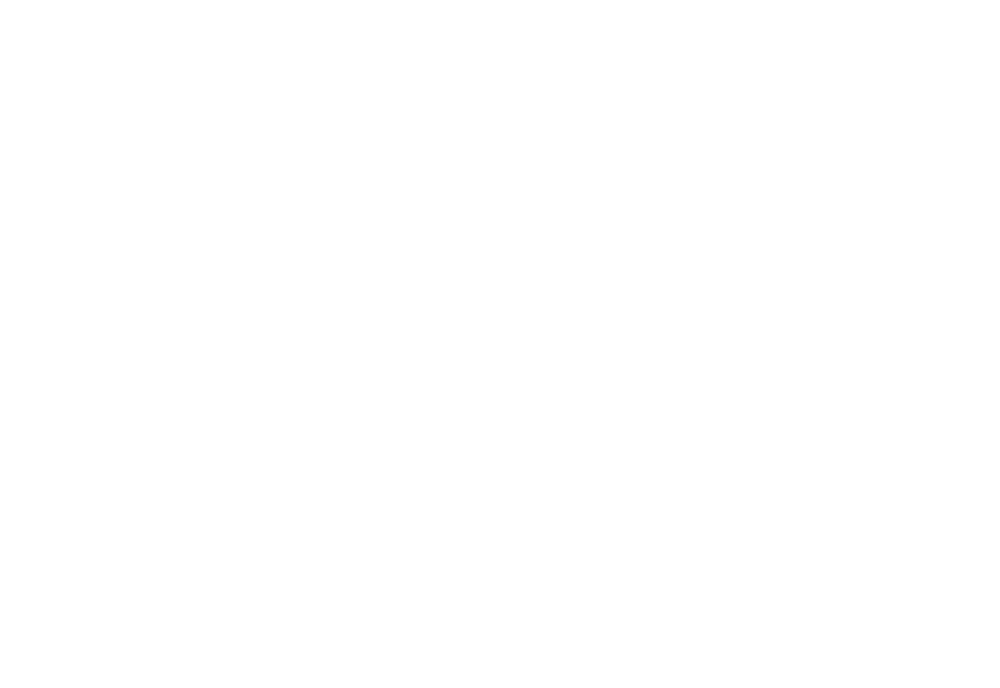

<IPython.core.display.Javascript object>


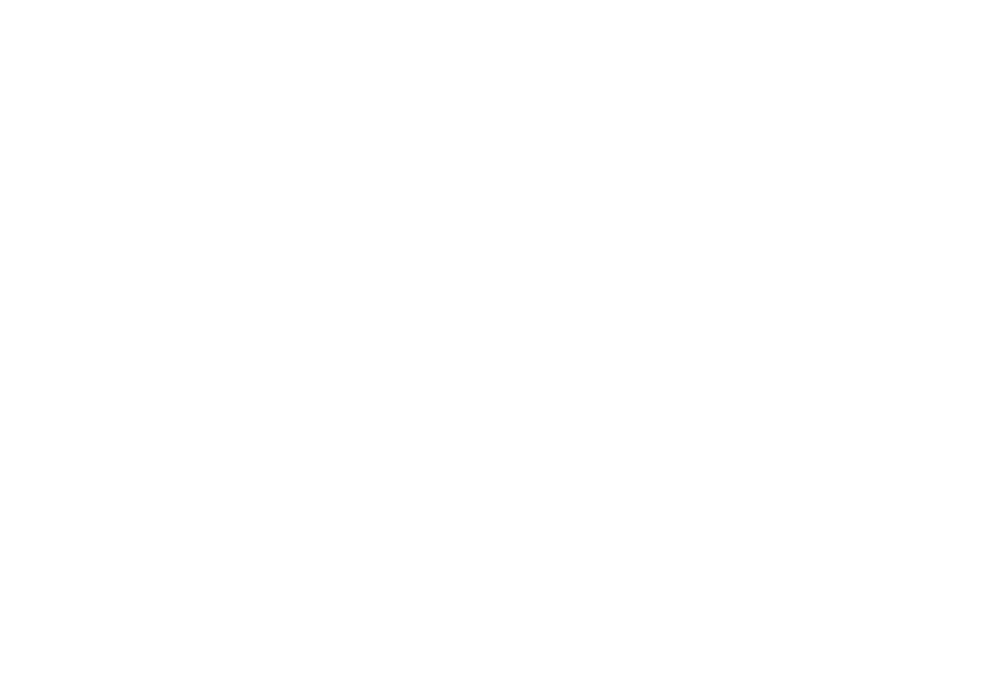

<IPython.core.display.Javascript object>


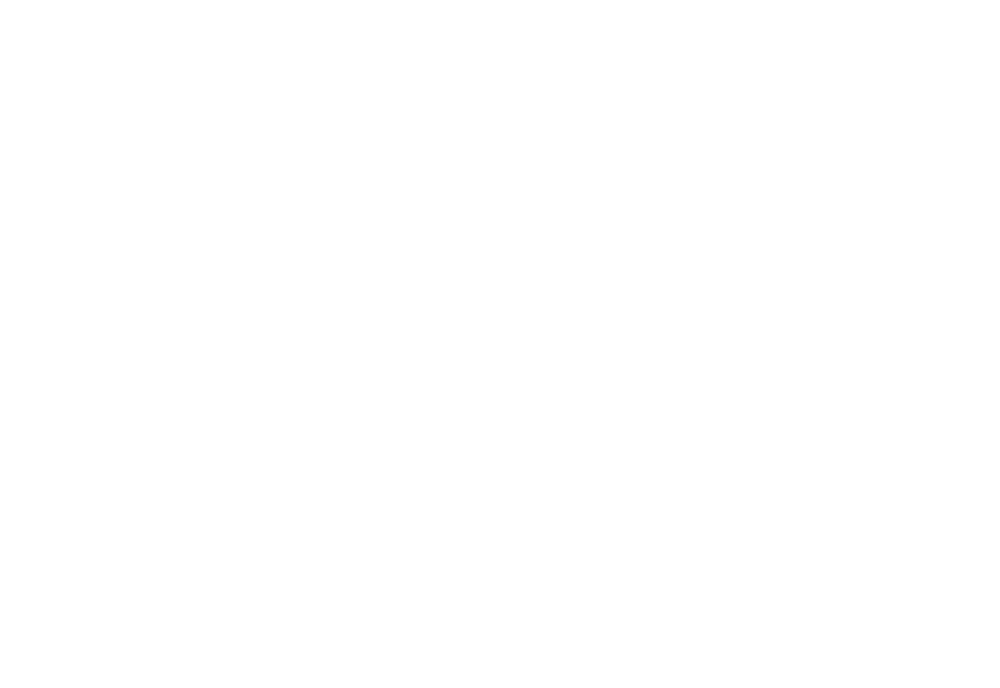

<IPython.core.display.Javascript object>


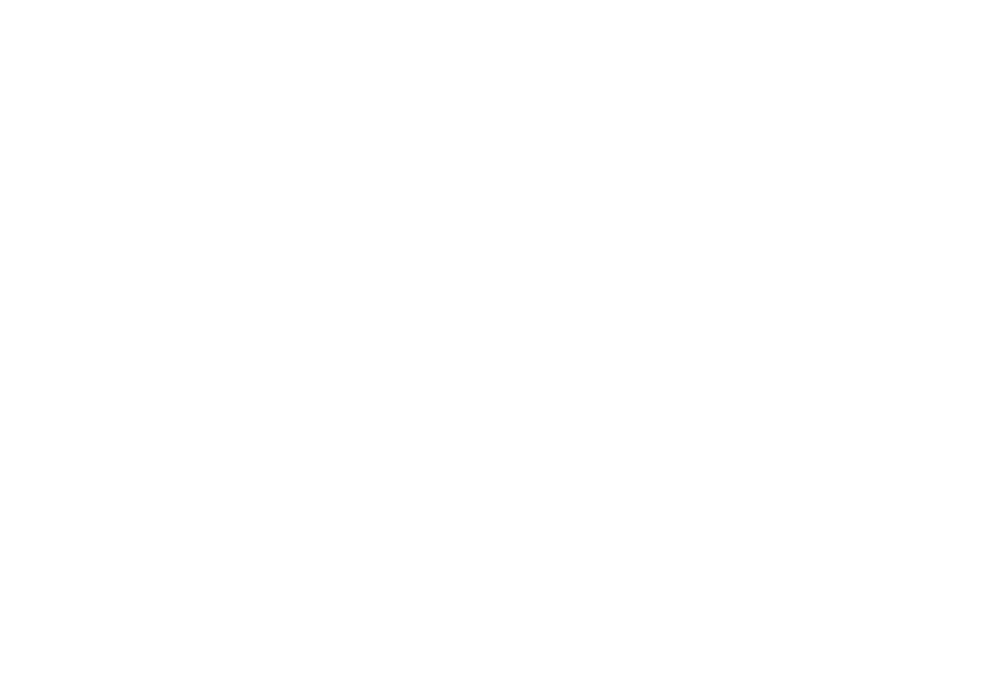

<IPython.core.display.Javascript object>


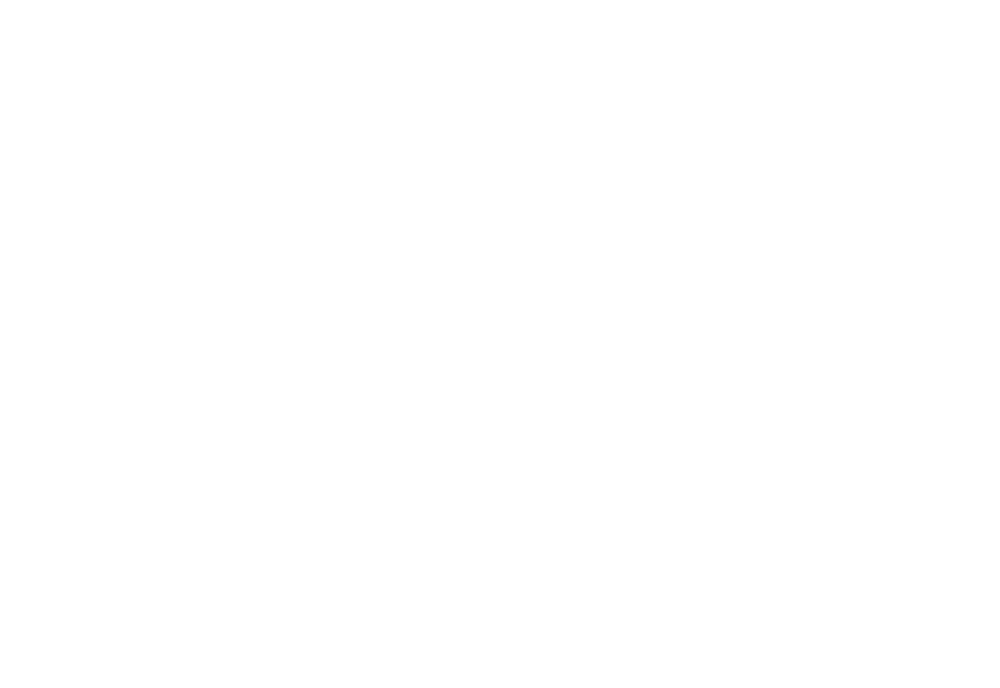

<IPython.core.display.Javascript object>


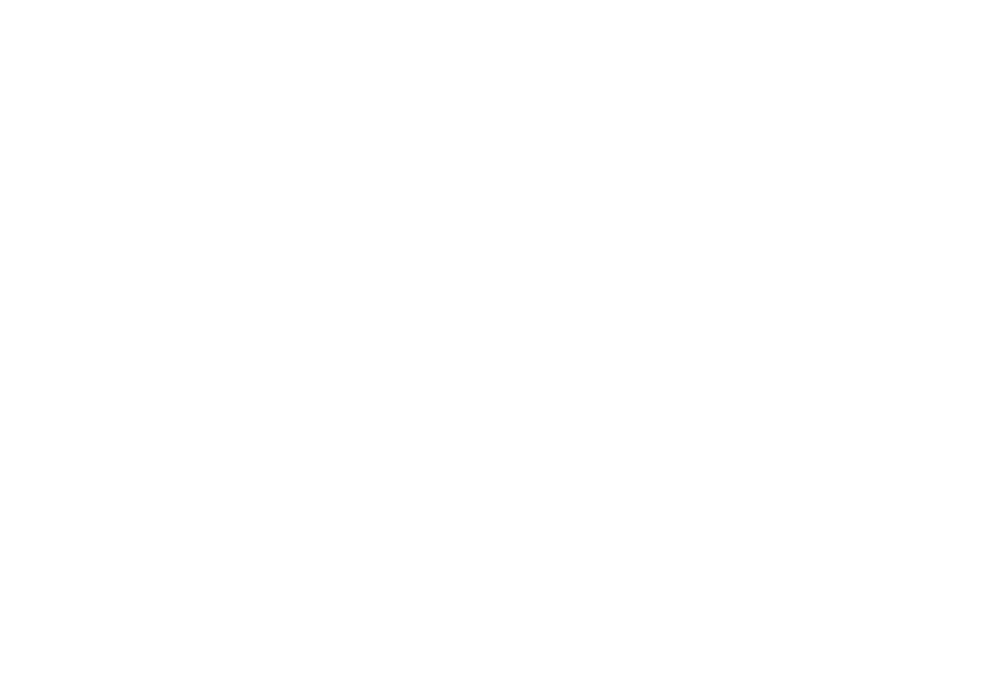

<IPython.core.display.Javascript object>


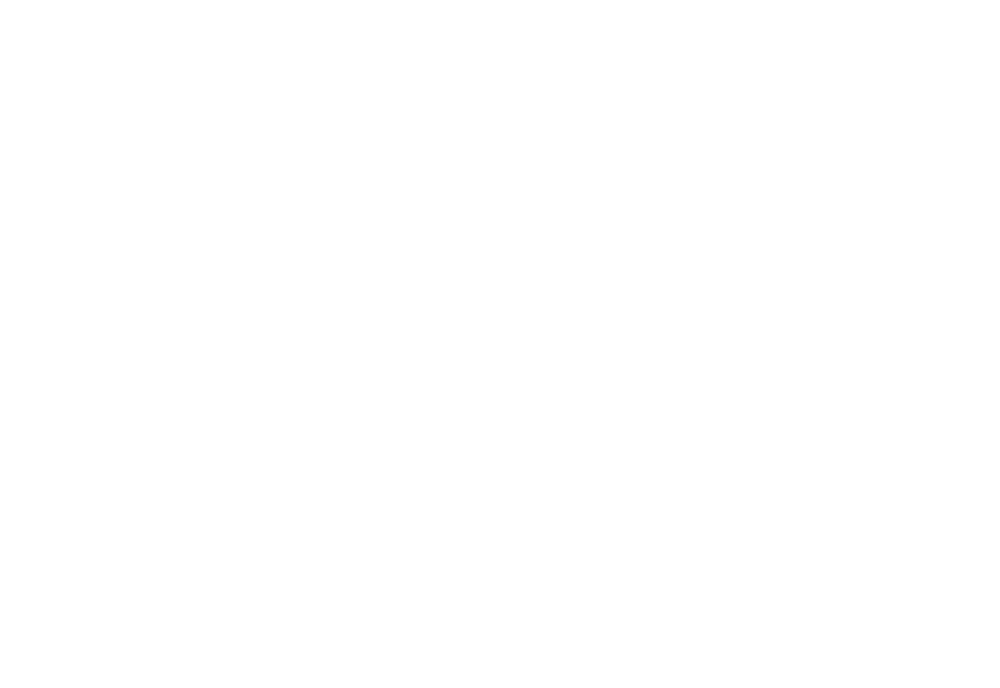

<IPython.core.display.Javascript object>


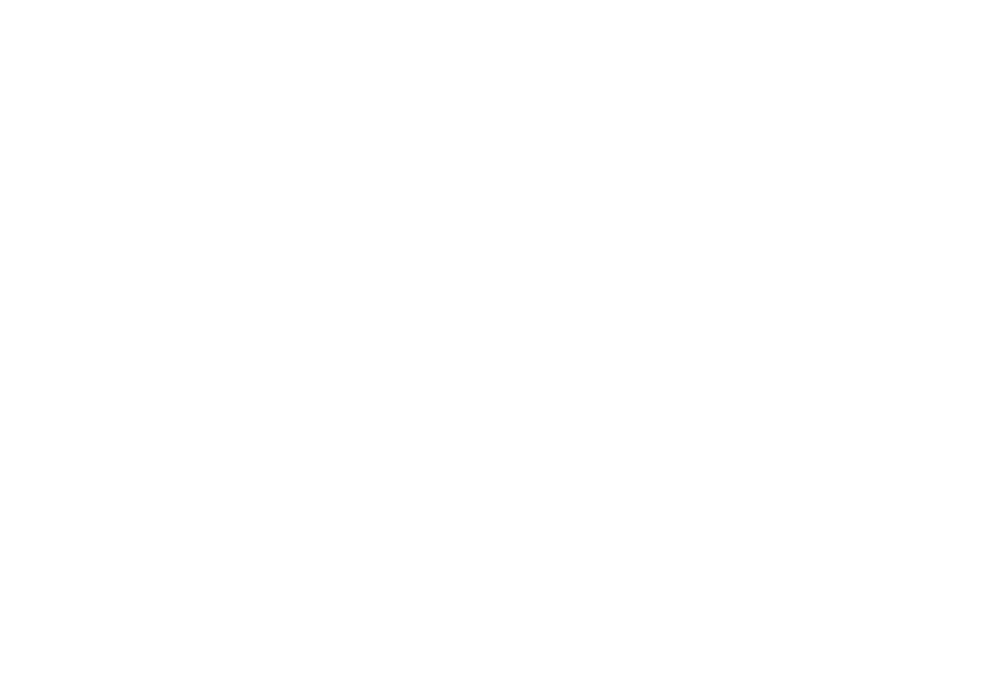

<IPython.core.display.Javascript object>


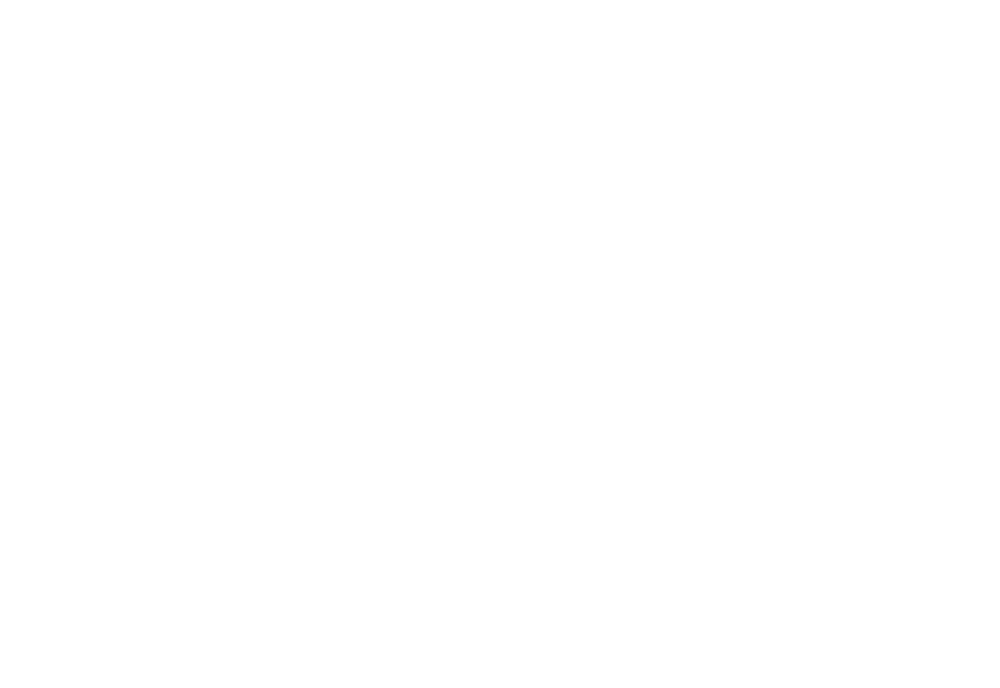

<IPython.core.display.Javascript object>


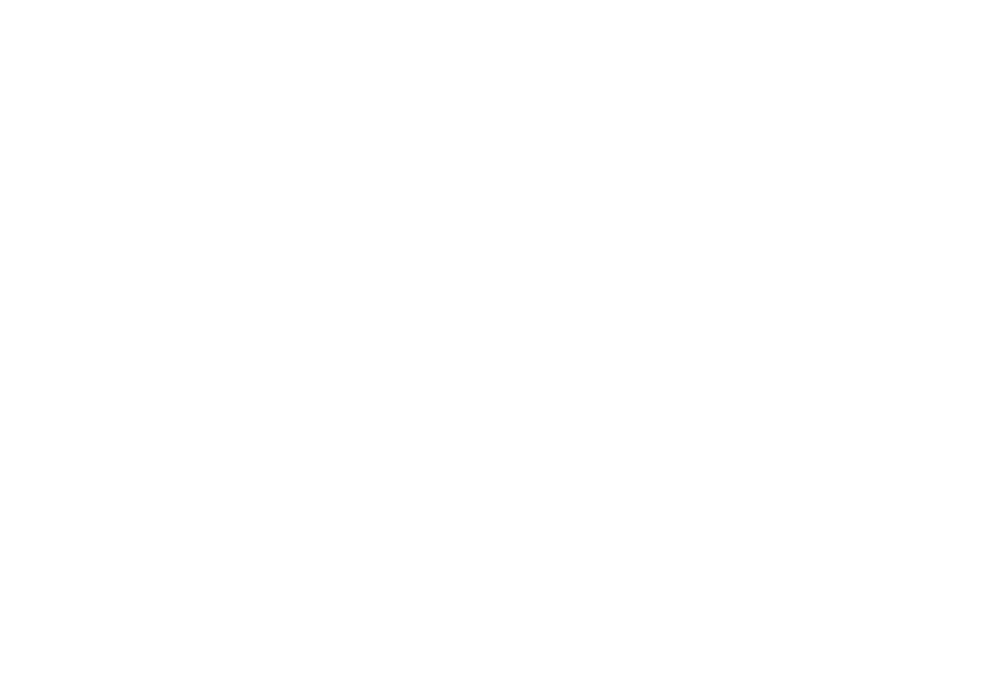

<IPython.core.display.Javascript object>


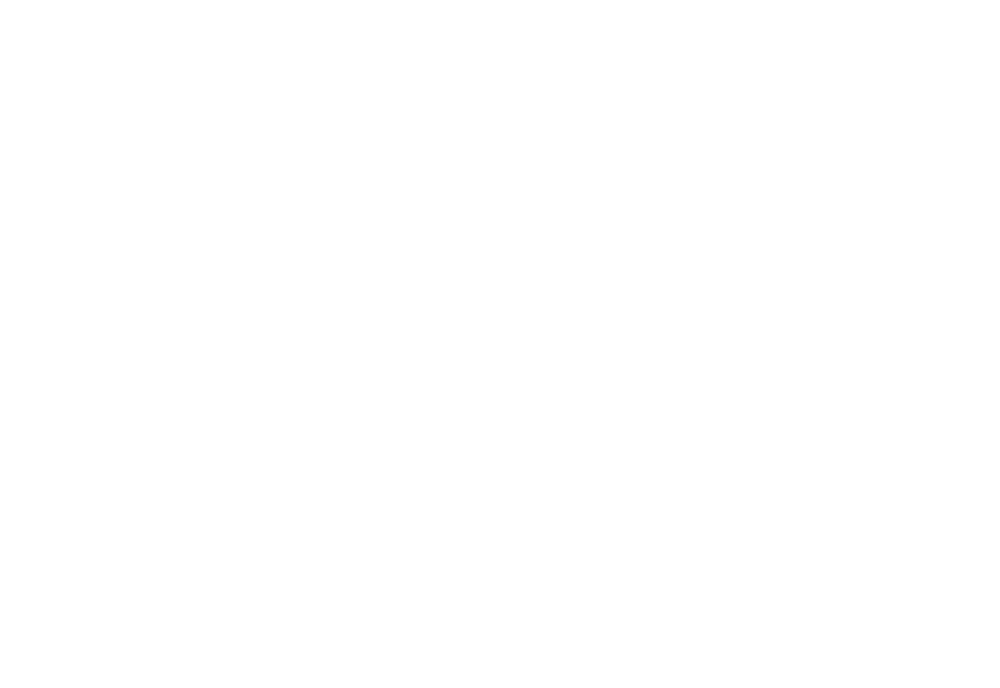

<IPython.core.display.Javascript object>


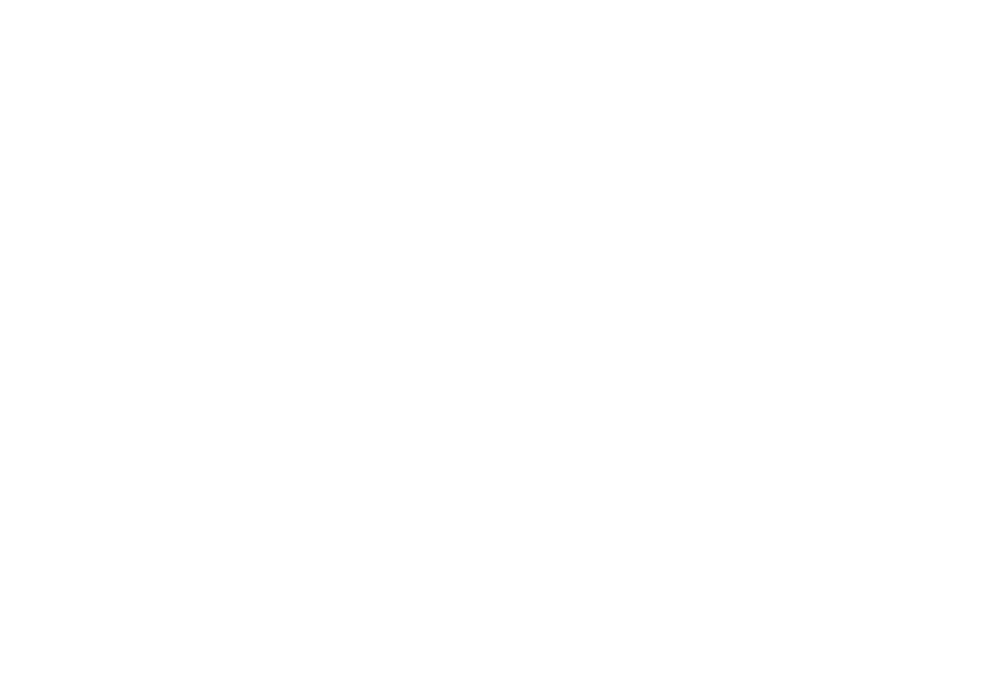

<IPython.core.display.Javascript object>


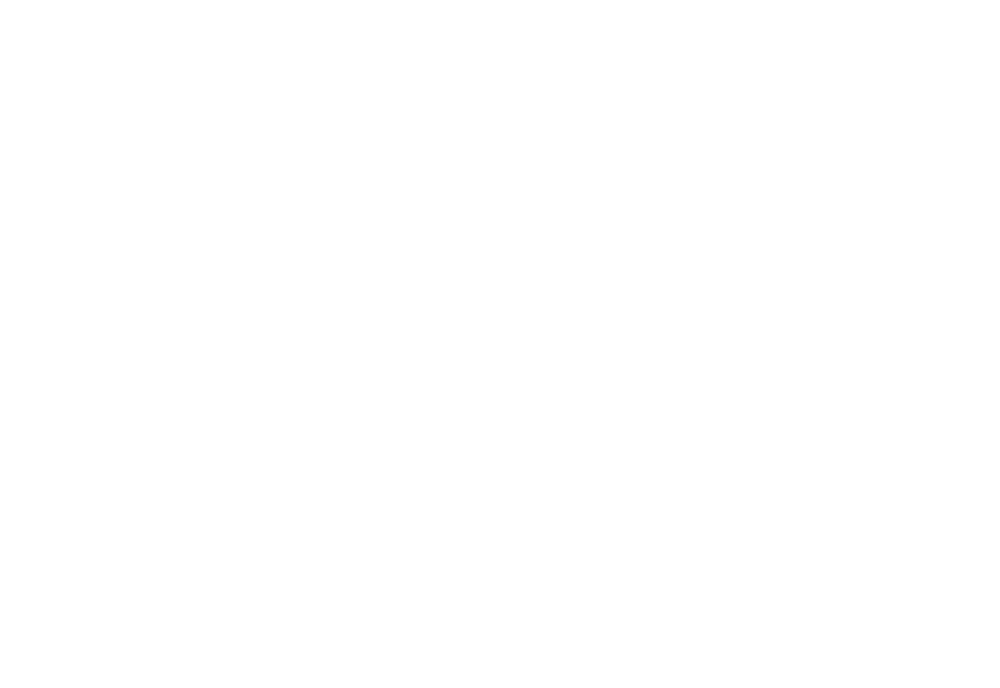

<IPython.core.display.Javascript object>


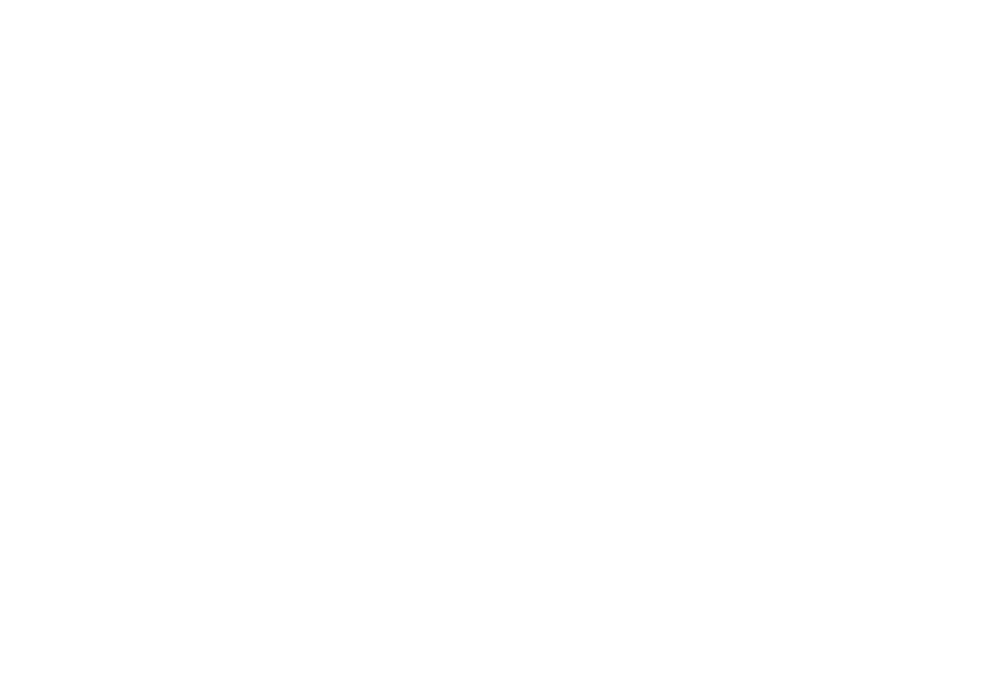

<IPython.core.display.Javascript object>


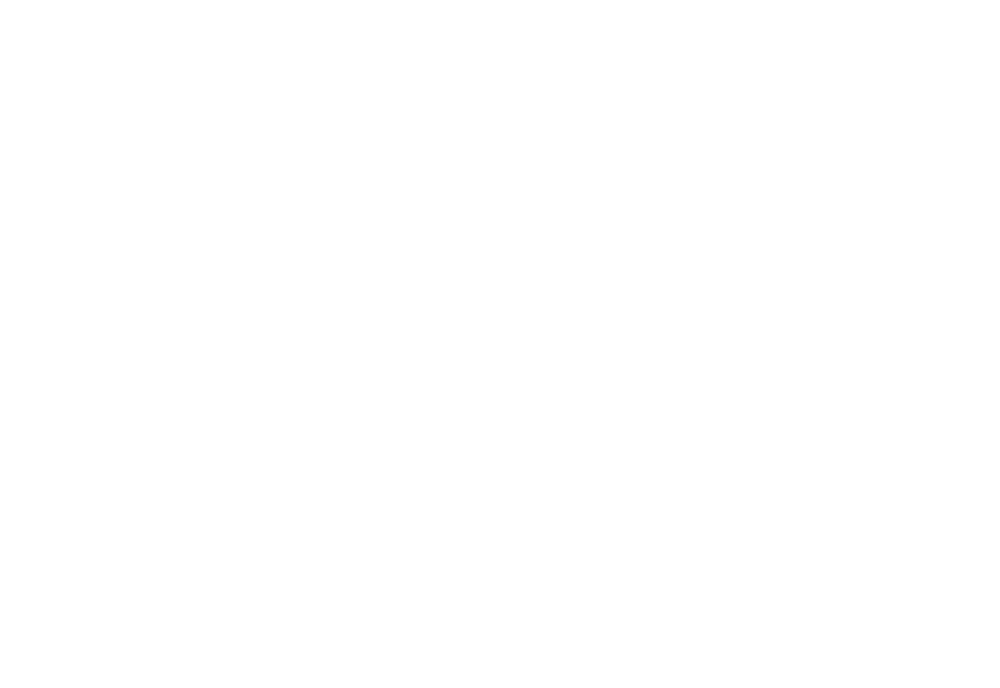

<IPython.core.display.Javascript object>


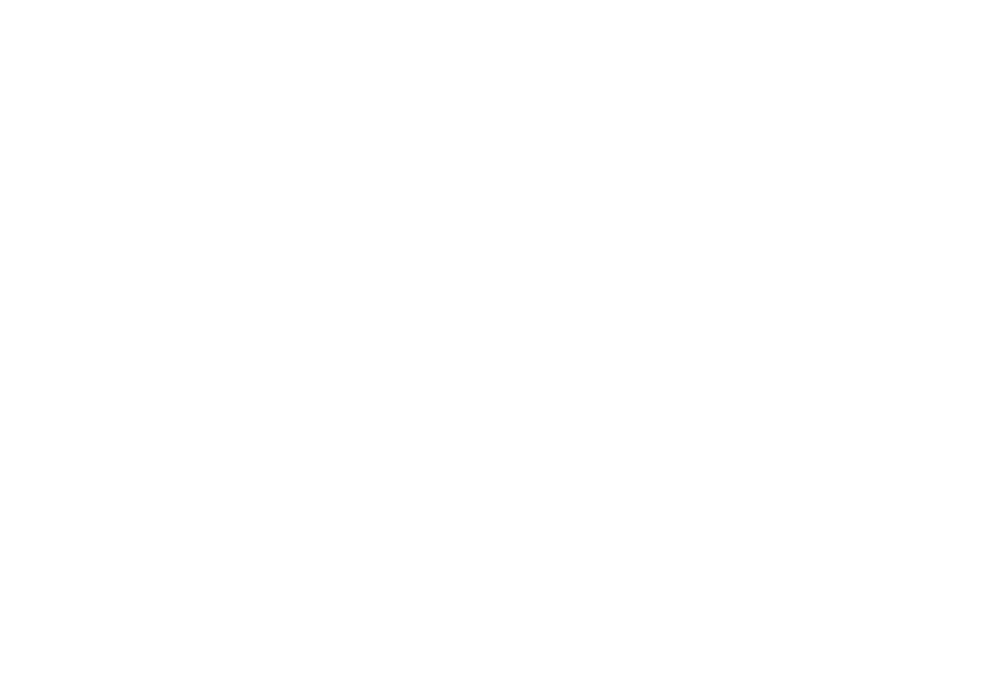

<IPython.core.display.Javascript object>


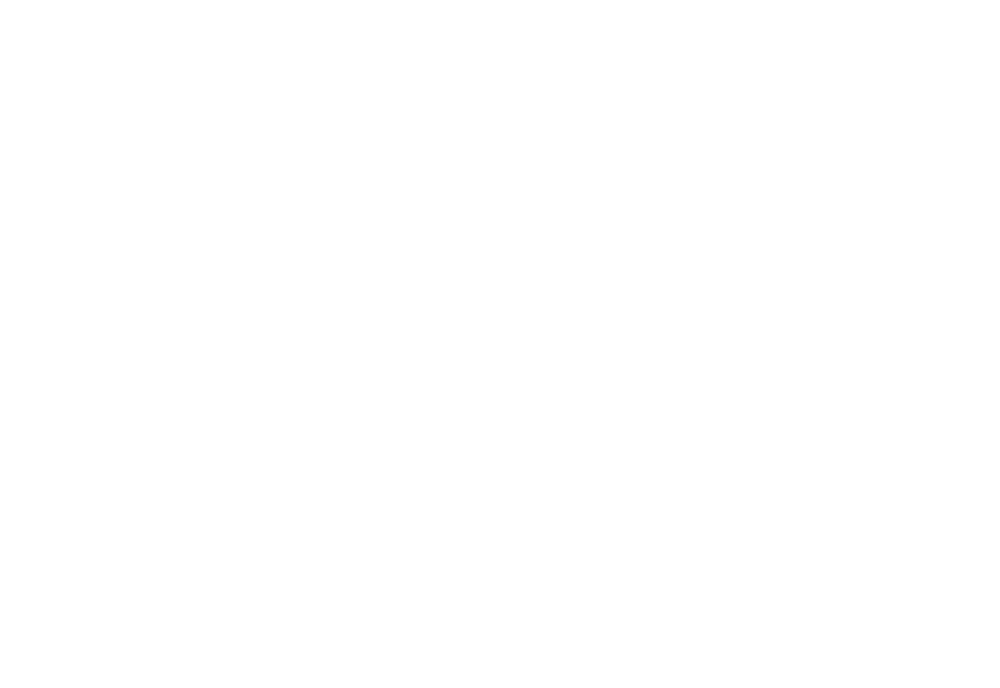

<IPython.core.display.Javascript object>


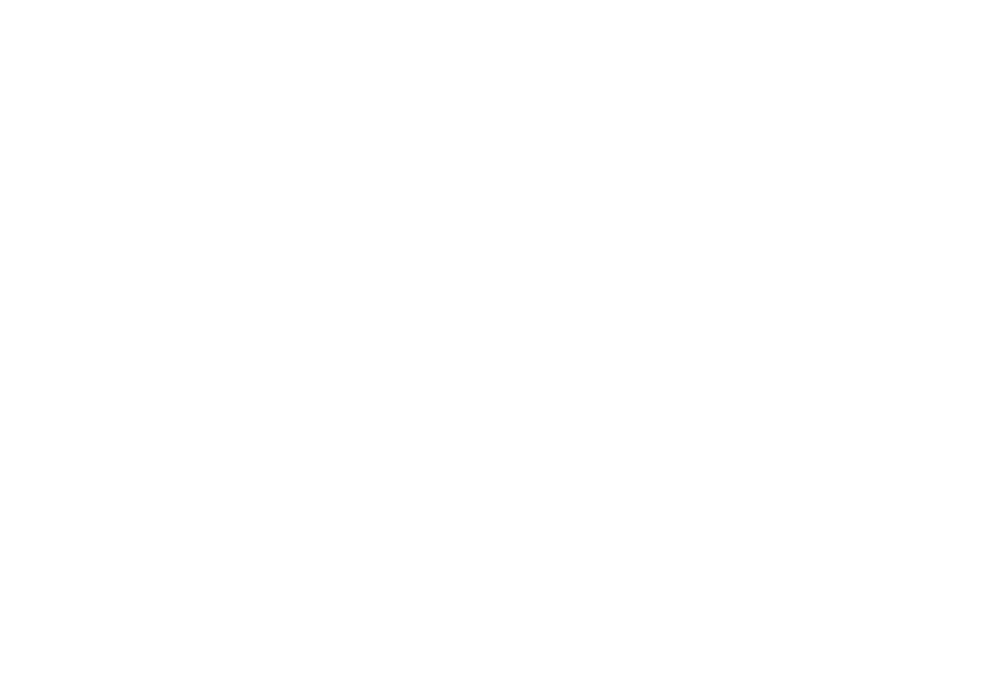

<IPython.core.display.Javascript object>


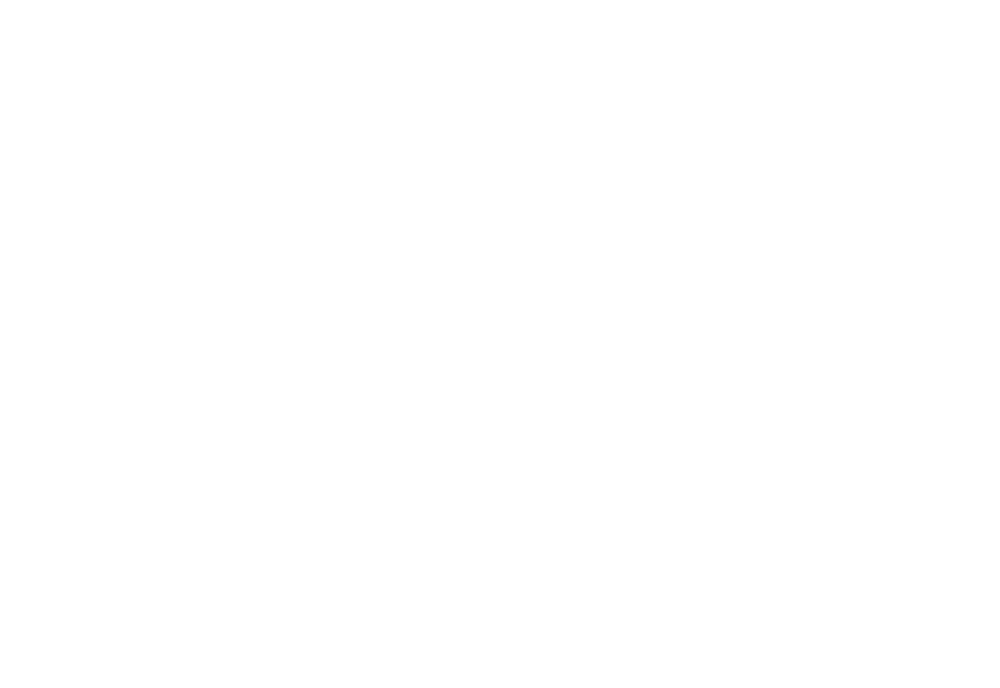

<IPython.core.display.Javascript object>


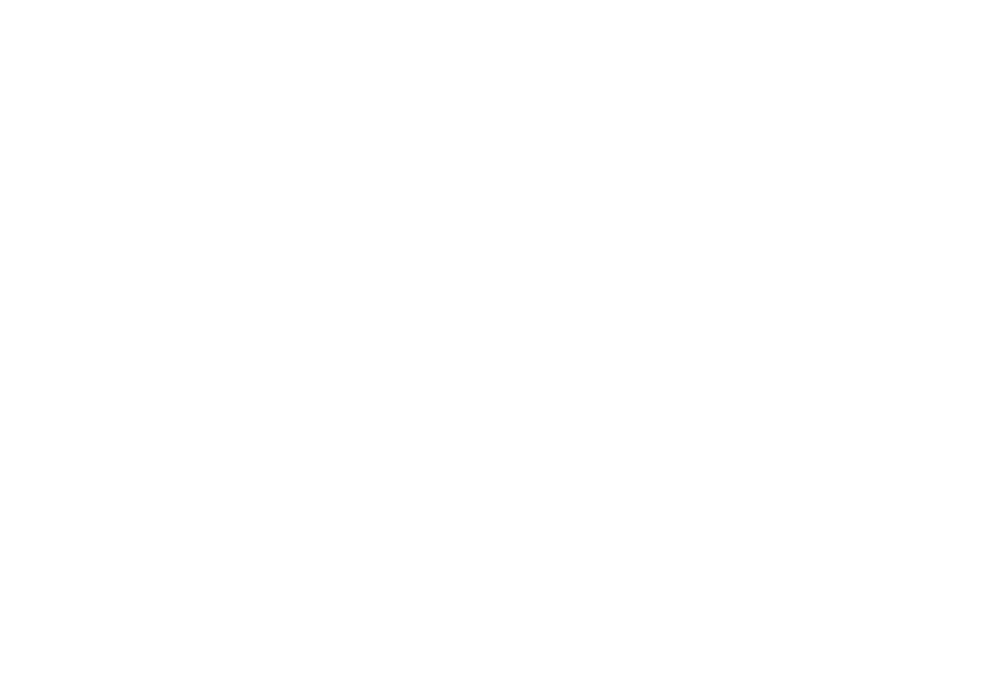

<IPython.core.display.Javascript object>


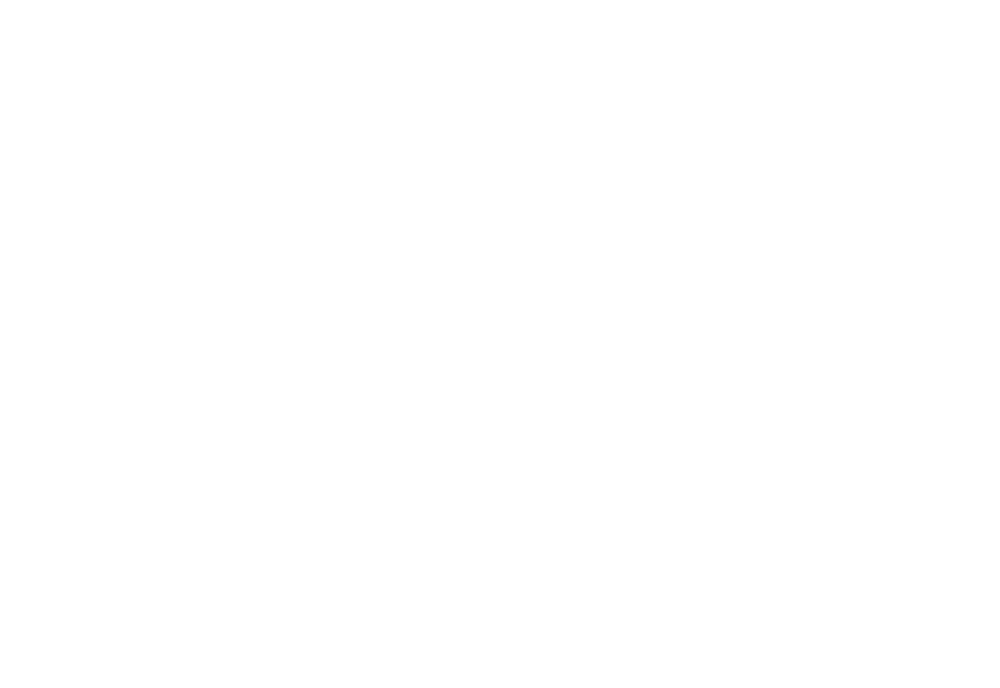

<IPython.core.display.Javascript object>


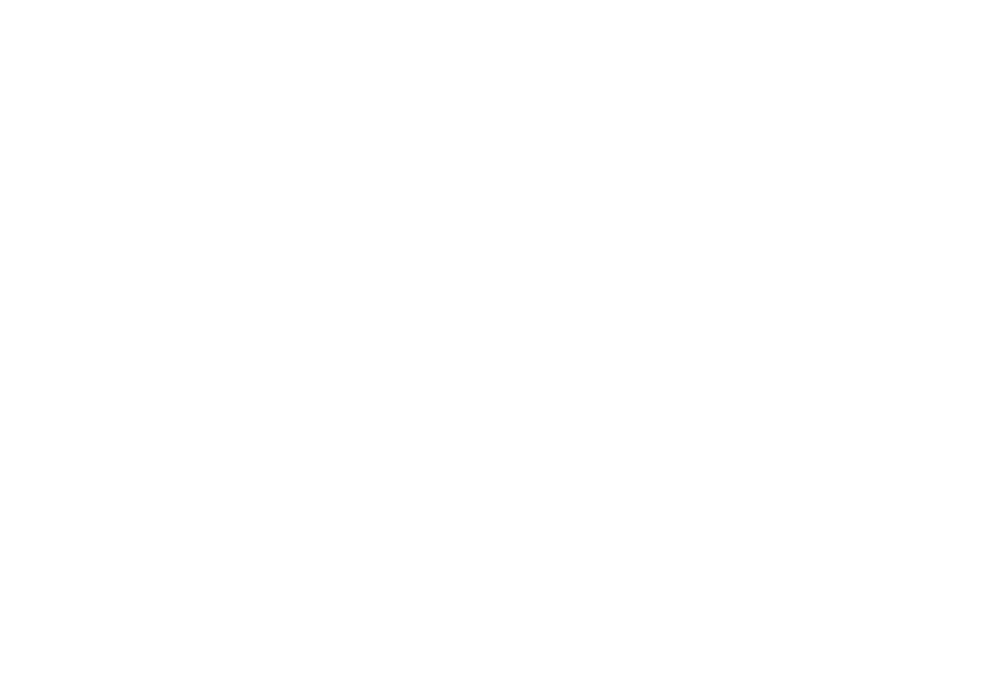

<IPython.core.display.Javascript object>


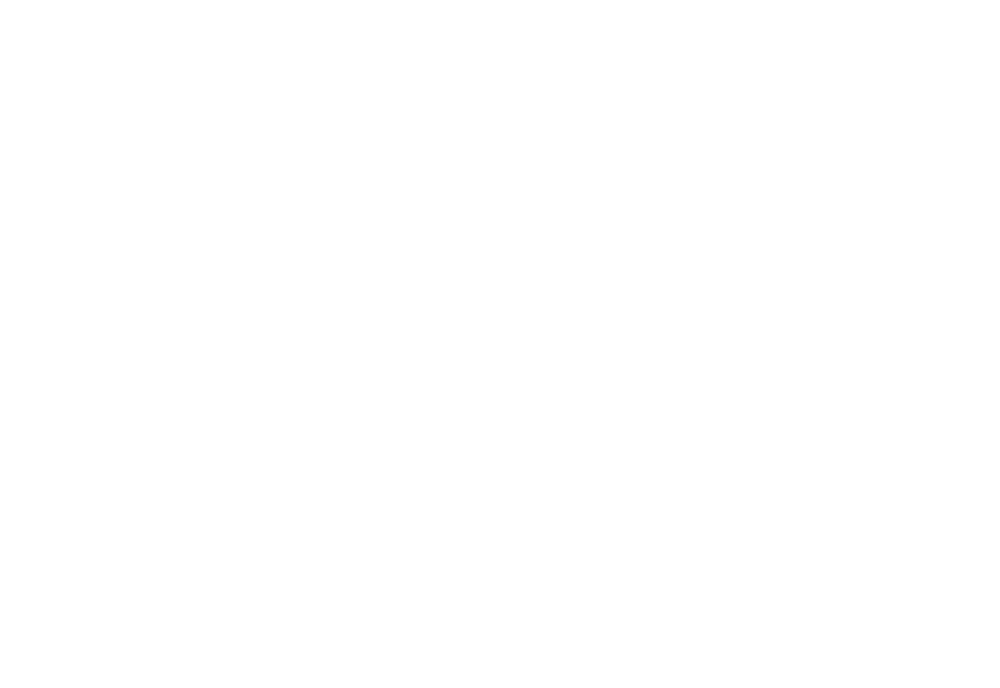

<IPython.core.display.Javascript object>


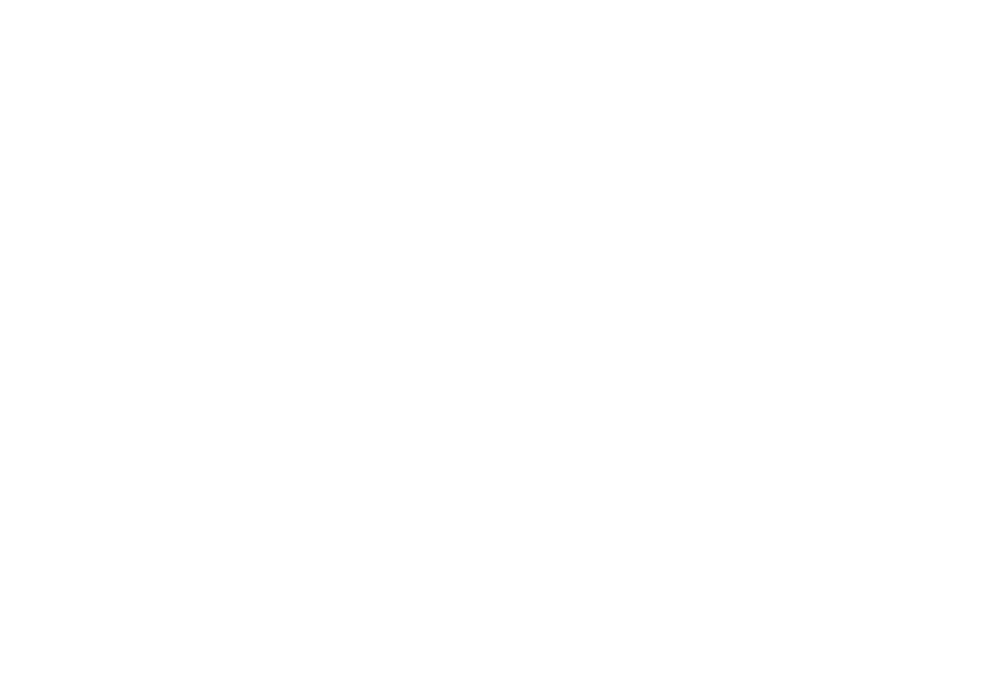

<IPython.core.display.Javascript object>


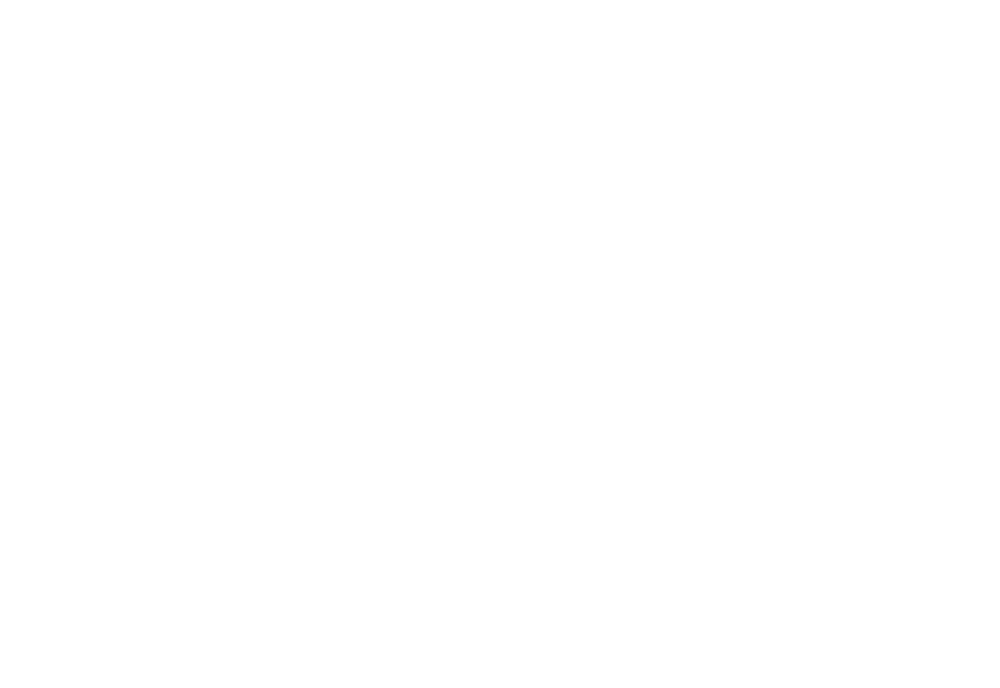

<IPython.core.display.Javascript object>


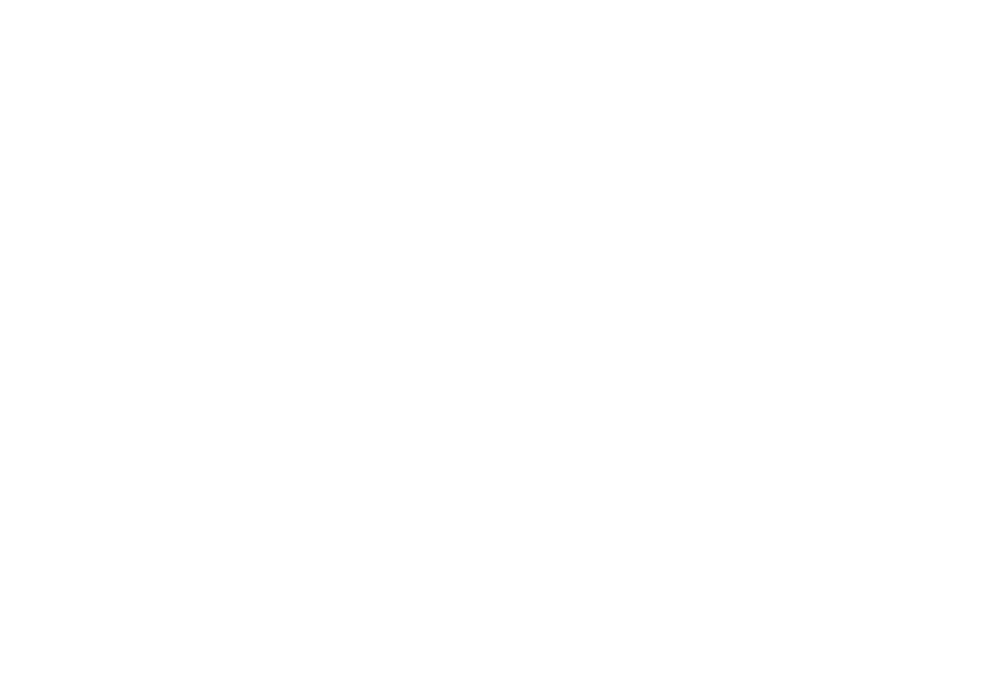

<IPython.core.display.Javascript object>


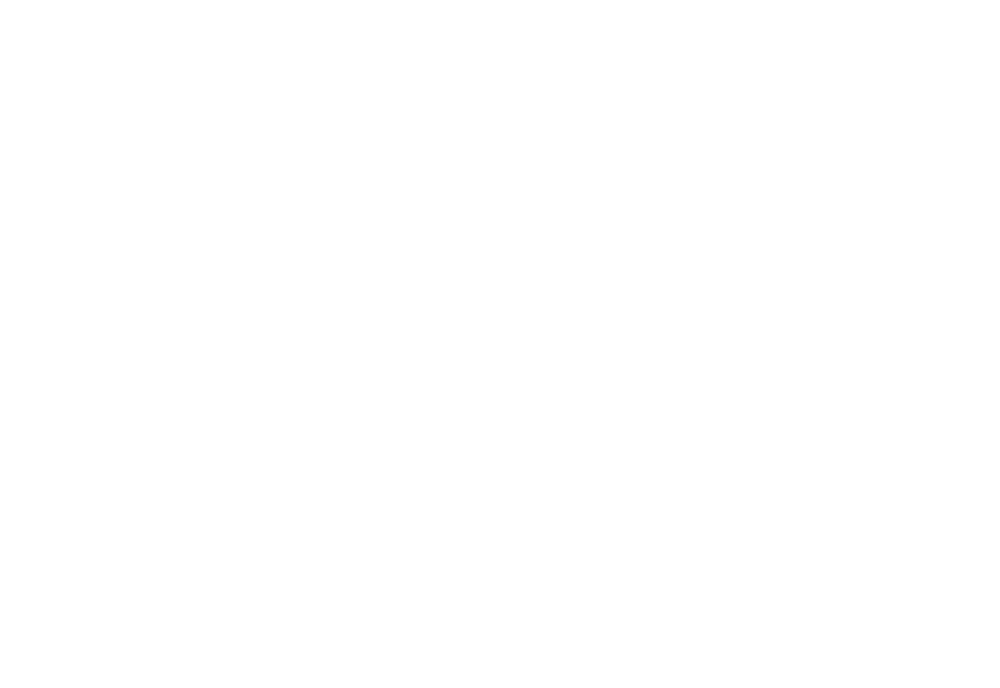

<IPython.core.display.Javascript object>


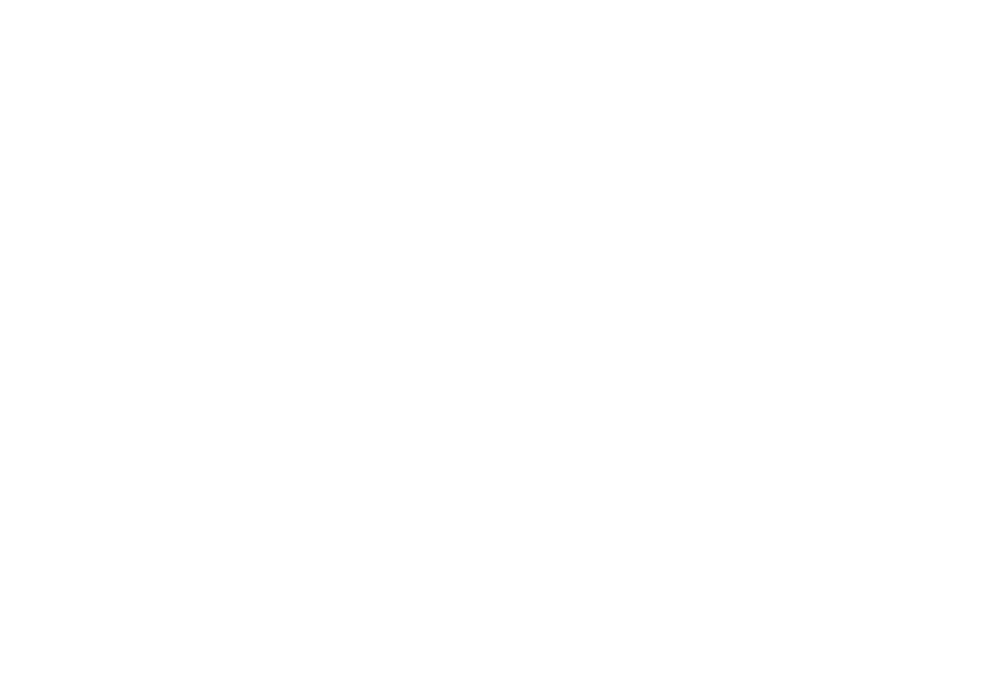

<IPython.core.display.Javascript object>


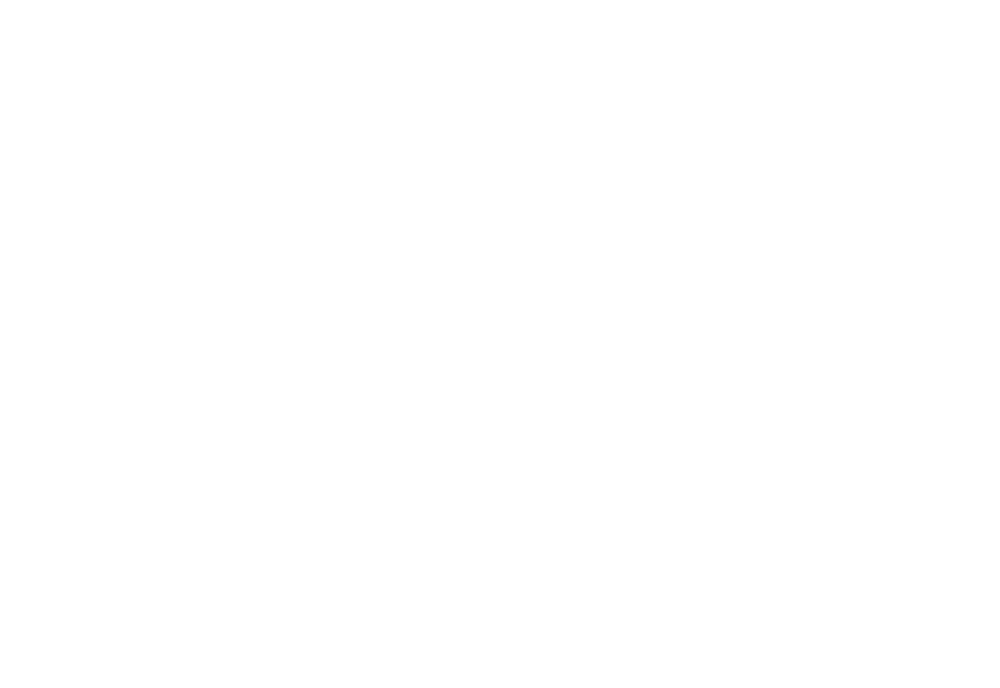

<IPython.core.display.Javascript object>


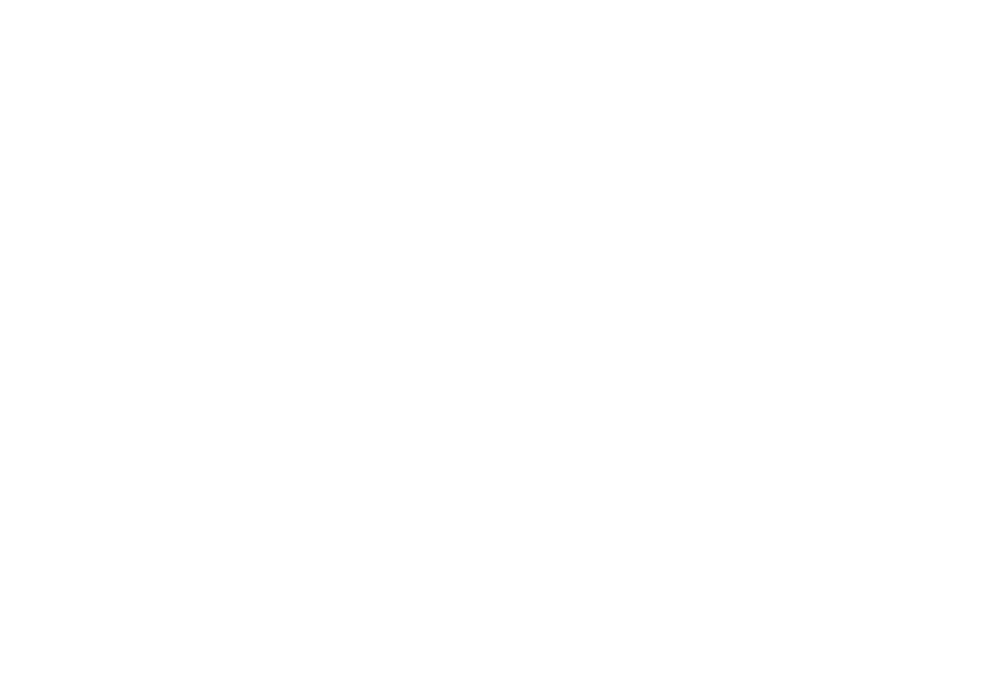

<IPython.core.display.Javascript object>


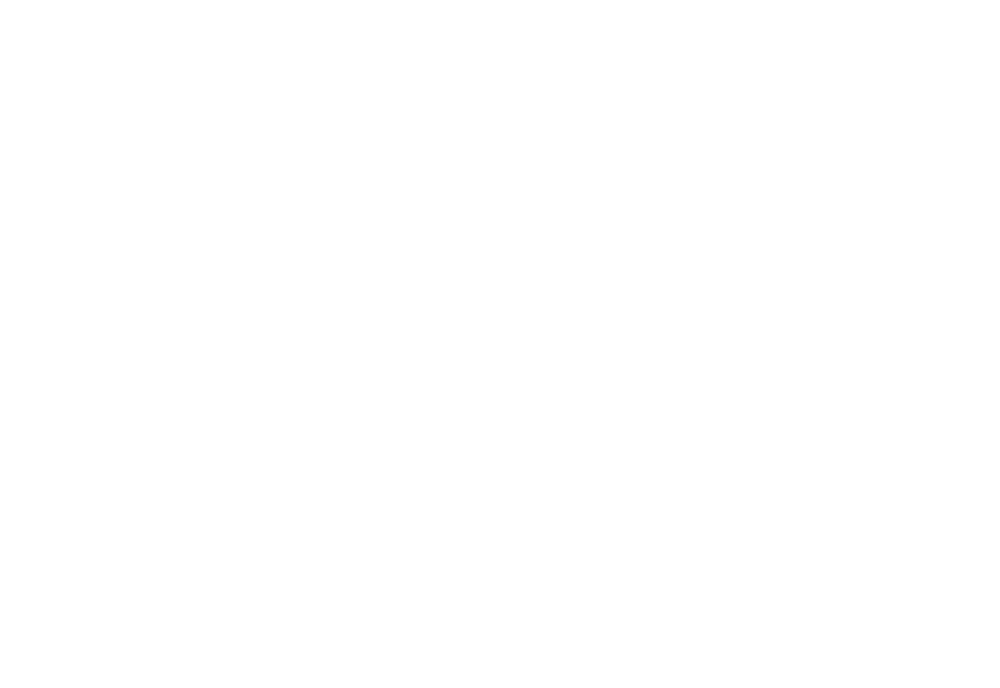

<IPython.core.display.Javascript object>


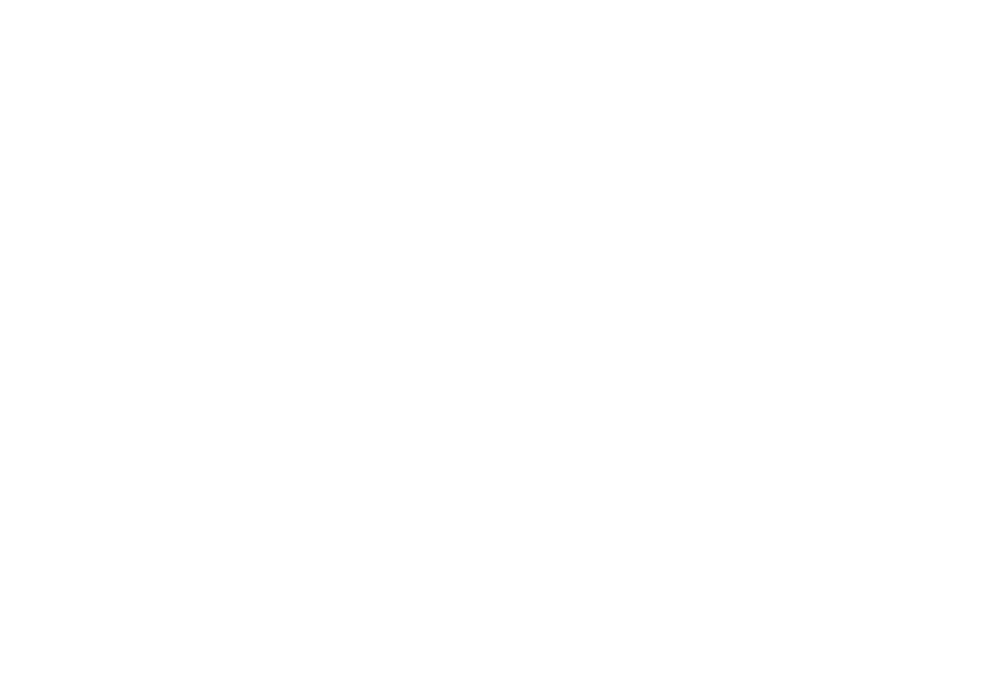

<IPython.core.display.Javascript object>


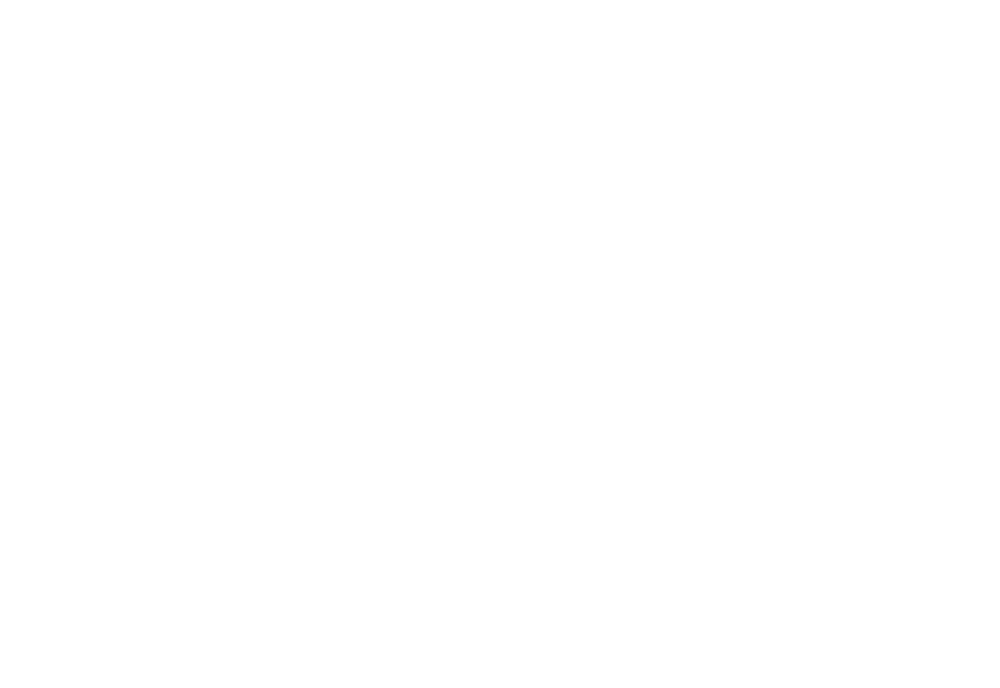

<IPython.core.display.Javascript object>


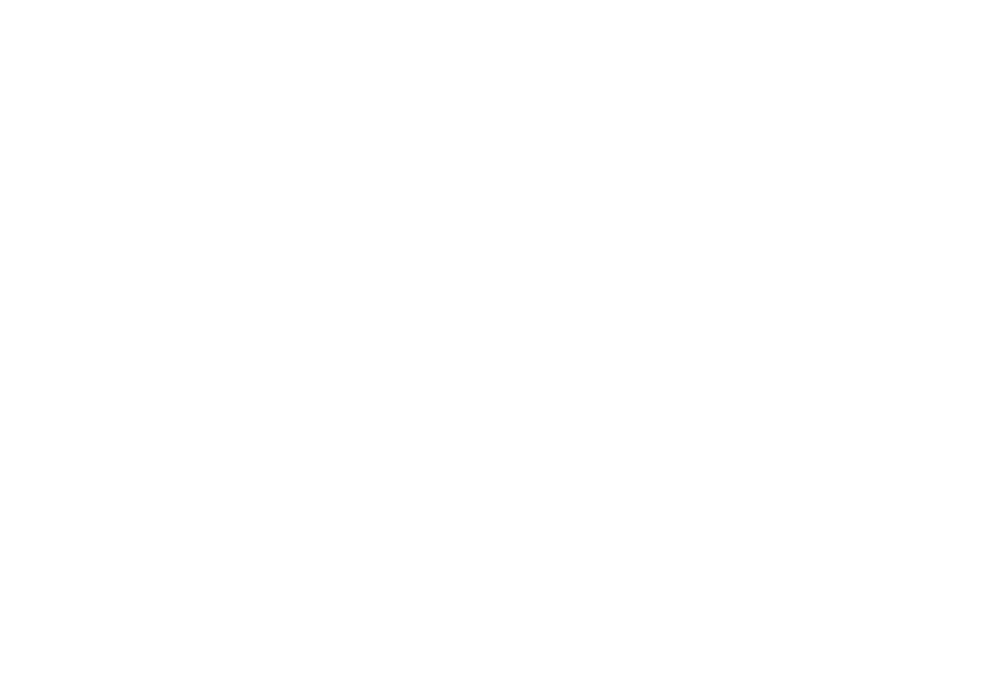

<IPython.core.display.Javascript object>


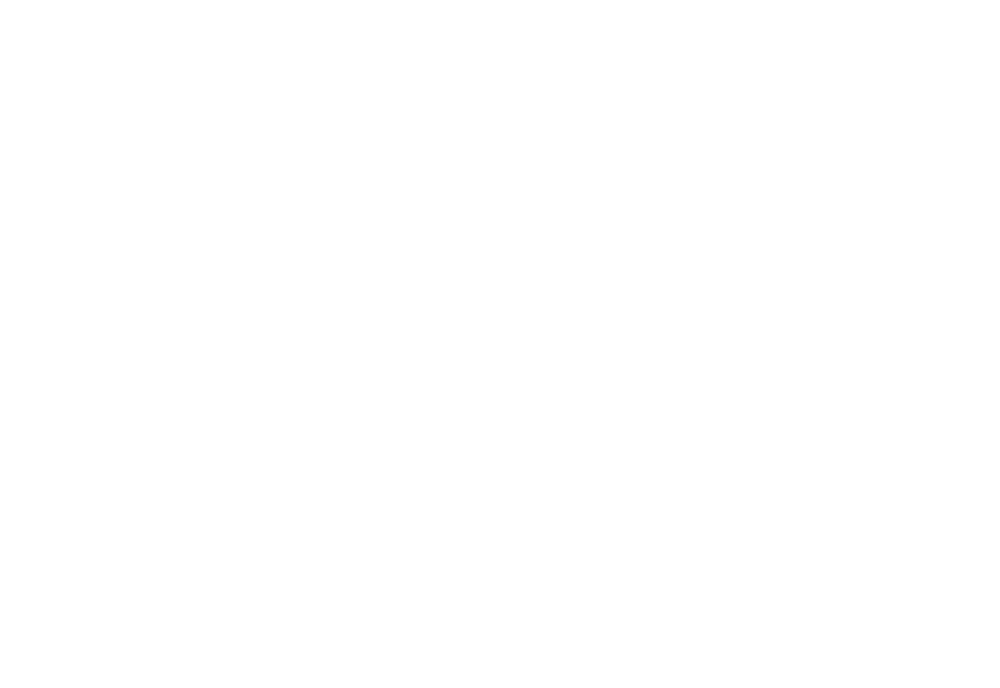

<IPython.core.display.Javascript object>


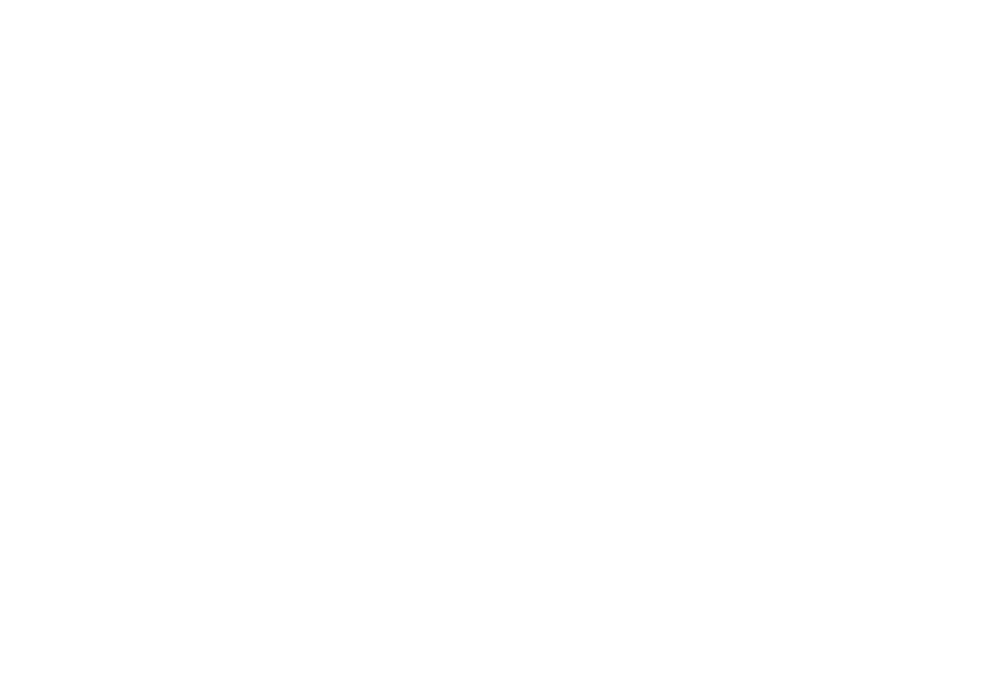

<IPython.core.display.Javascript object>


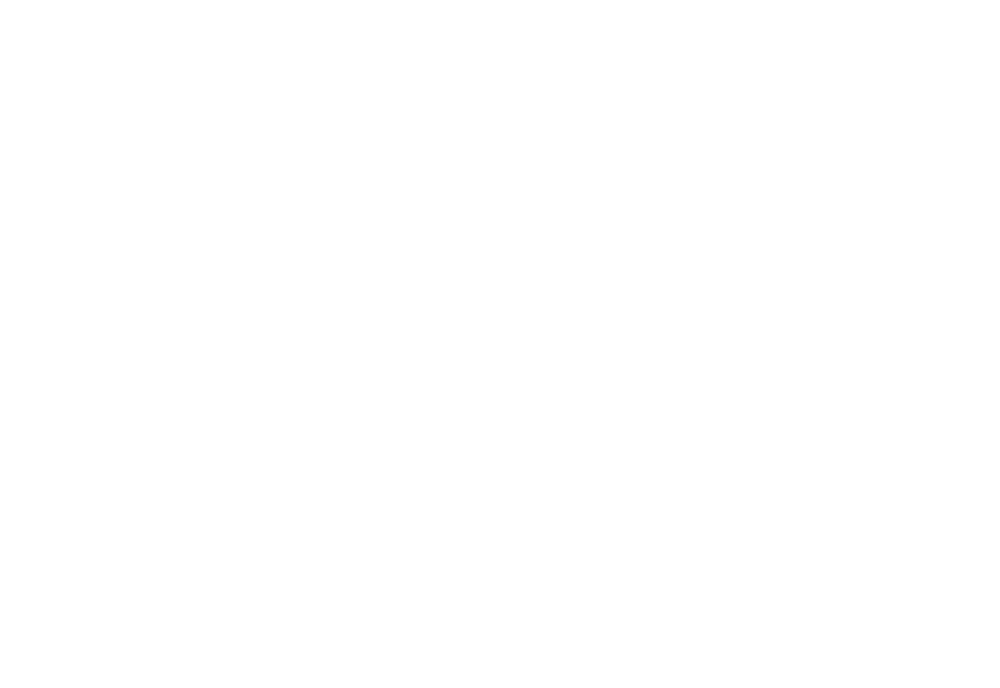

<IPython.core.display.Javascript object>


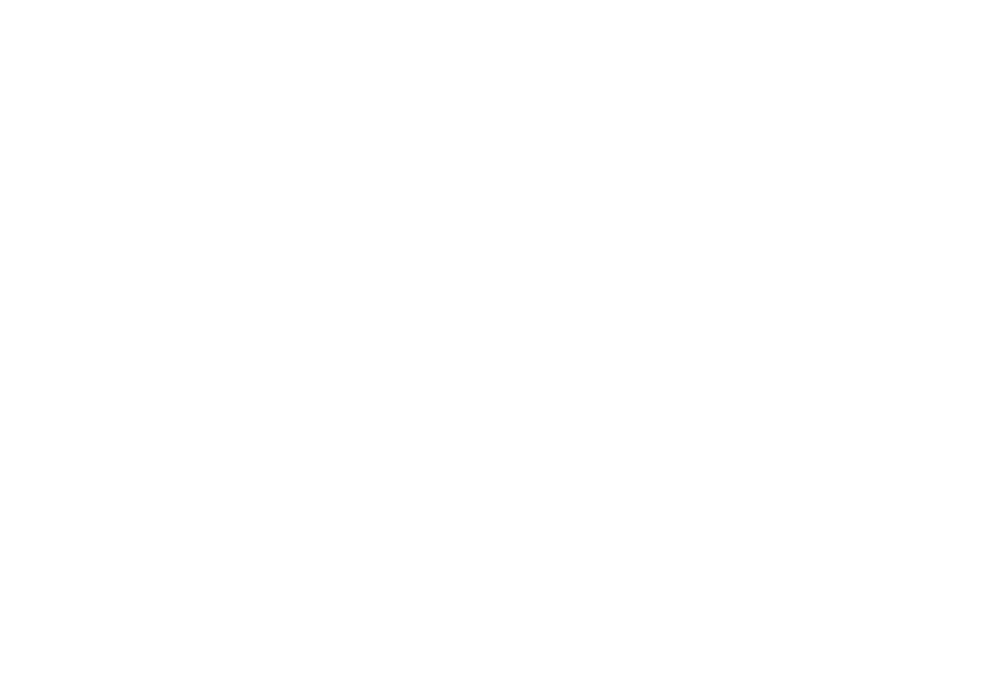

<IPython.core.display.Javascript object>


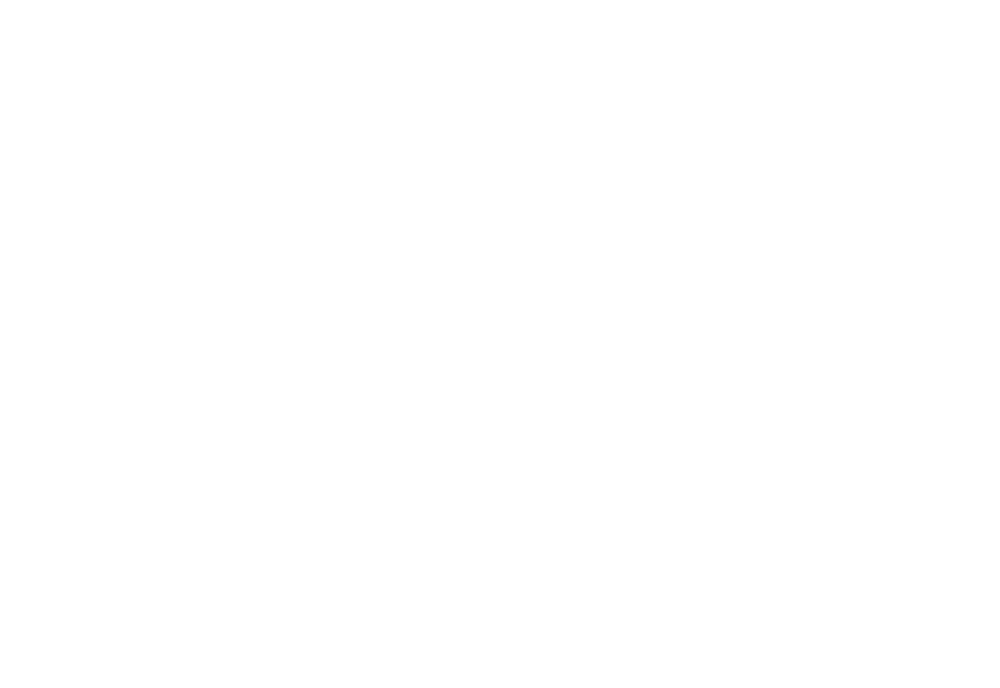

<IPython.core.display.Javascript object>


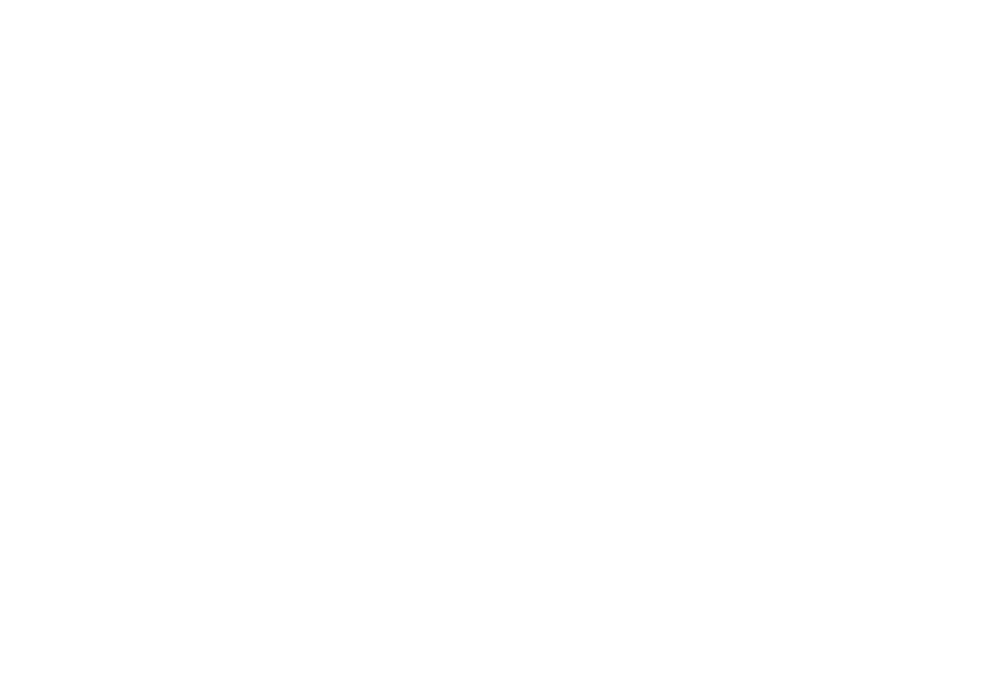

<IPython.core.display.Javascript object>


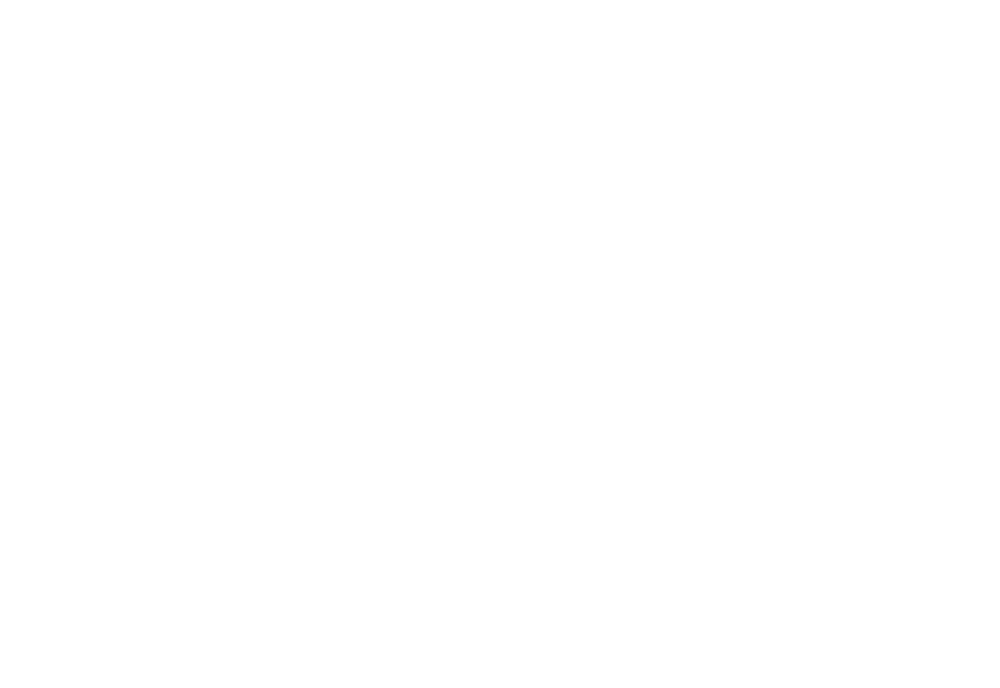

<IPython.core.display.Javascript object>


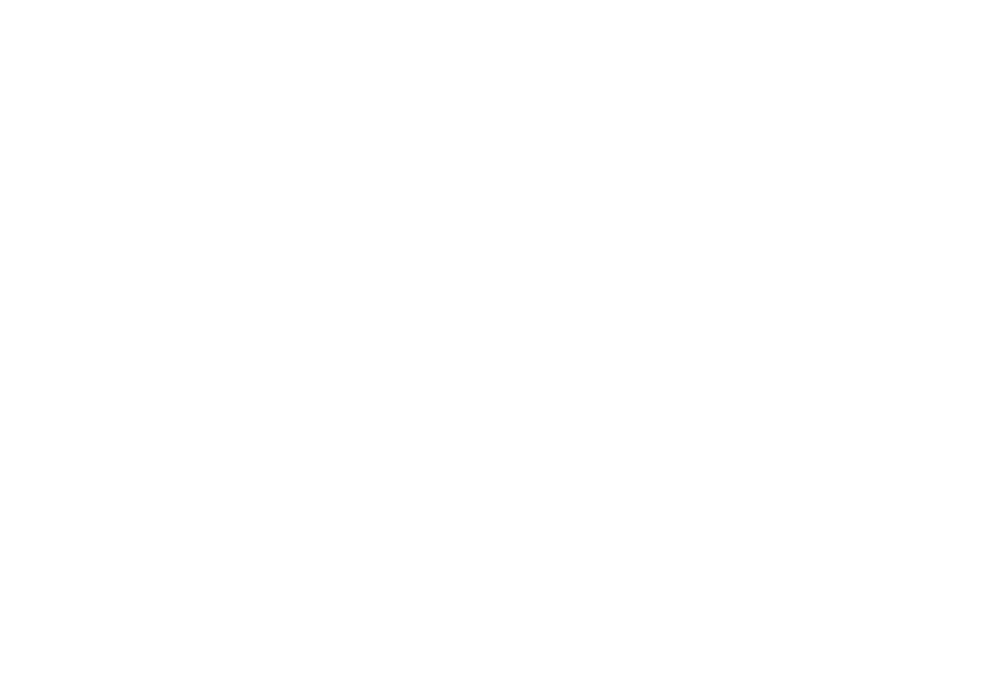

<IPython.core.display.Javascript object>


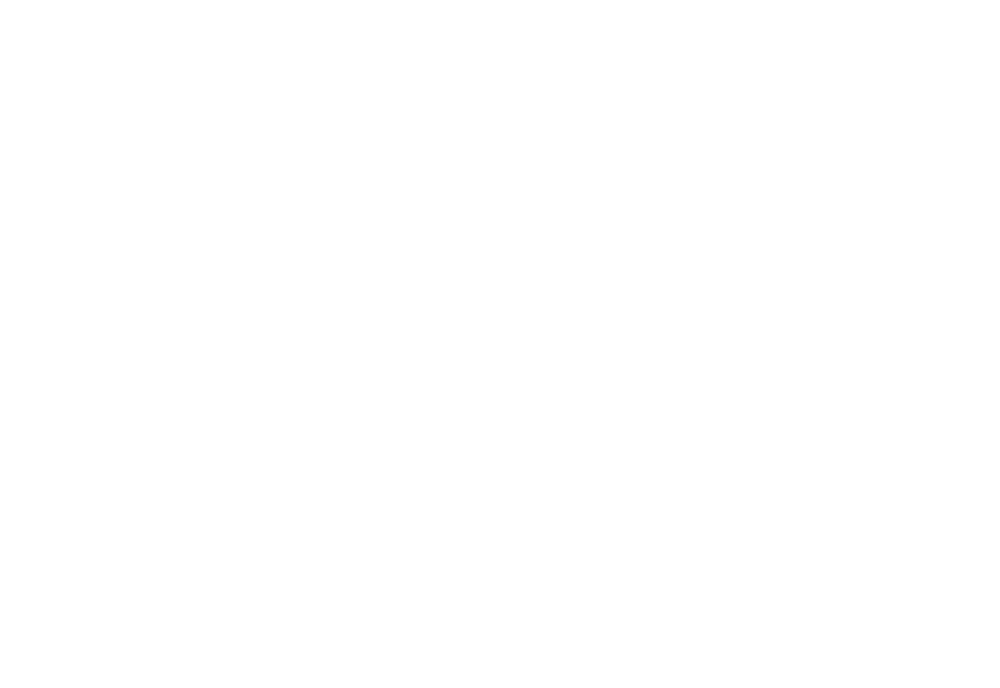

<IPython.core.display.Javascript object>


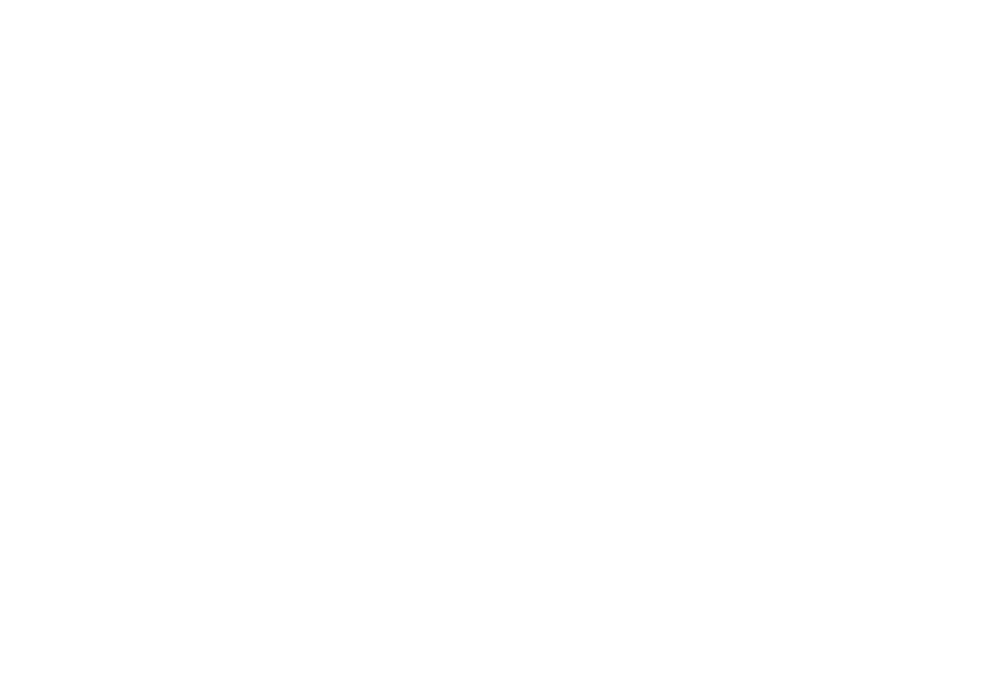

<IPython.core.display.Javascript object>


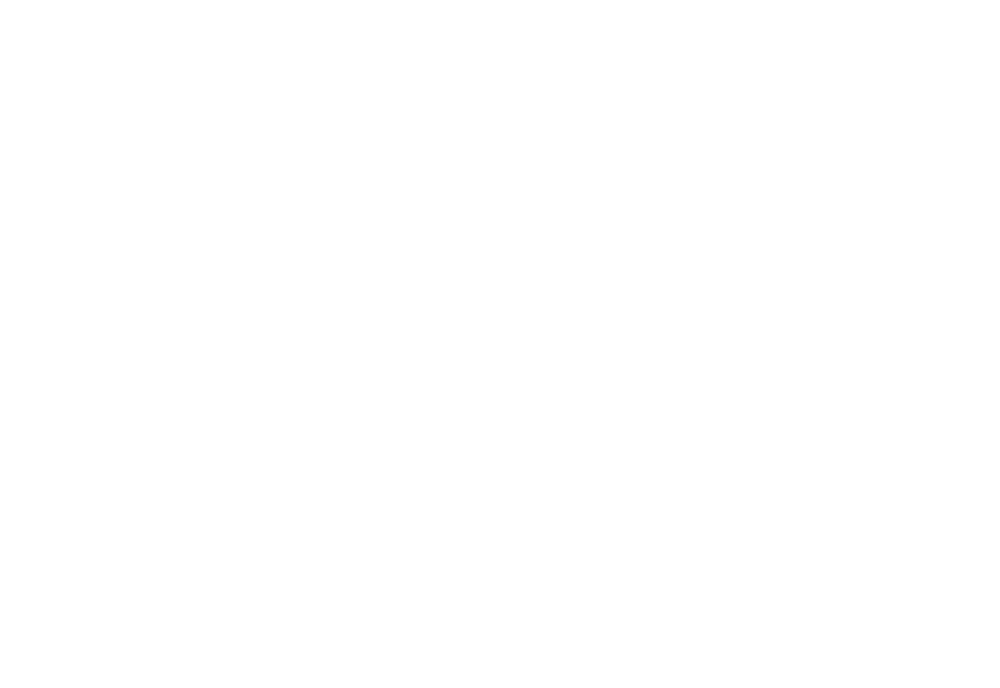

<IPython.core.display.Javascript object>


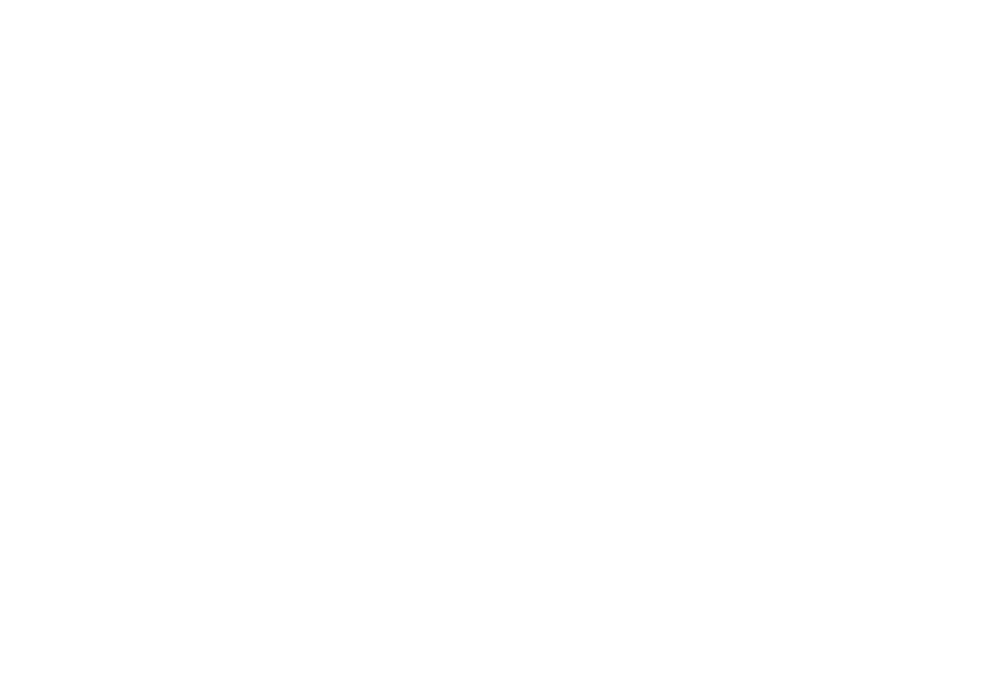

<IPython.core.display.Javascript object>


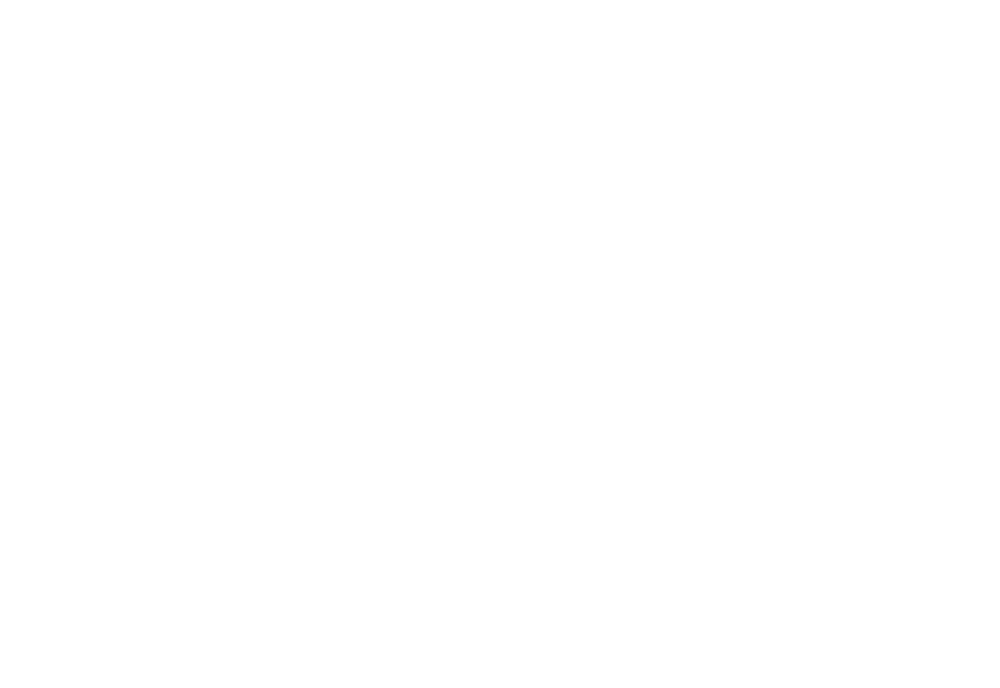

<IPython.core.display.Javascript object>


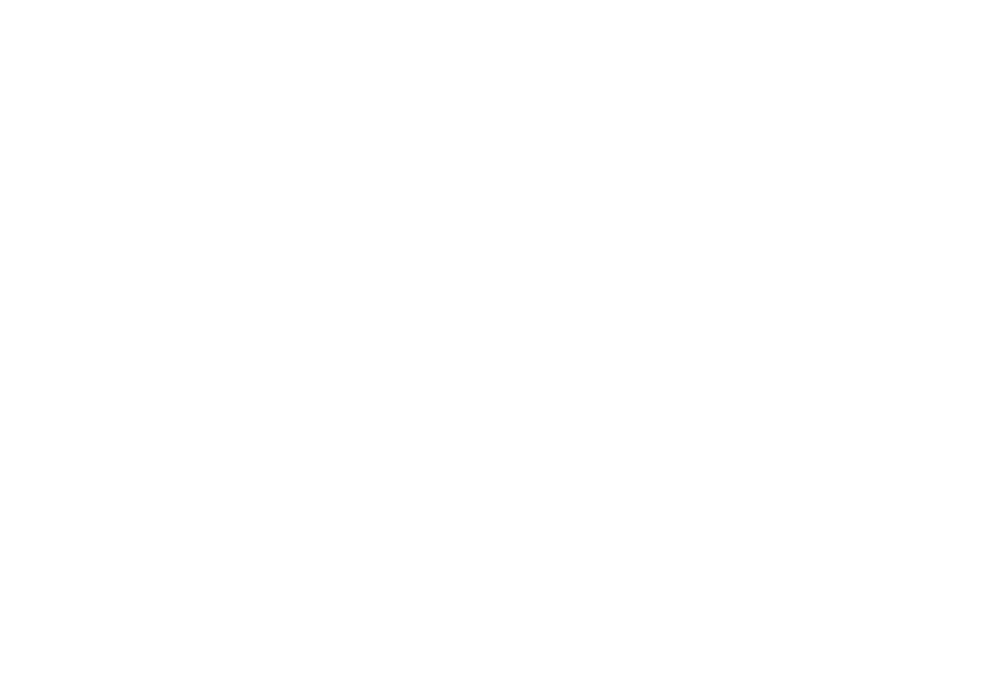

<IPython.core.display.Javascript object>


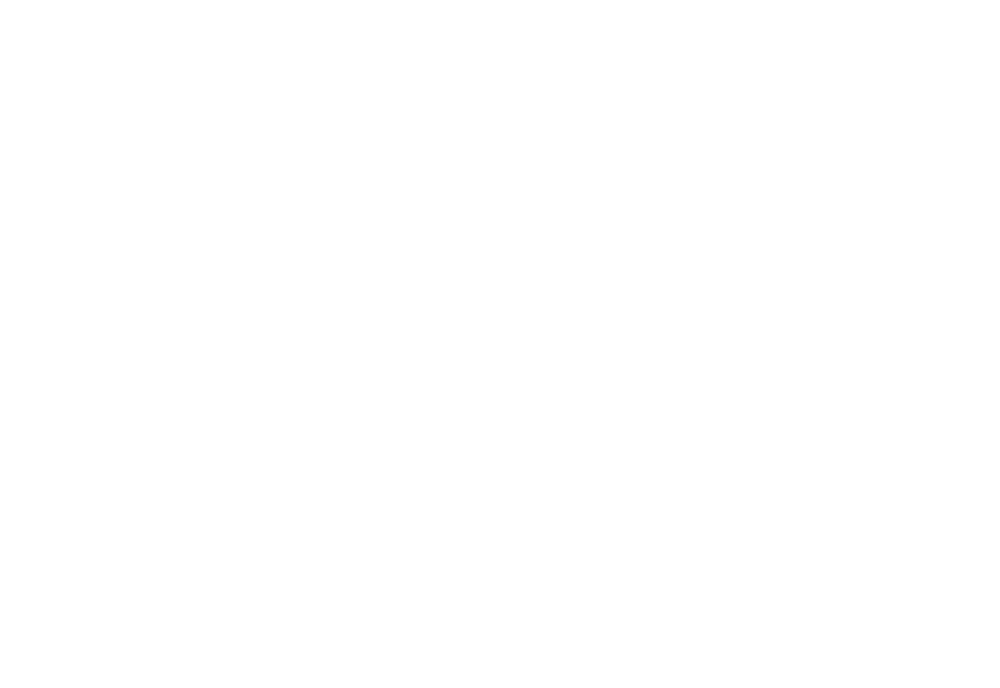

<IPython.core.display.Javascript object>


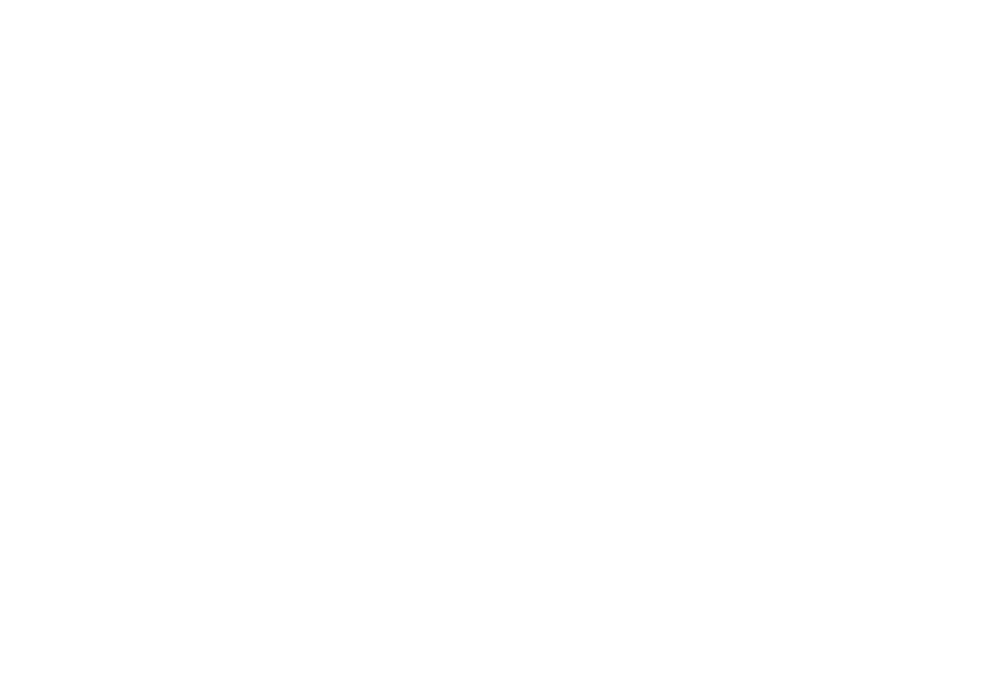

<IPython.core.display.Javascript object>


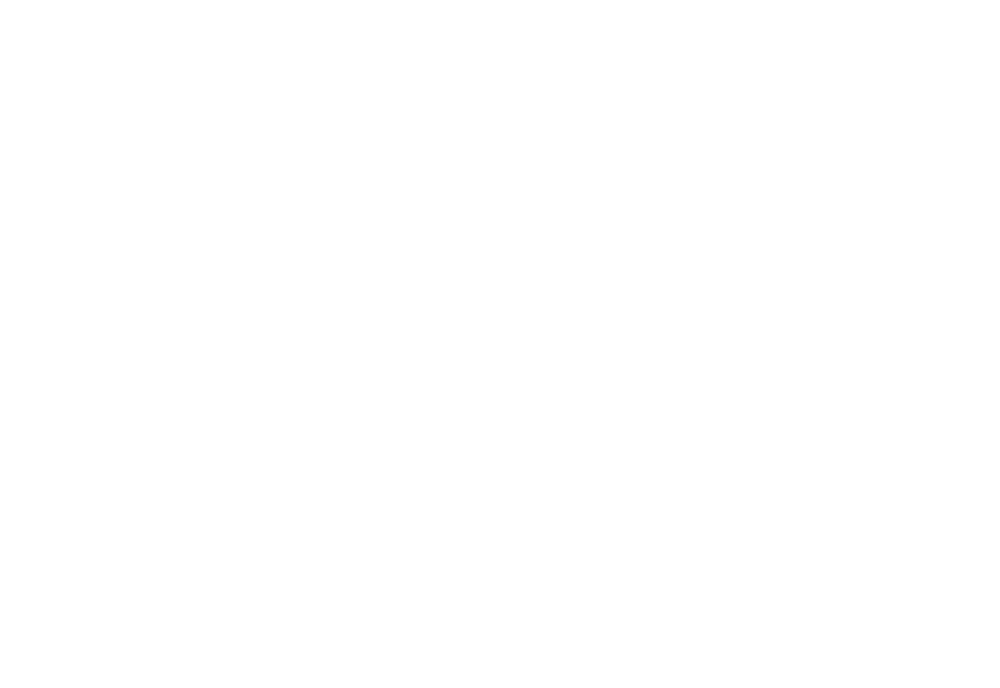

<IPython.core.display.Javascript object>


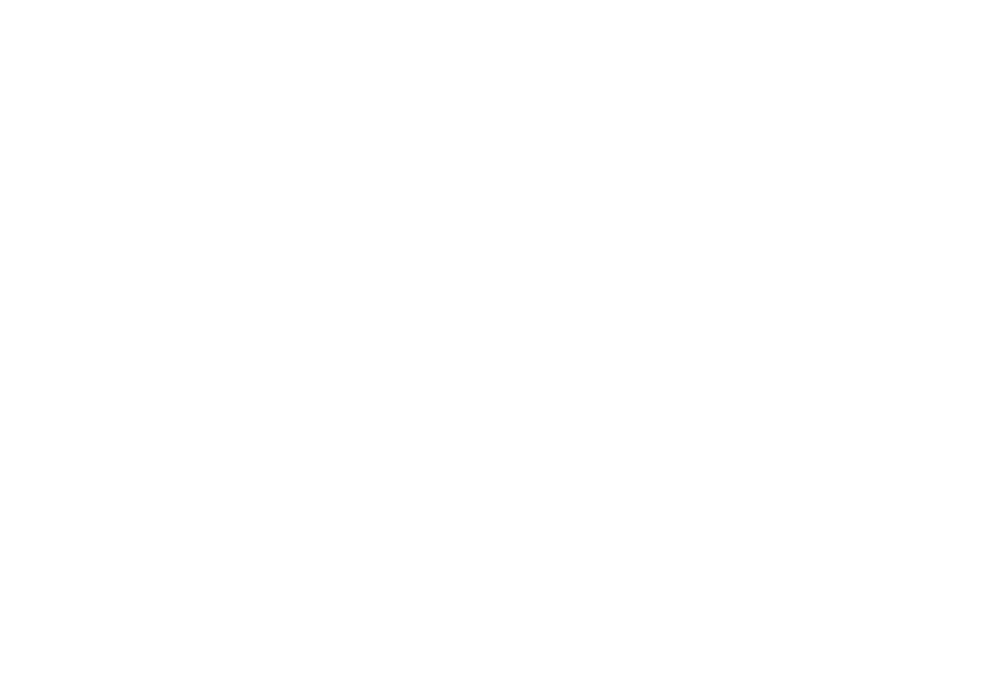

<IPython.core.display.Javascript object>


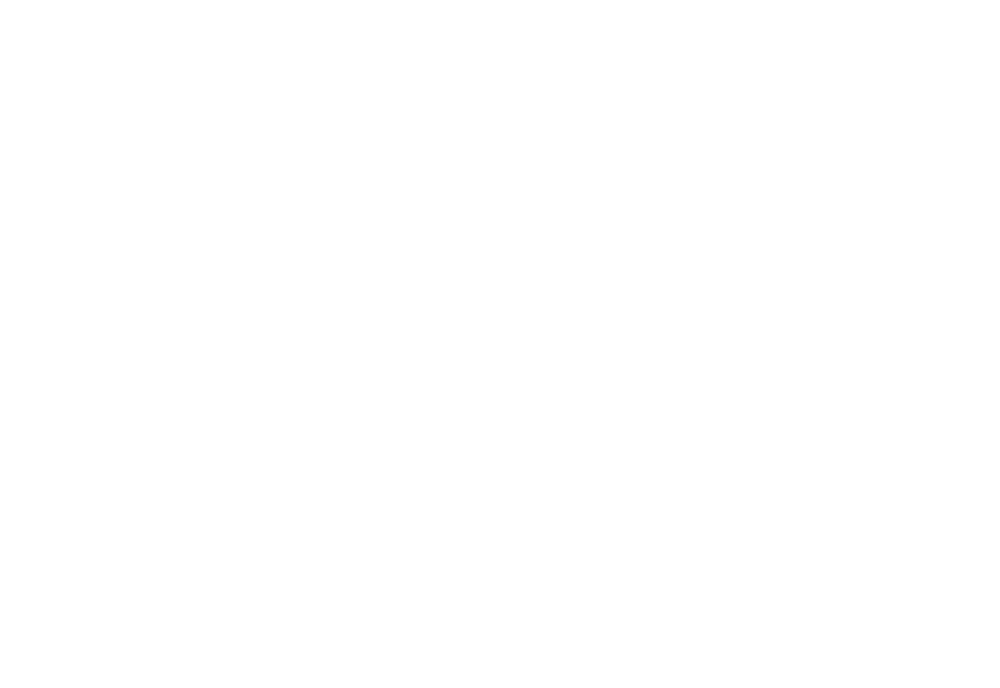

<IPython.core.display.Javascript object>


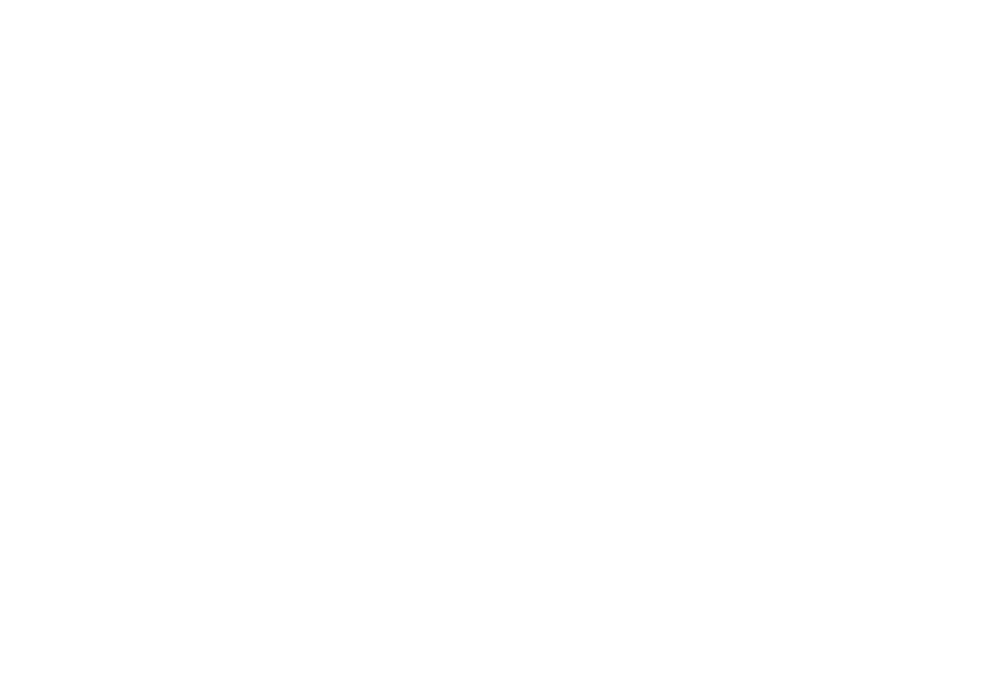

<IPython.core.display.Javascript object>


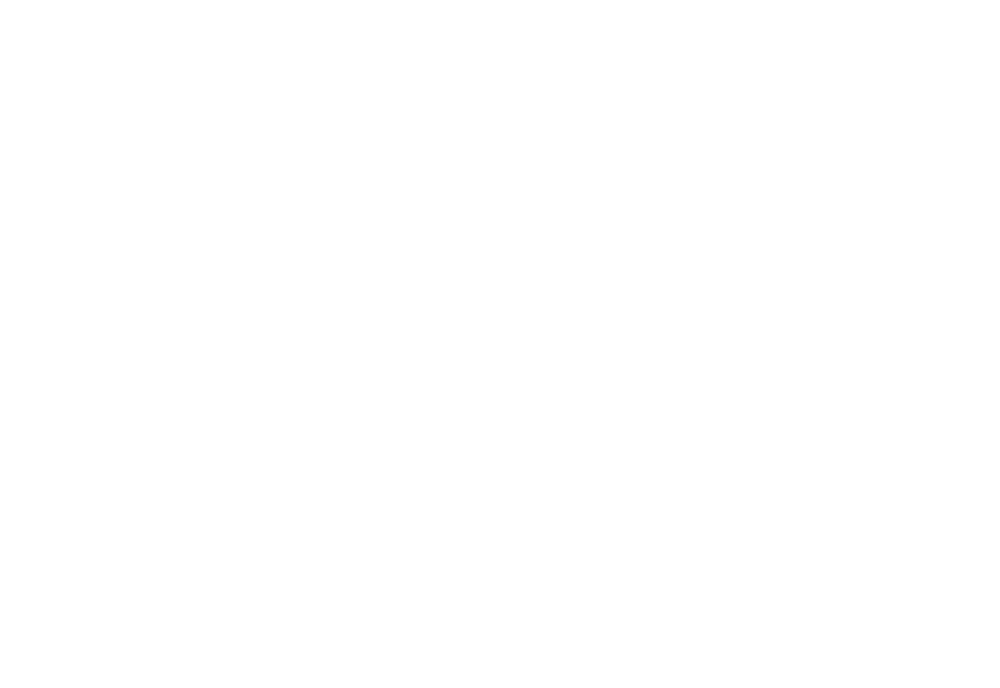

<IPython.core.display.Javascript object>


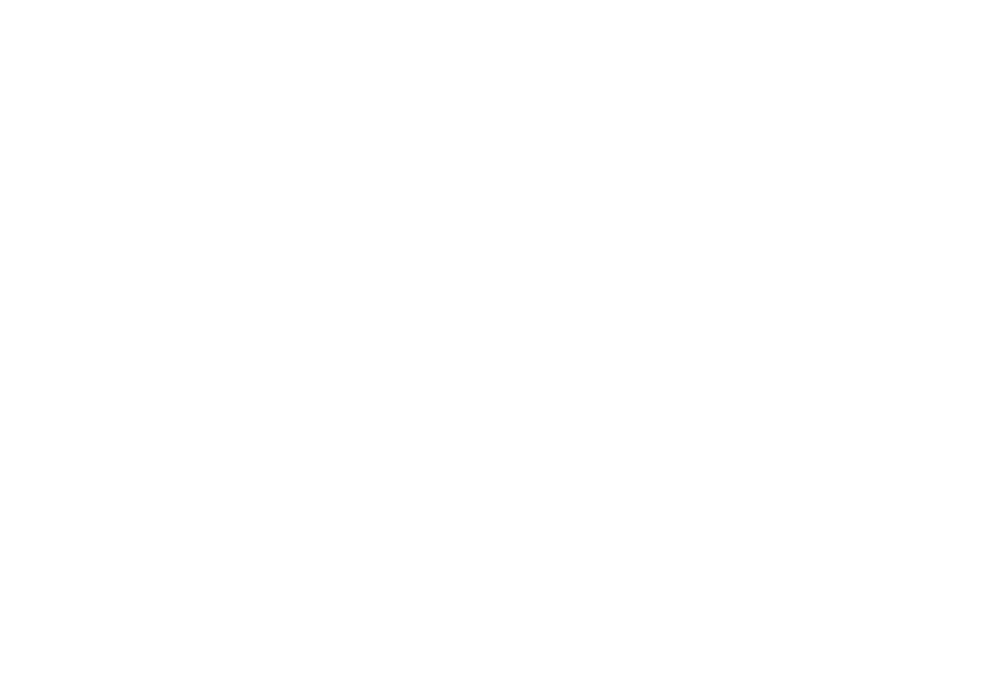

<IPython.core.display.Javascript object>


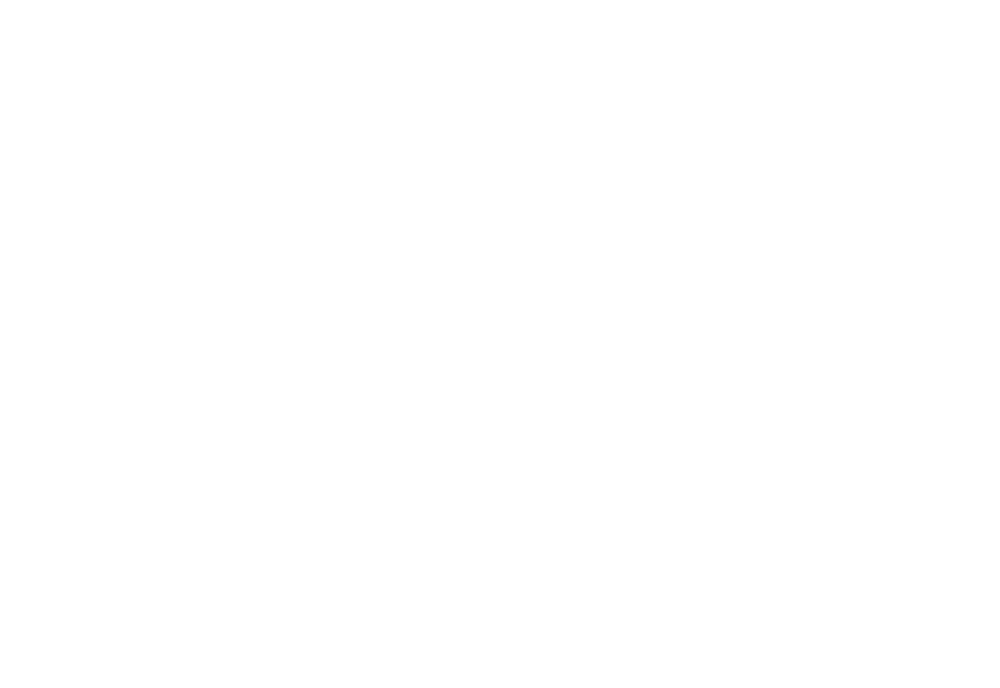

<IPython.core.display.Javascript object>


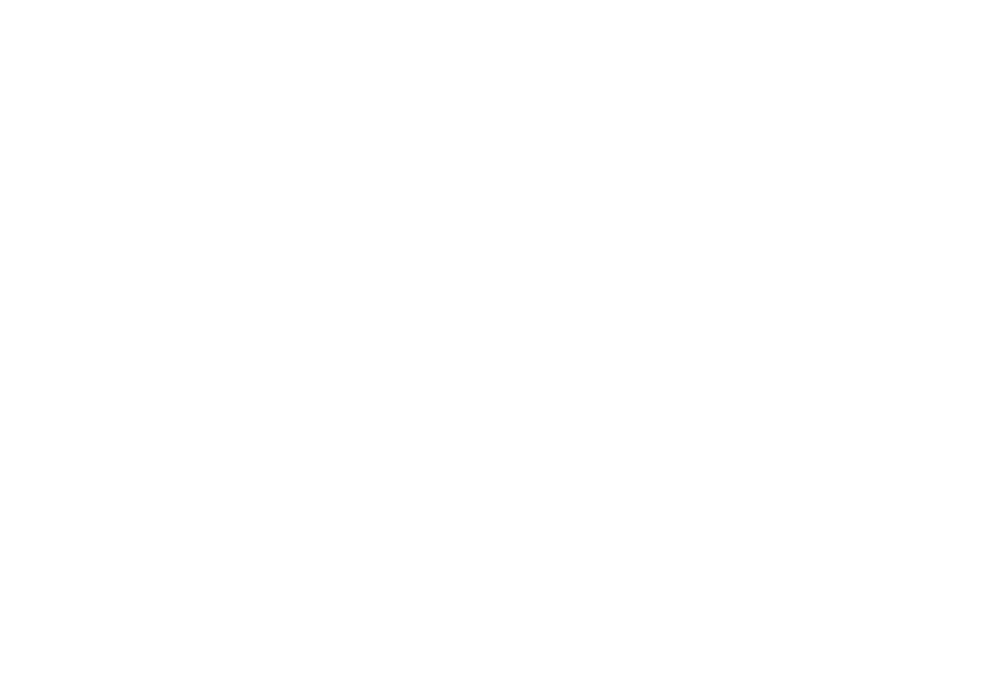

<IPython.core.display.Javascript object>


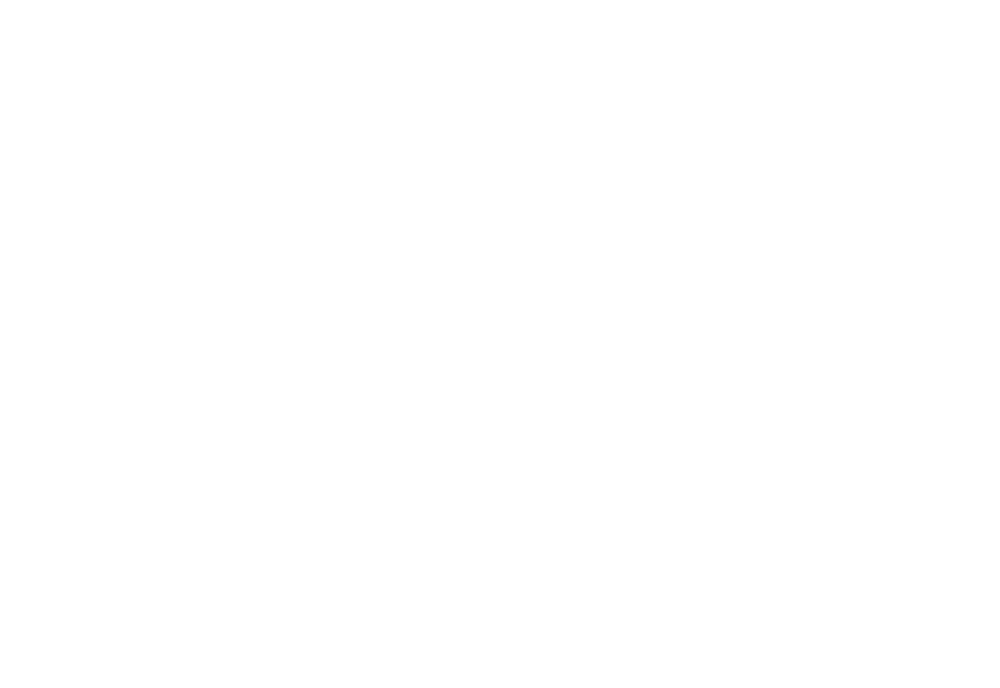

<IPython.core.display.Javascript object>


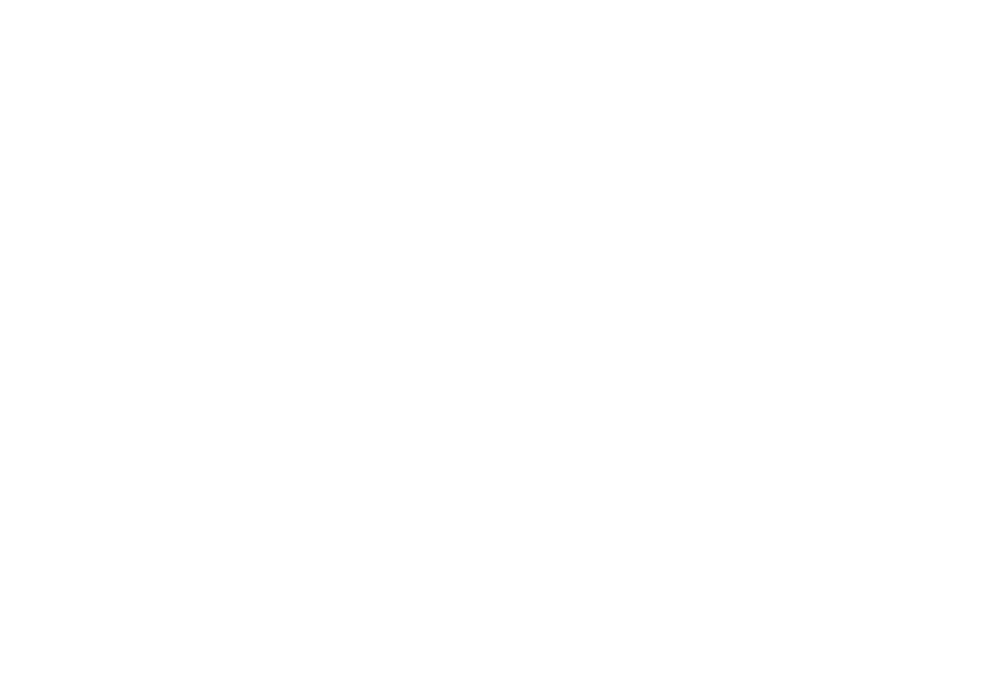

<IPython.core.display.Javascript object>


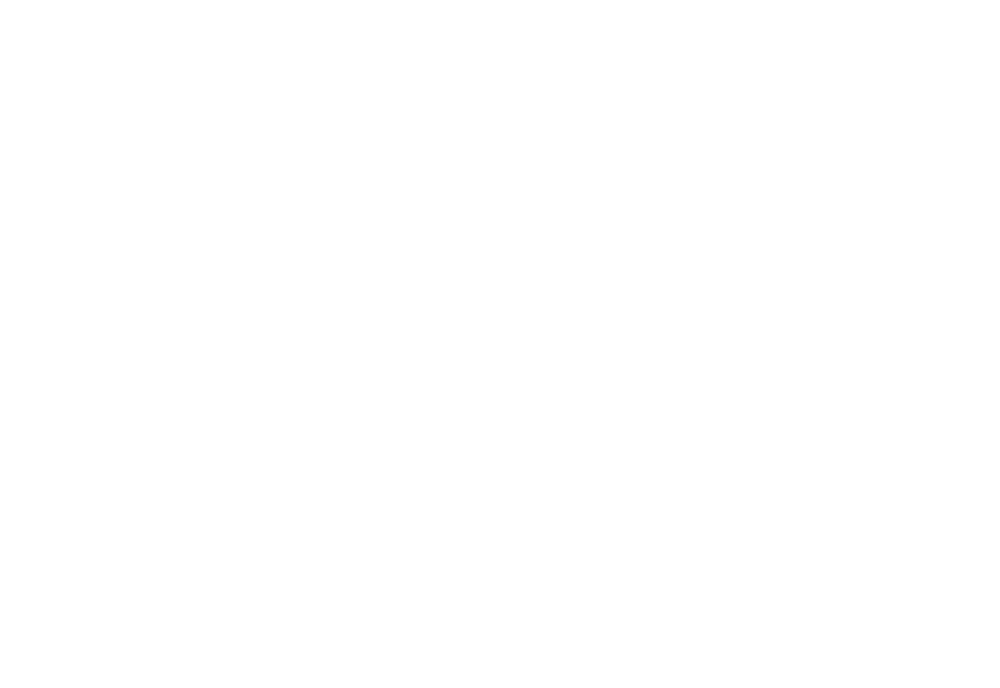

<IPython.core.display.Javascript object>


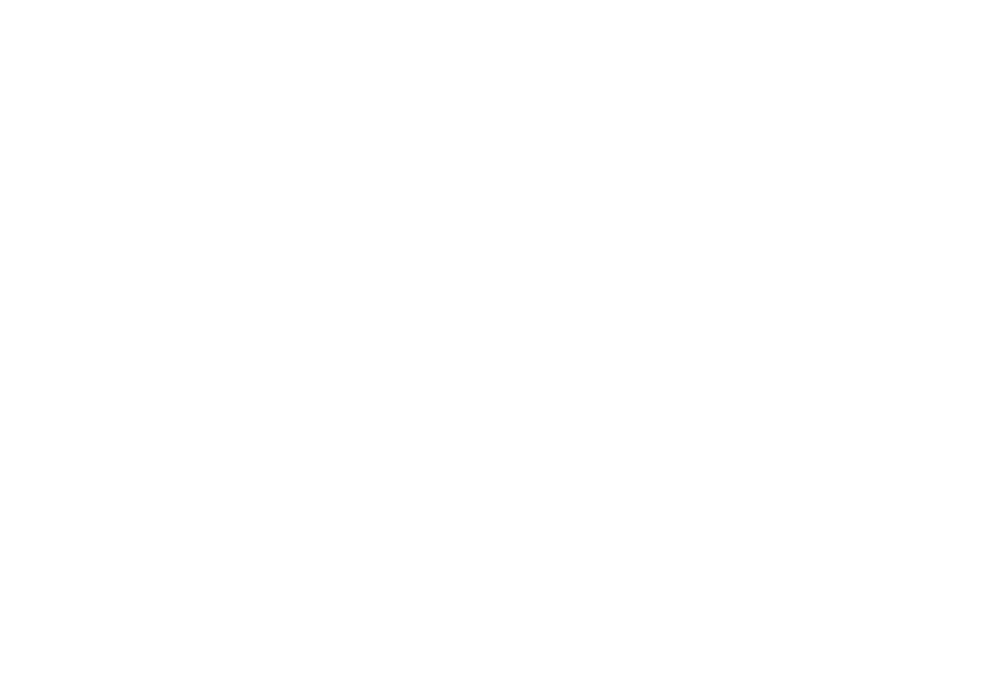

<IPython.core.display.Javascript object>


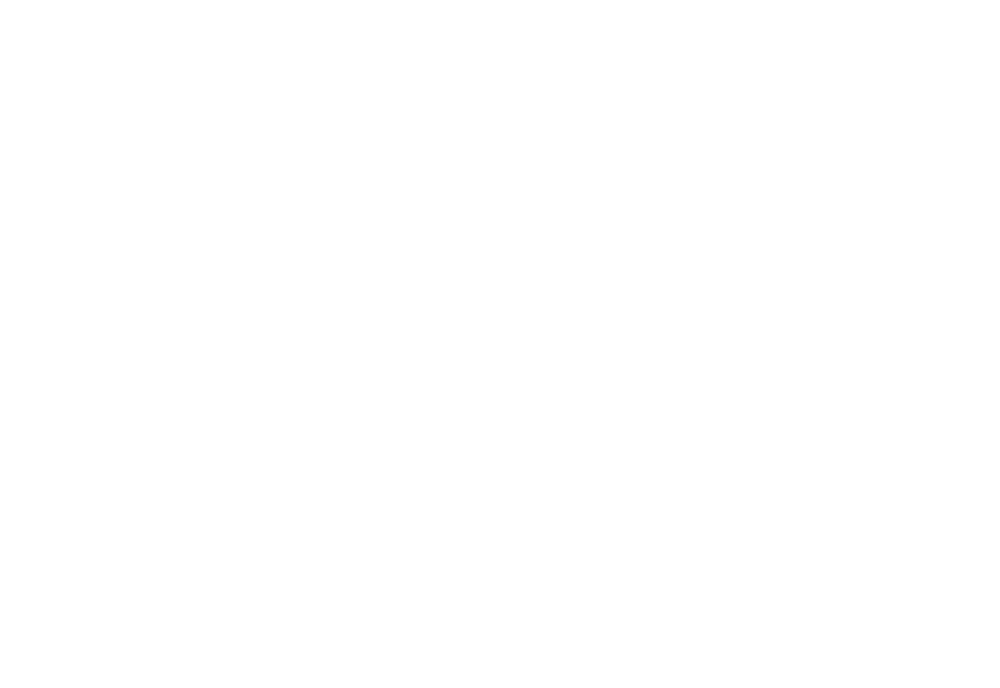

<IPython.core.display.Javascript object>


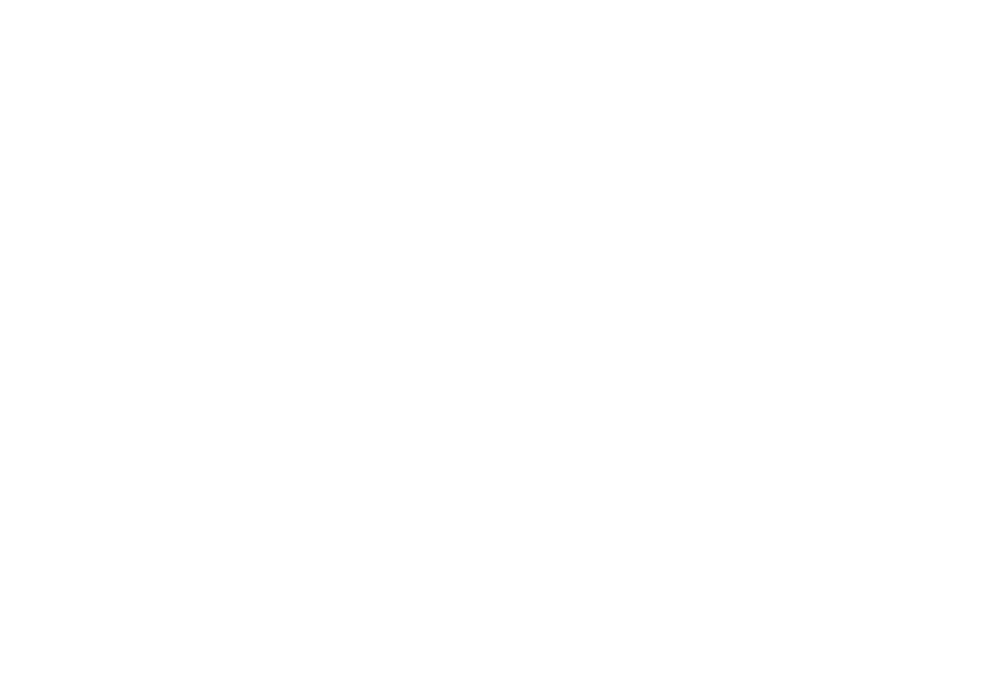

<IPython.core.display.Javascript object>


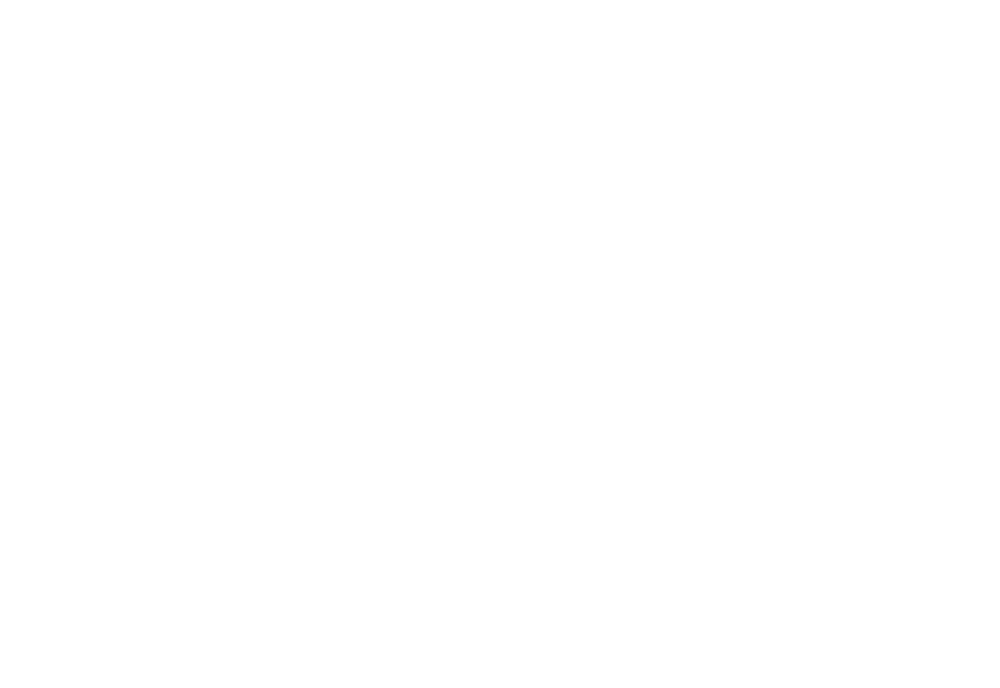

<IPython.core.display.Javascript object>


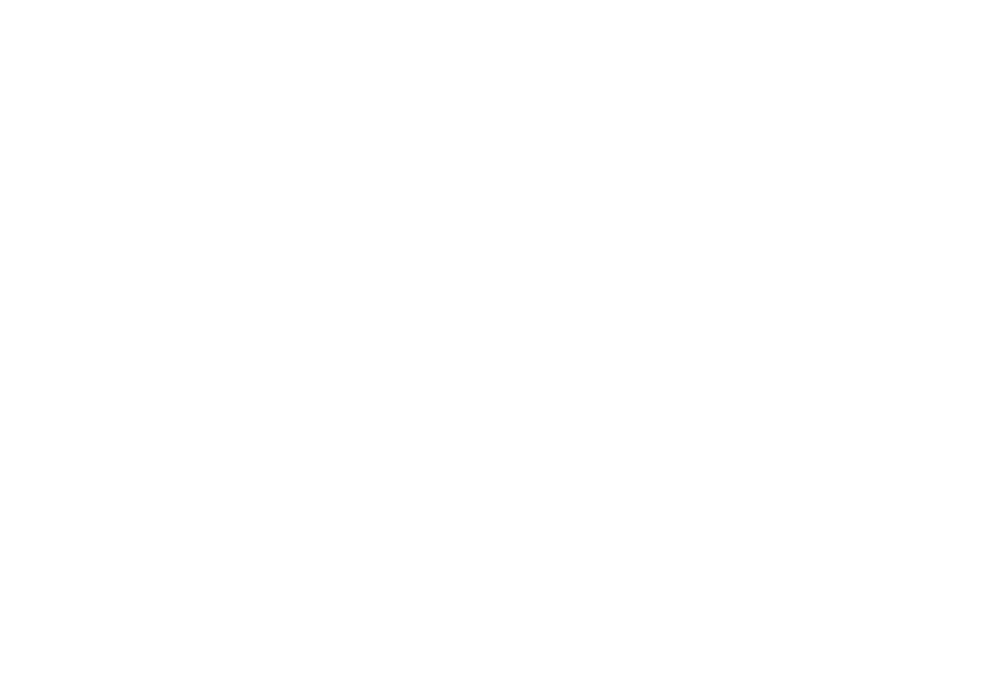

<IPython.core.display.Javascript object>


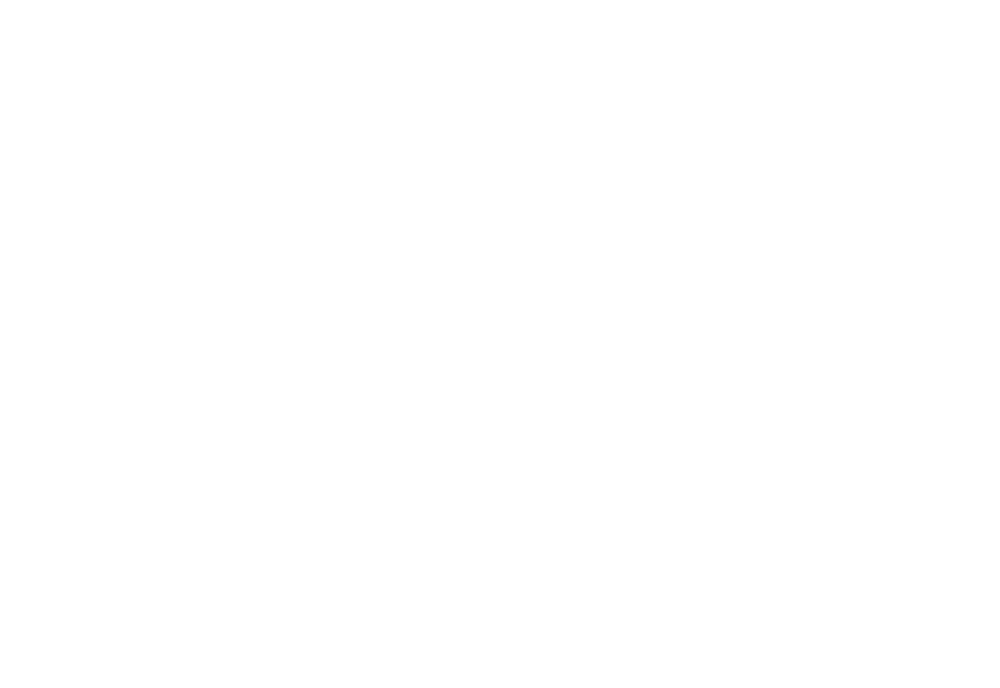

<IPython.core.display.Javascript object>


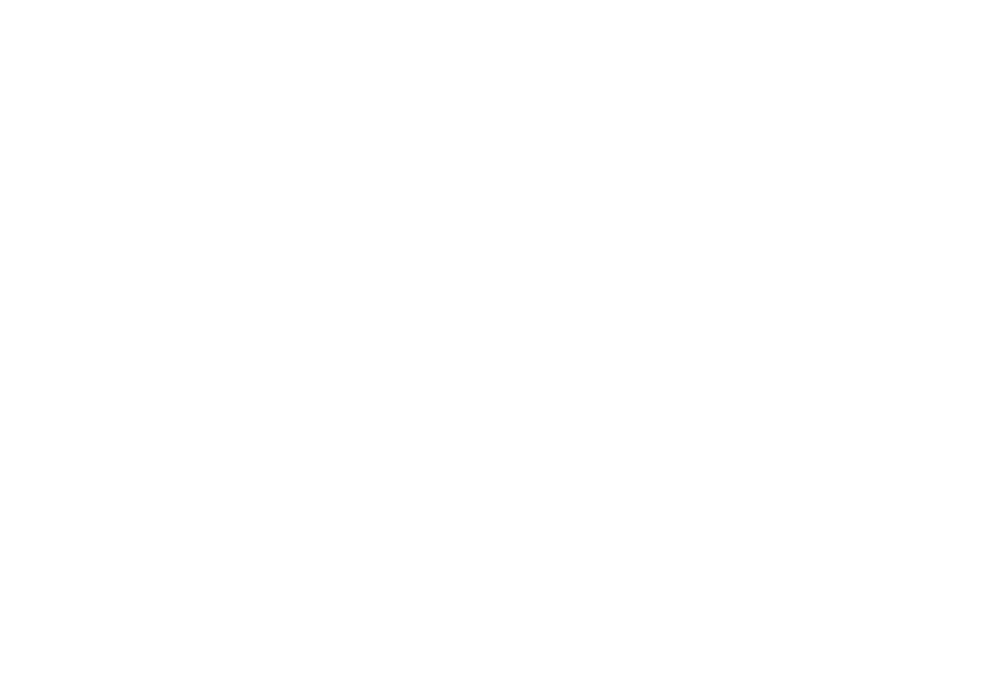

<IPython.core.display.Javascript object>


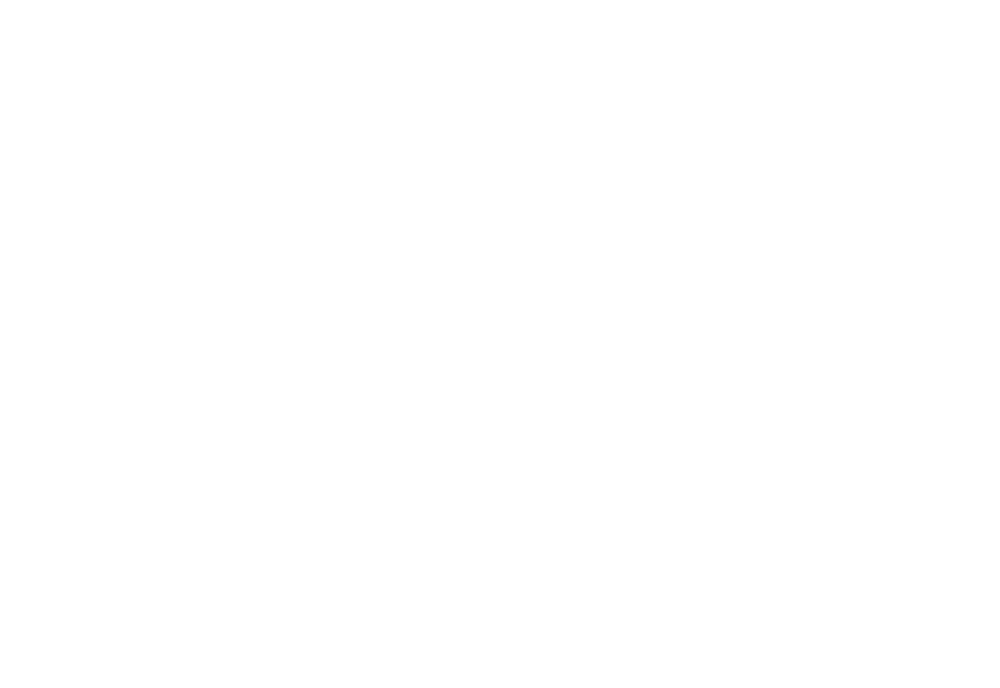

<IPython.core.display.Javascript object>


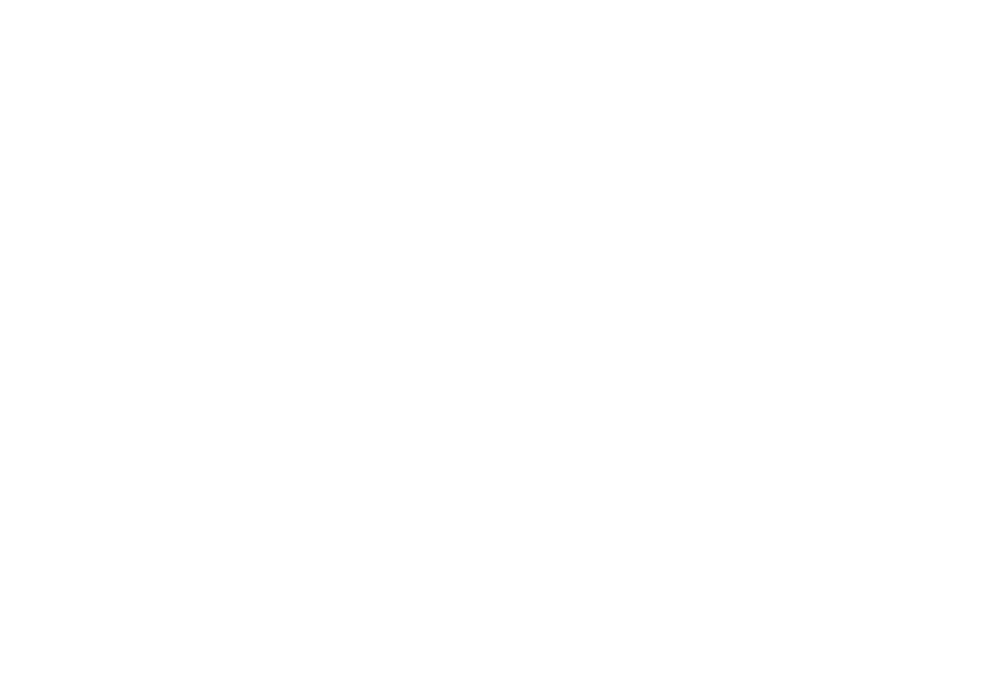

<IPython.core.display.Javascript object>


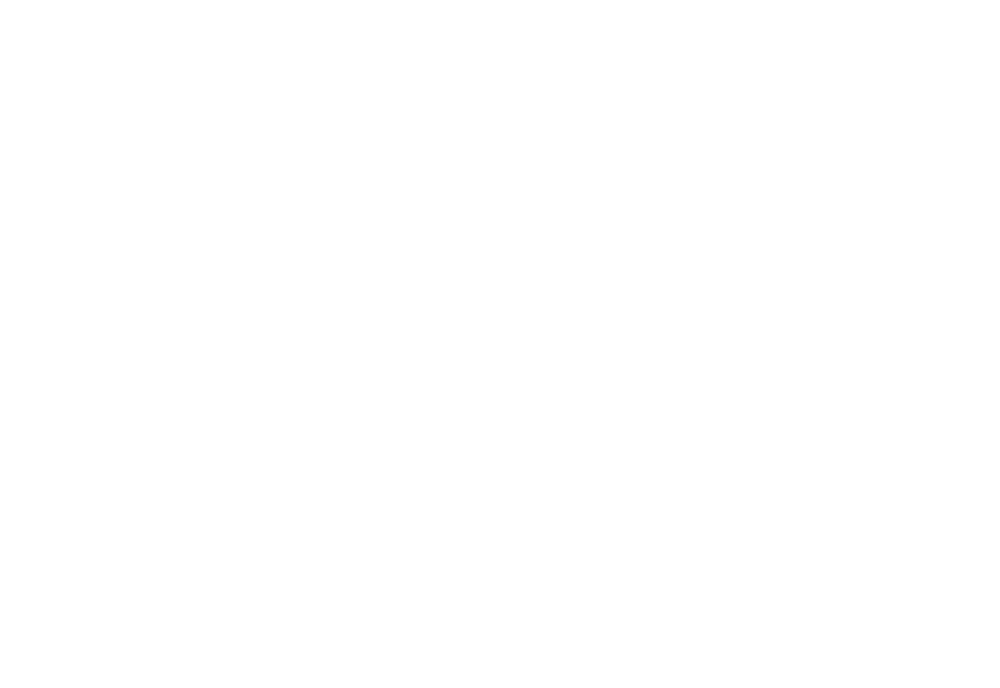

<IPython.core.display.Javascript object>


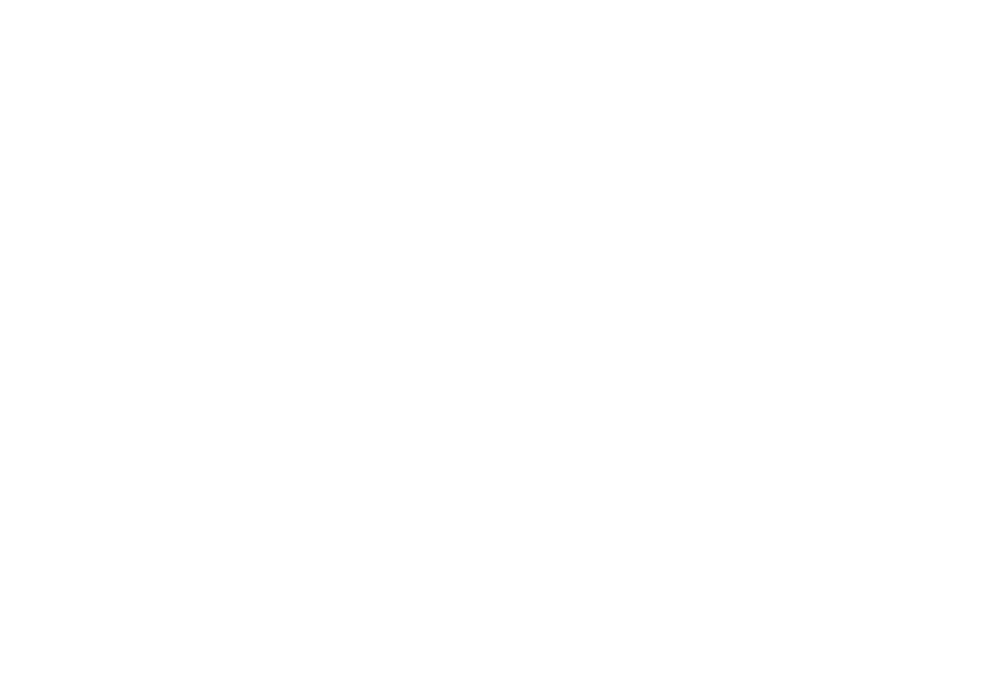

<IPython.core.display.Javascript object>


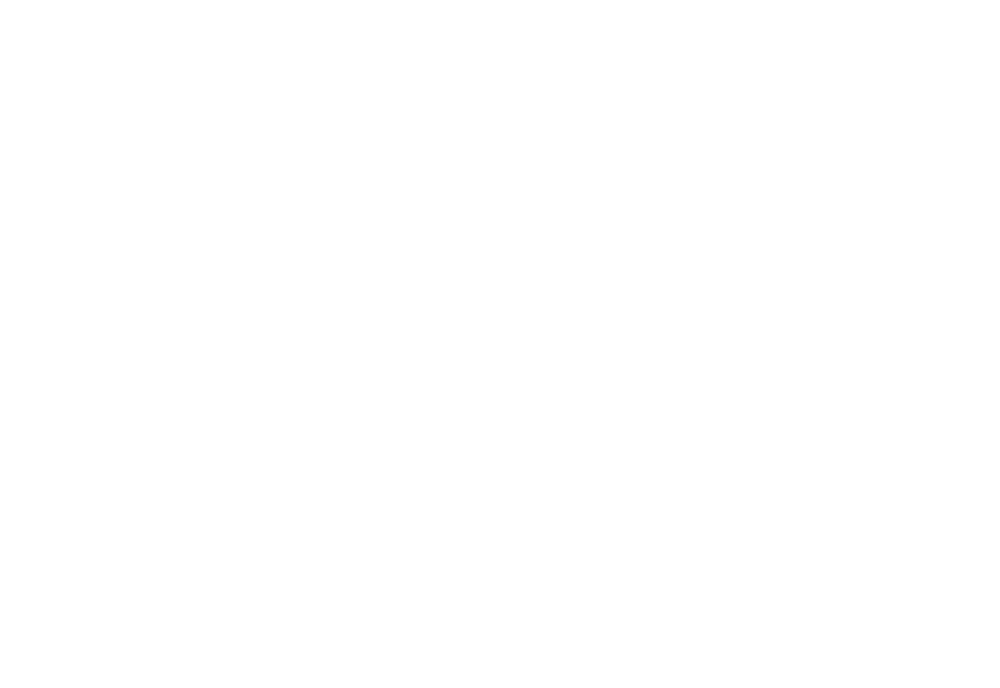

<IPython.core.display.Javascript object>


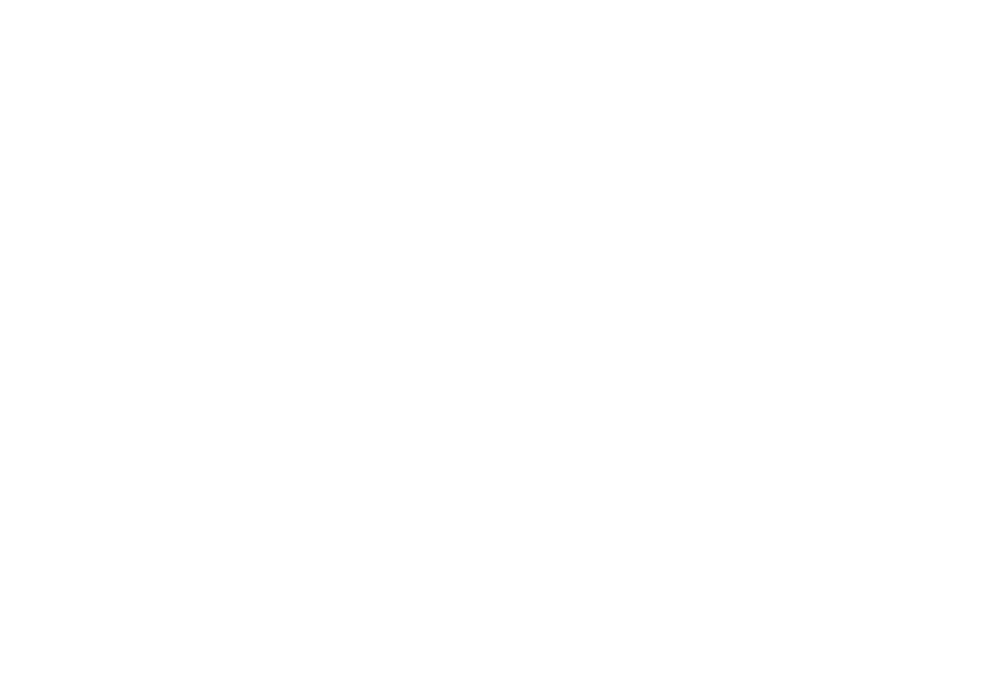

<IPython.core.display.Javascript object>


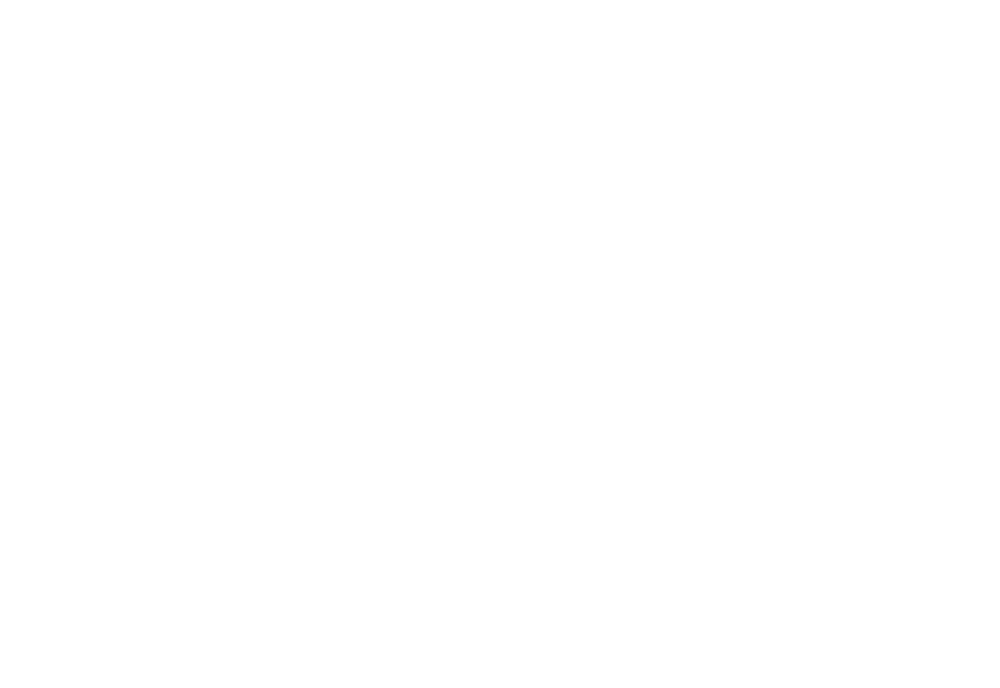

<IPython.core.display.Javascript object>


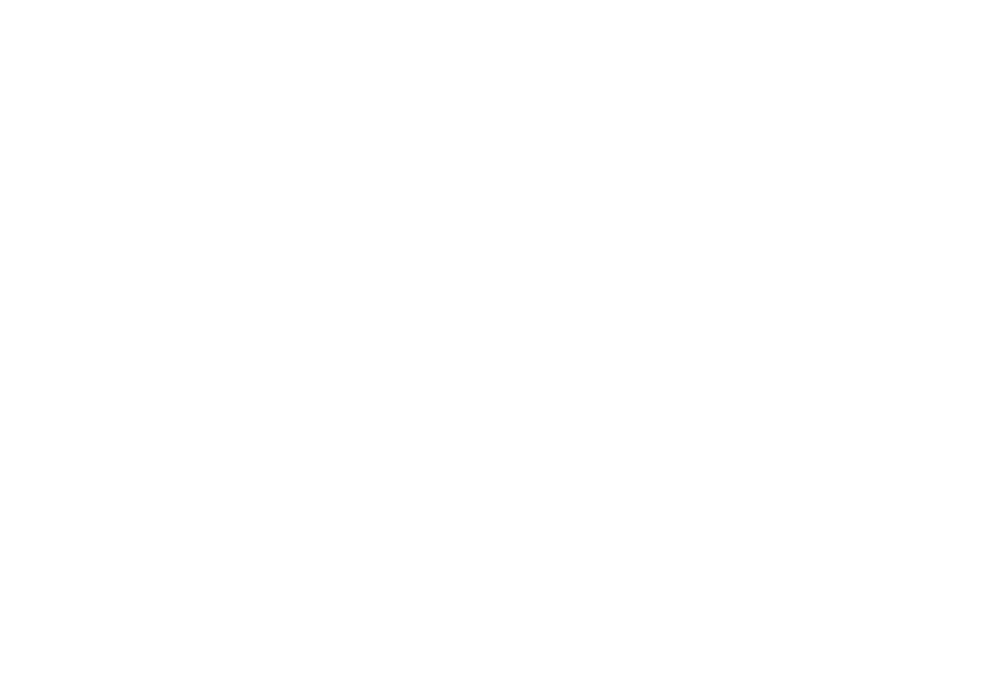

<IPython.core.display.Javascript object>


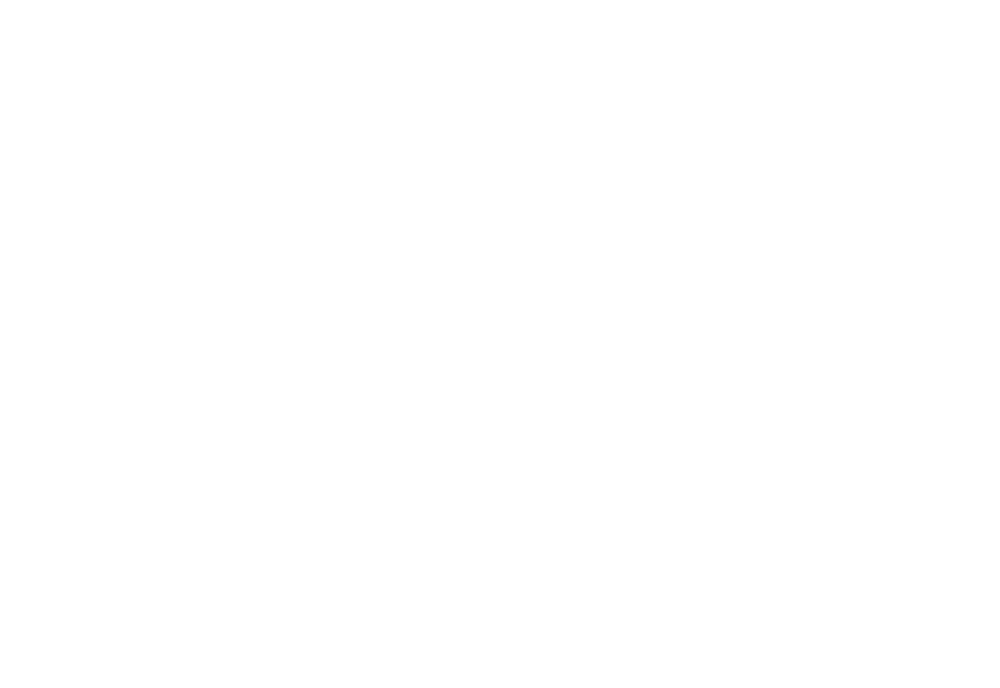

<IPython.core.display.Javascript object>


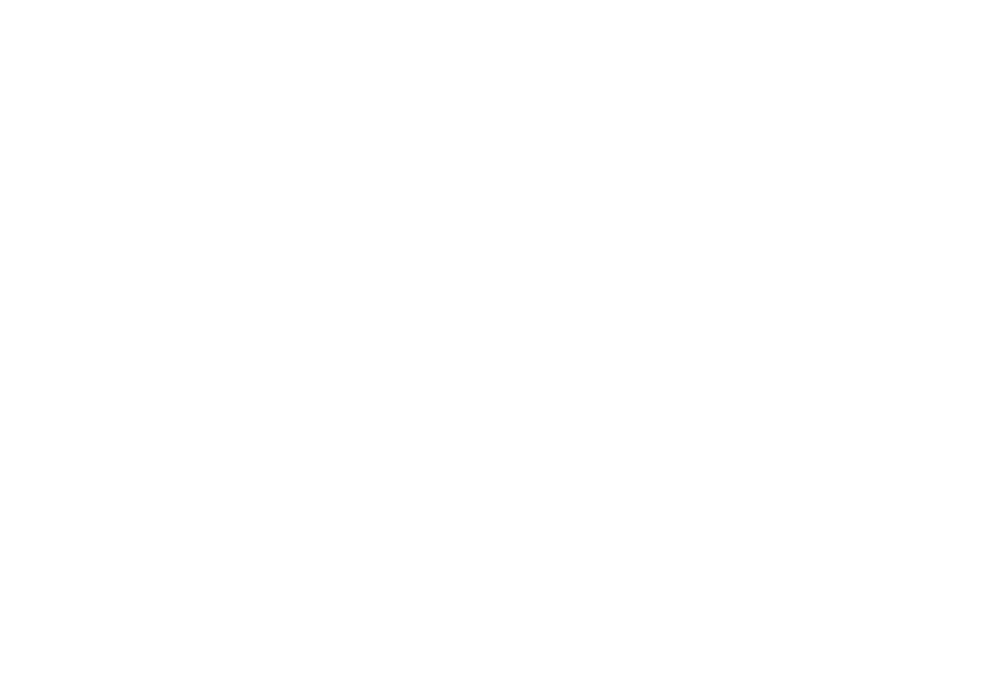

<IPython.core.display.Javascript object>


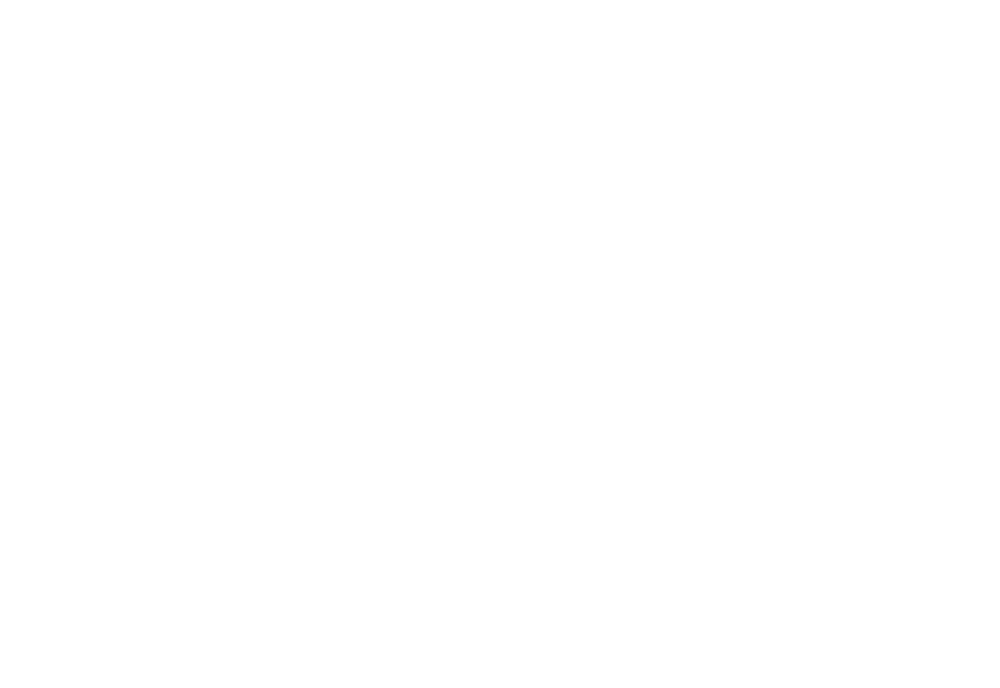

<IPython.core.display.Javascript object>


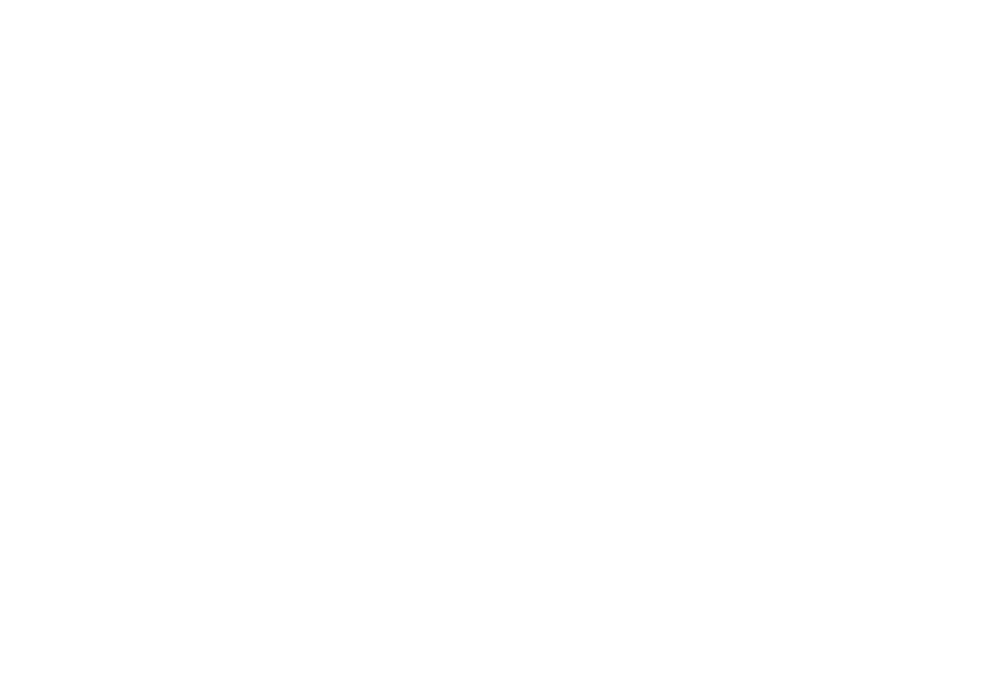

<IPython.core.display.Javascript object>


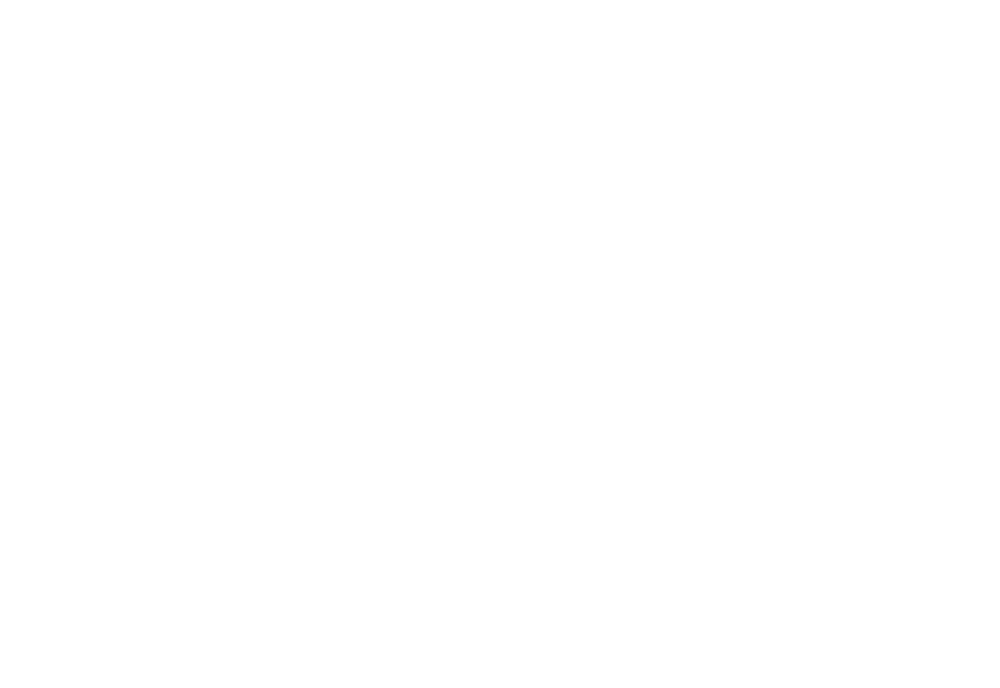

<IPython.core.display.Javascript object>


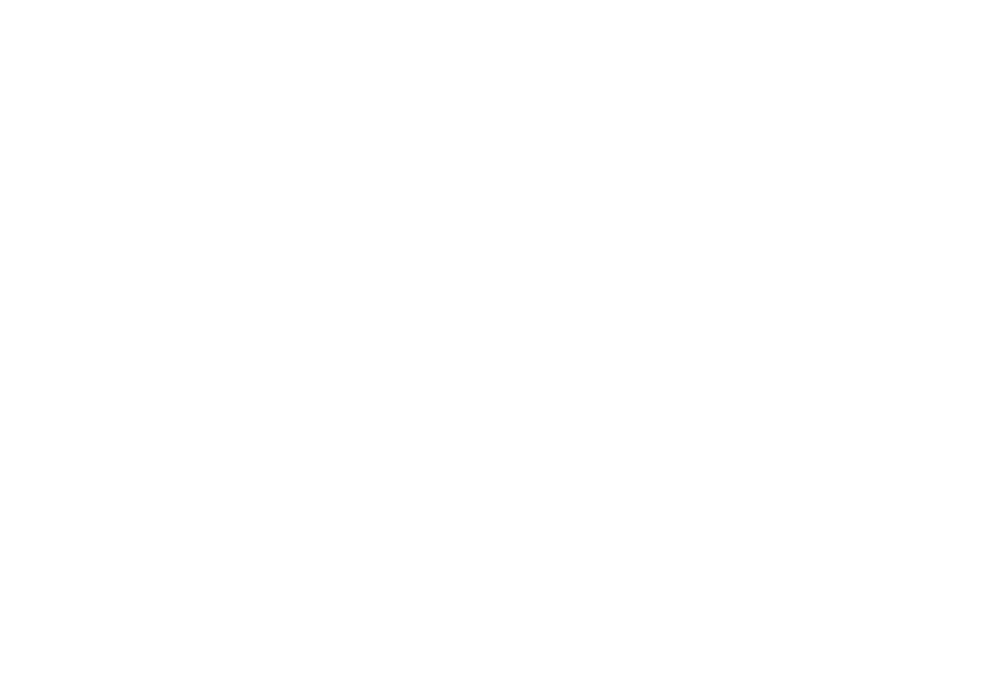

<IPython.core.display.Javascript object>


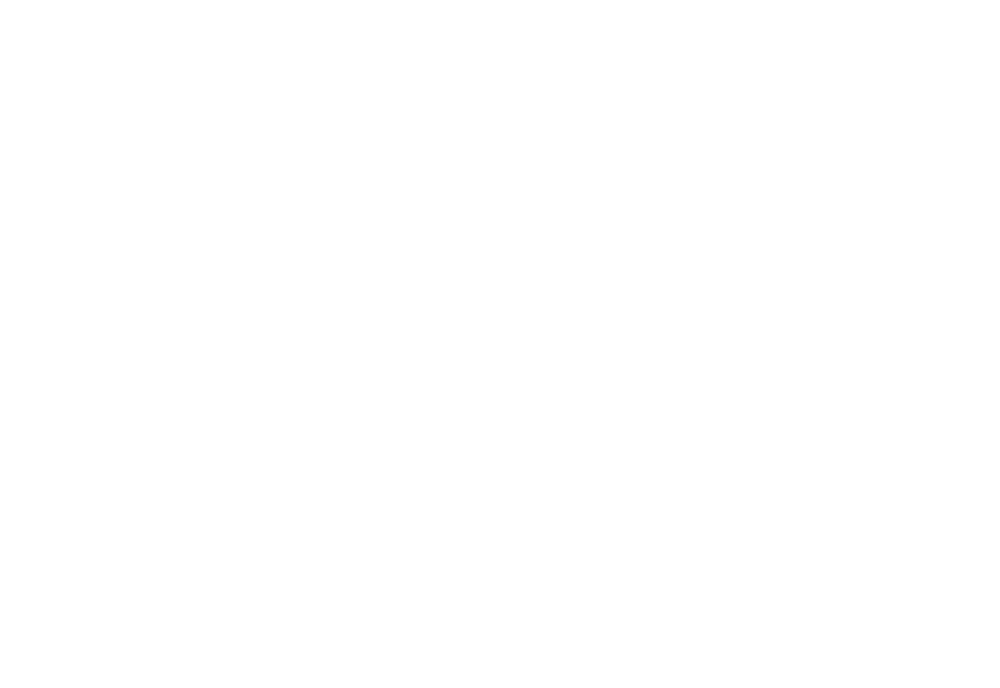

<IPython.core.display.Javascript object>


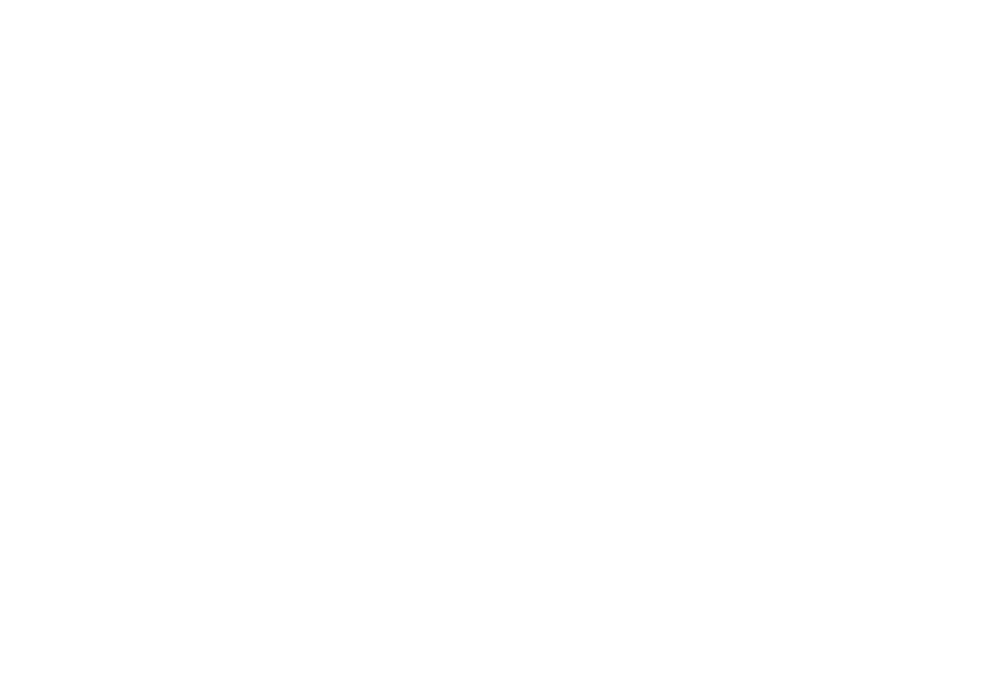

<IPython.core.display.Javascript object>


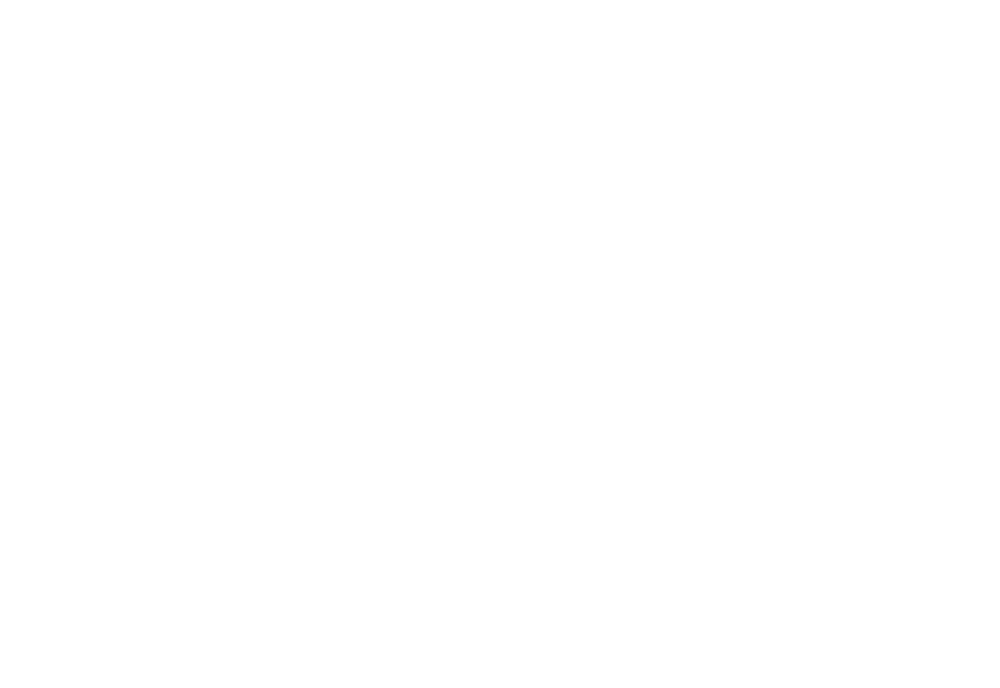

<IPython.core.display.Javascript object>


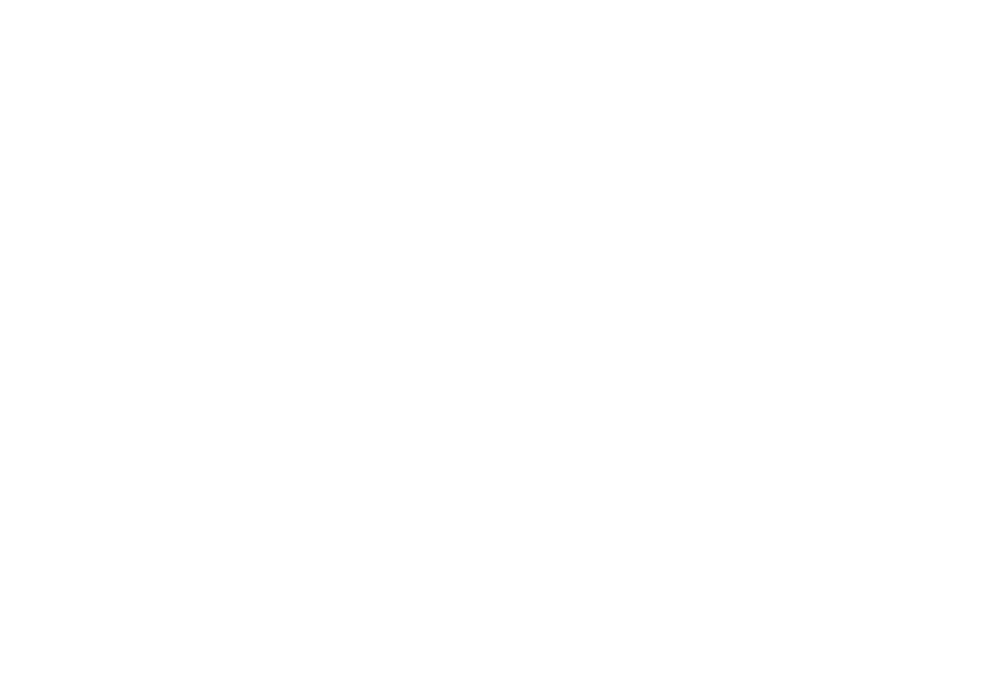

<IPython.core.display.Javascript object>


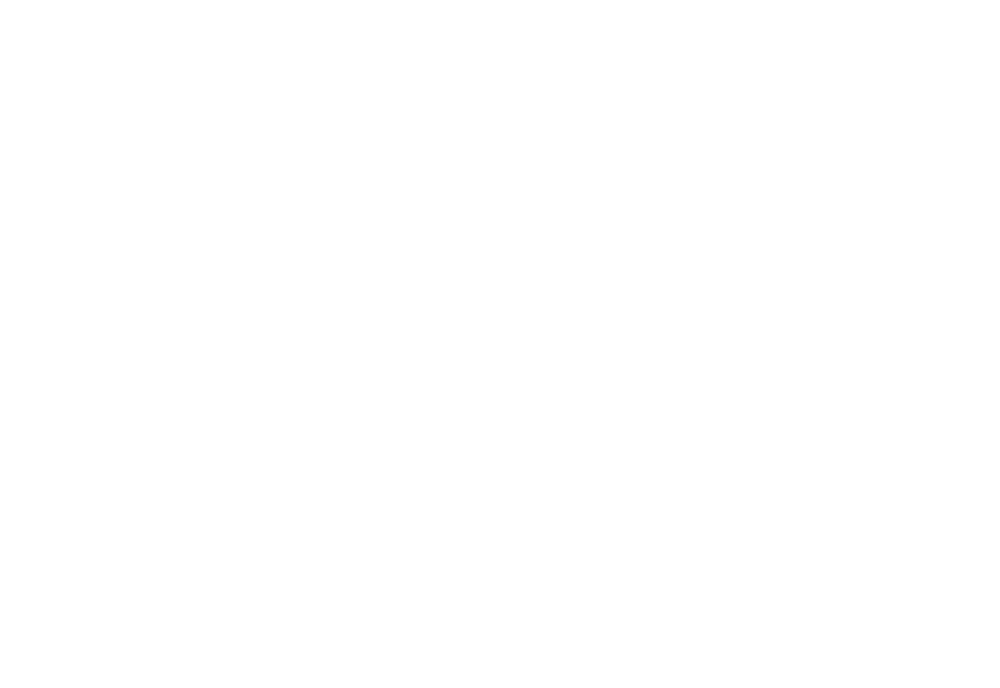

<IPython.core.display.Javascript object>


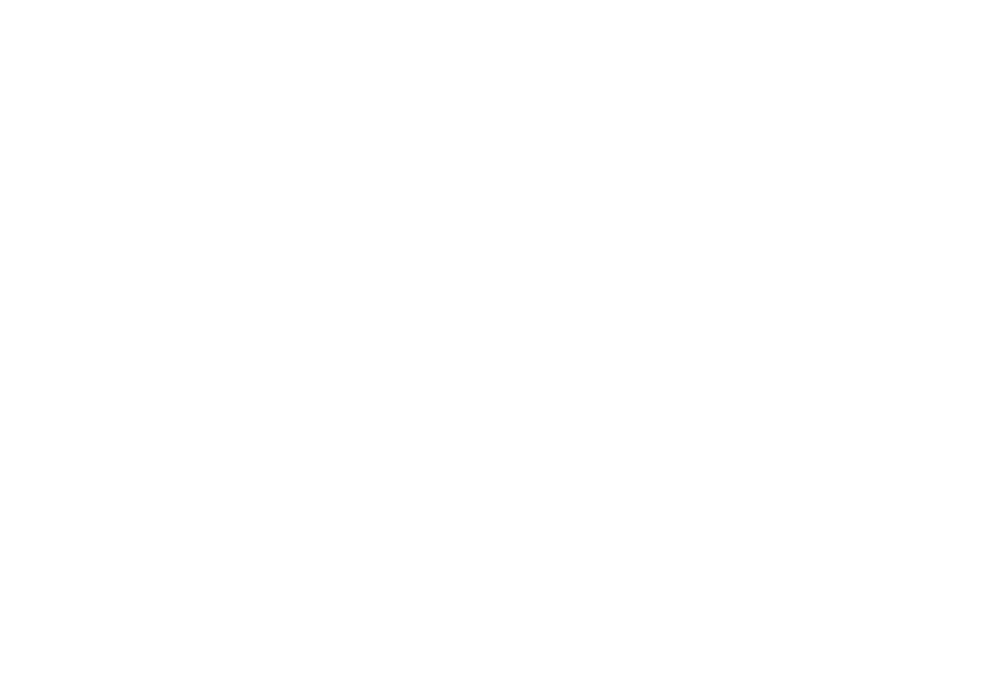

<IPython.core.display.Javascript object>


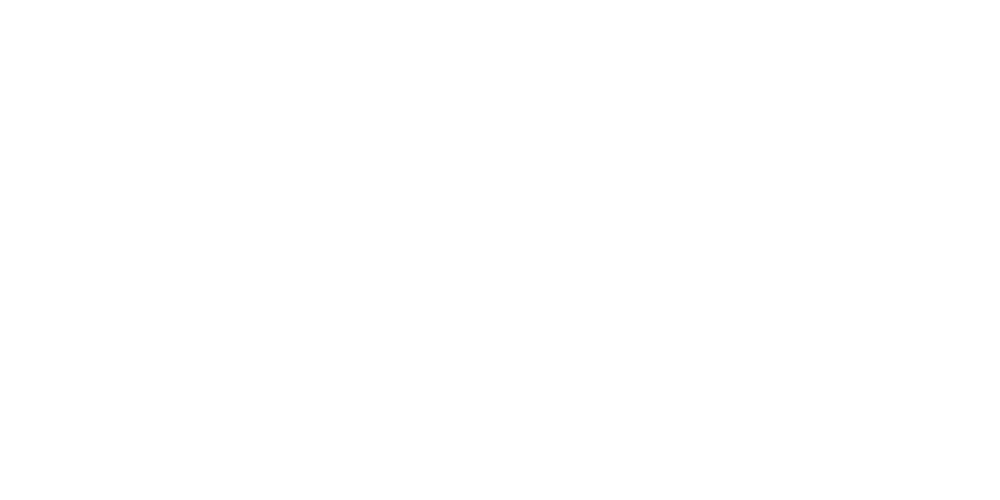

<IPython.core.display.Javascript object>


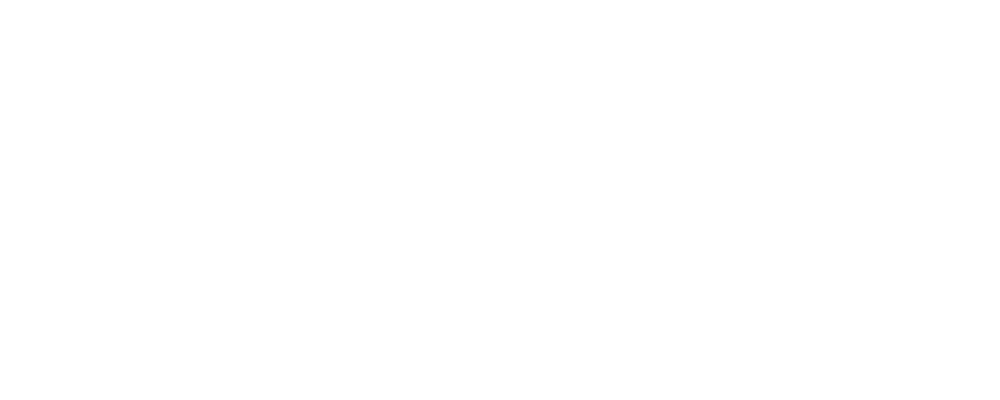

<IPython.core.display.Javascript object>


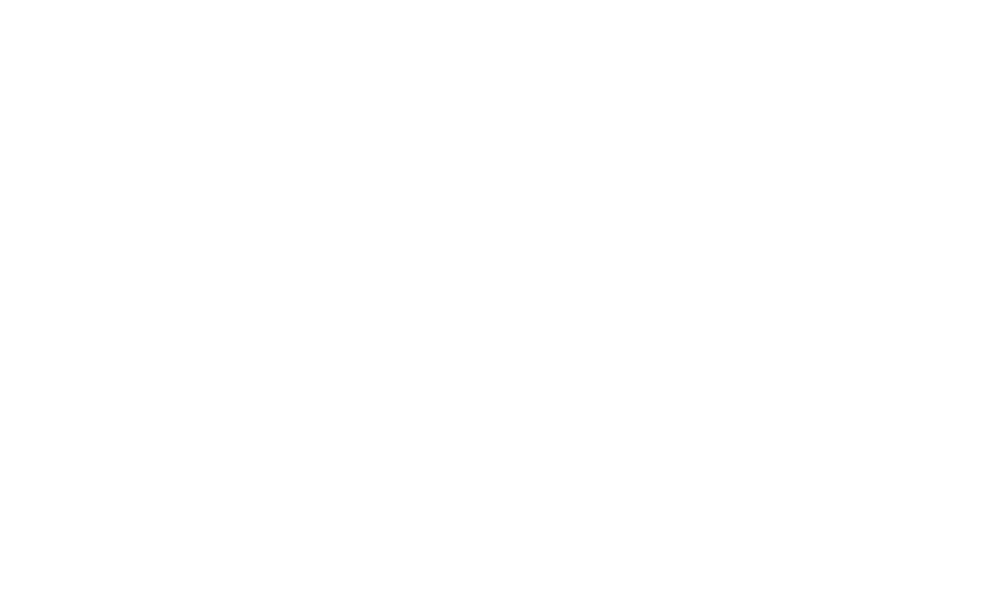

<IPython.core.display.Javascript object>


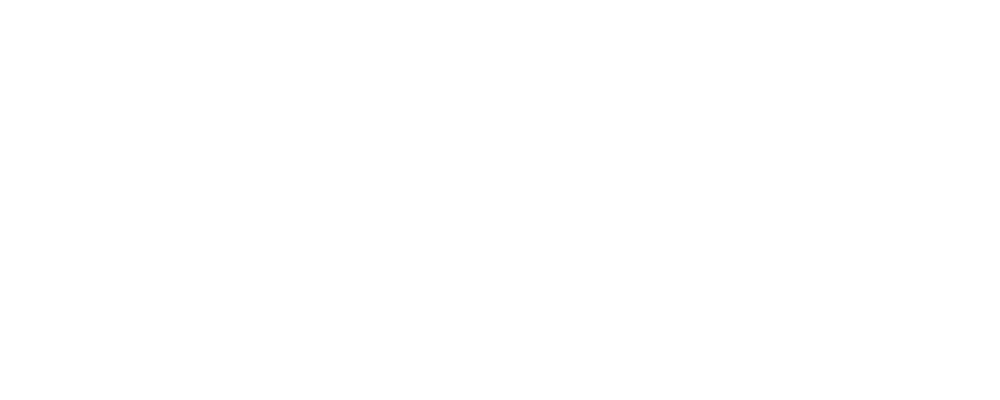

<IPython.core.display.Javascript object>


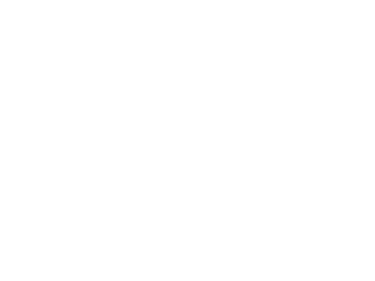

<IPython.core.display.Javascript object>


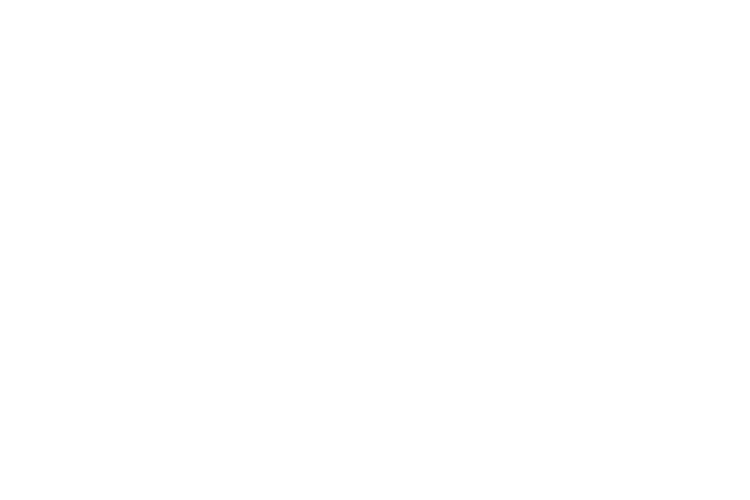

<IPython.core.display.Javascript object>


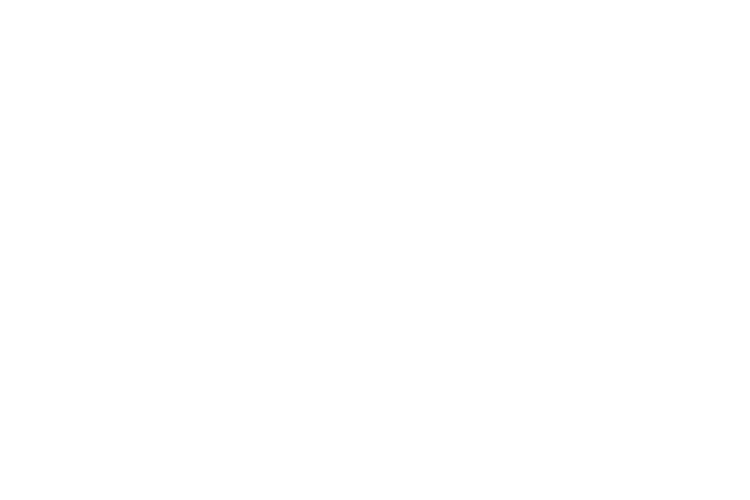

<IPython.core.display.Javascript object>


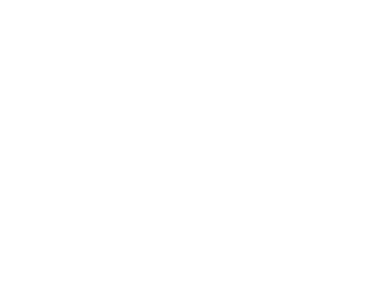

<IPython.core.display.Javascript object>


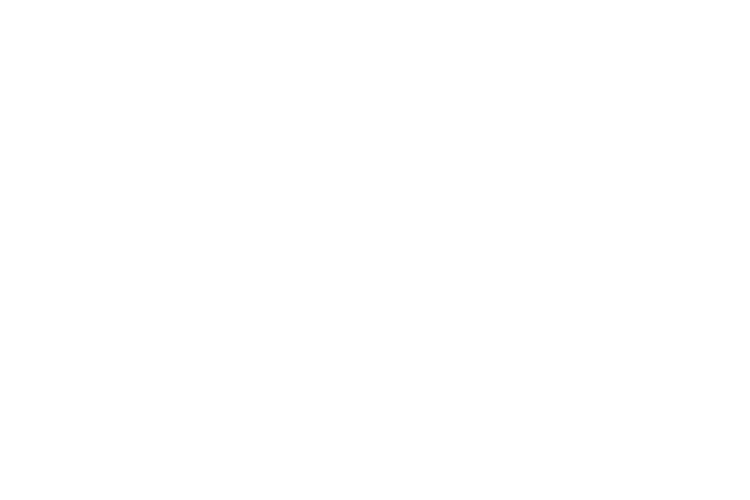

<IPython.core.display.Javascript object>


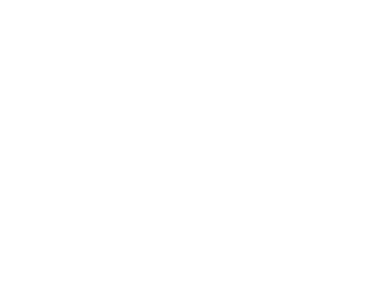

<IPython.core.display.Javascript object>


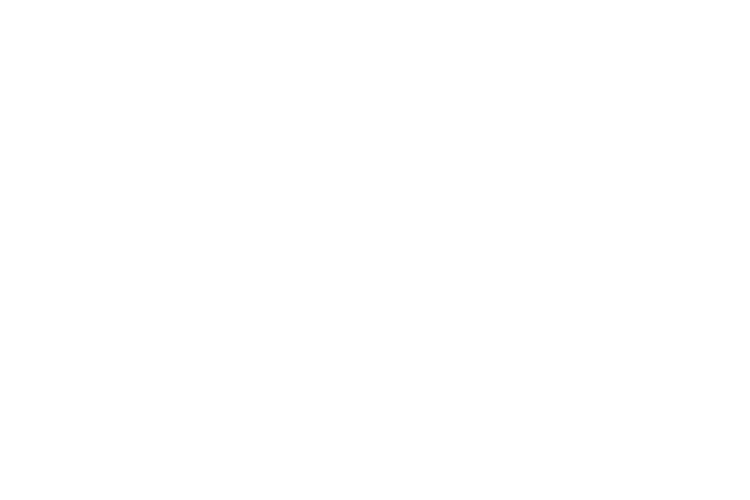

<IPython.core.display.Javascript object>


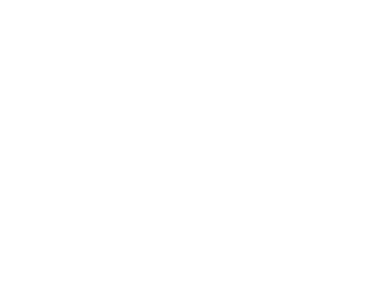

<IPython.core.display.Javascript object>


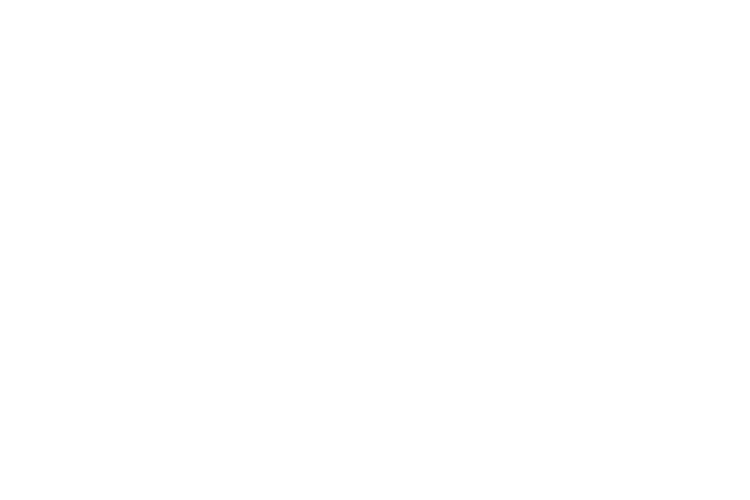

<IPython.core.display.Javascript object>


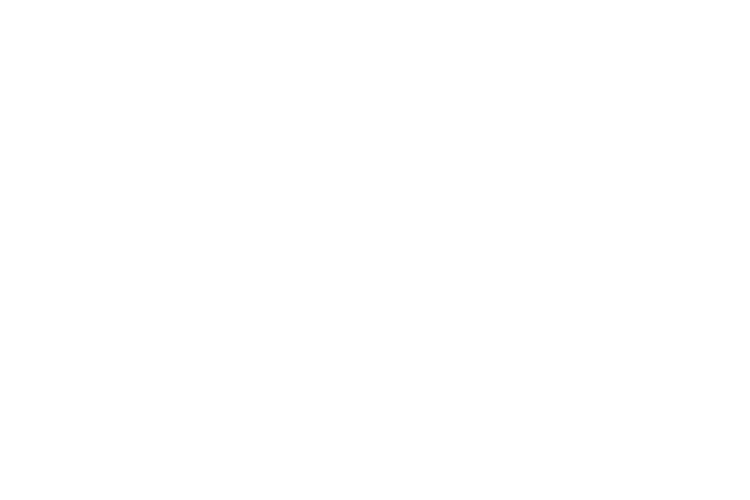

<IPython.core.display.Javascript object>


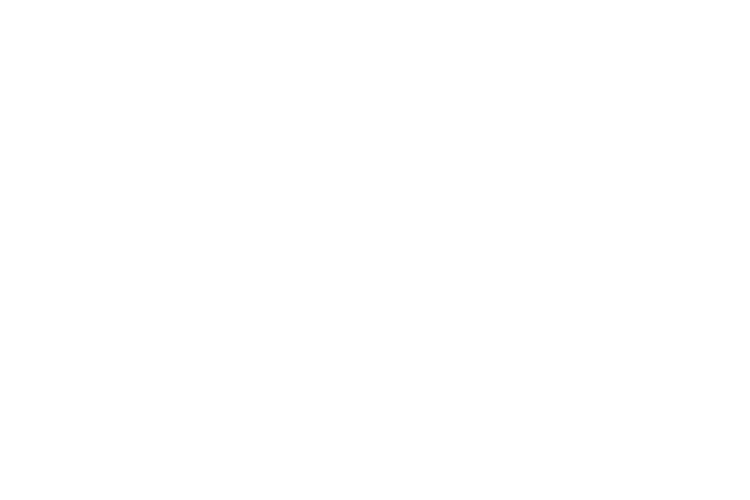

<IPython.core.display.Javascript object>


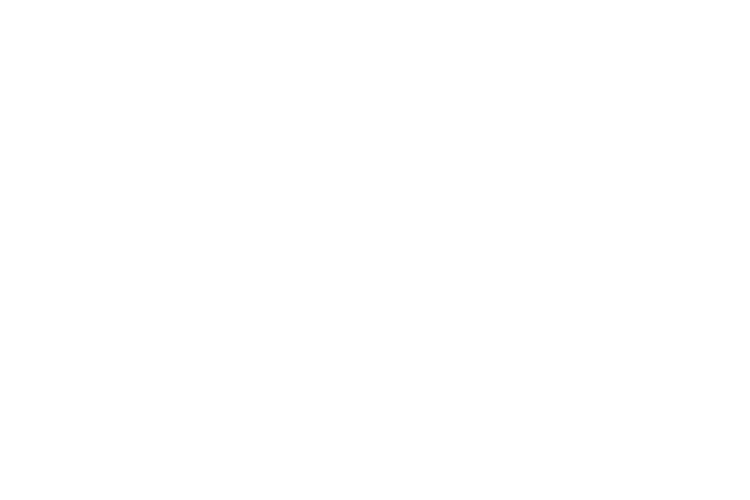

<IPython.core.display.Javascript object>


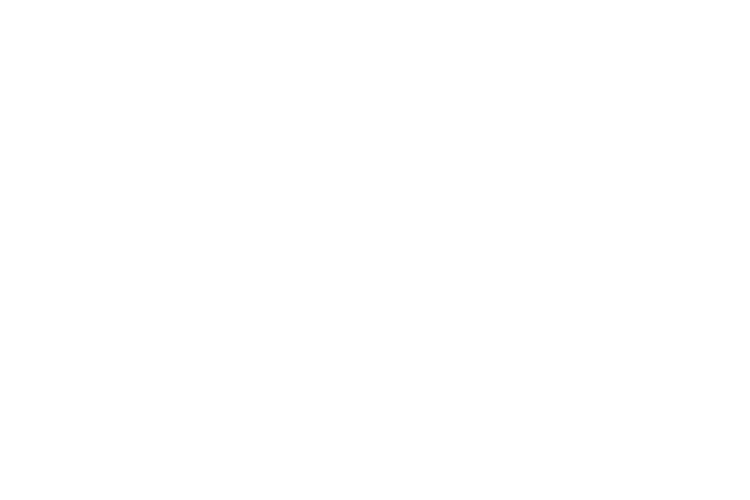

<IPython.core.display.Javascript object>


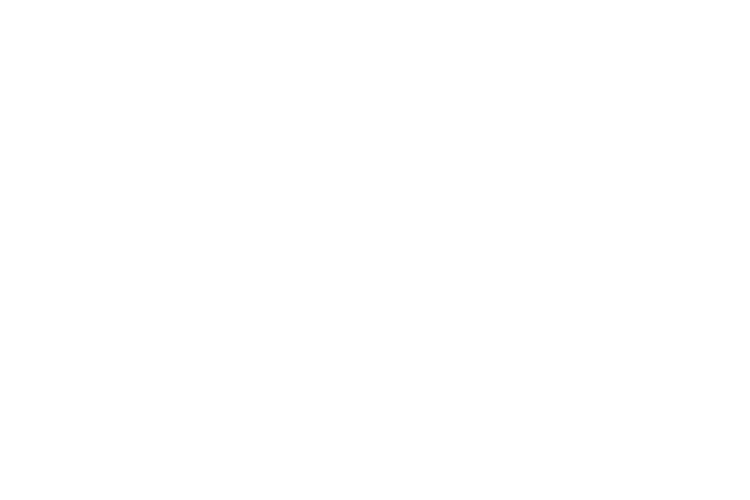

<IPython.core.display.Javascript object>


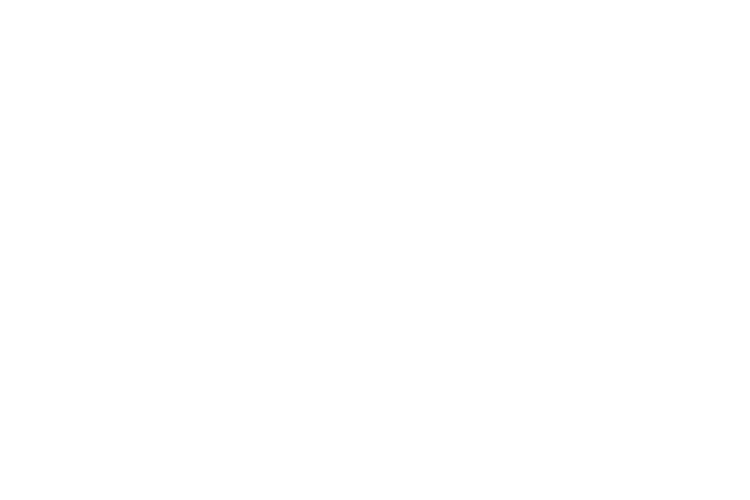

<IPython.core.display.Javascript object>


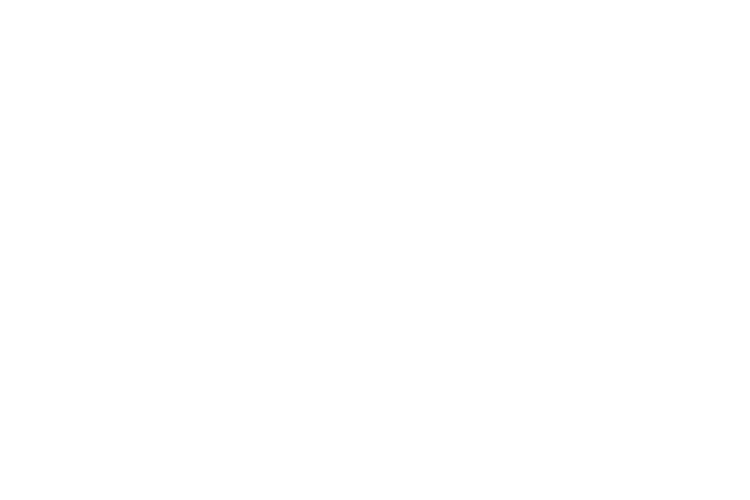

<IPython.core.display.Javascript object>


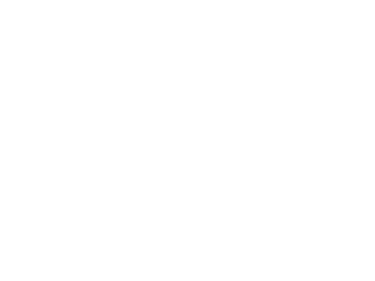

<IPython.core.display.Javascript object>


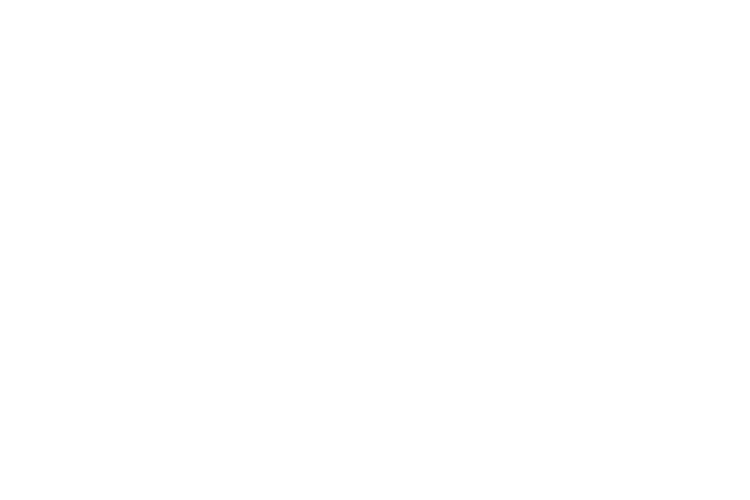

<IPython.core.display.Javascript object>


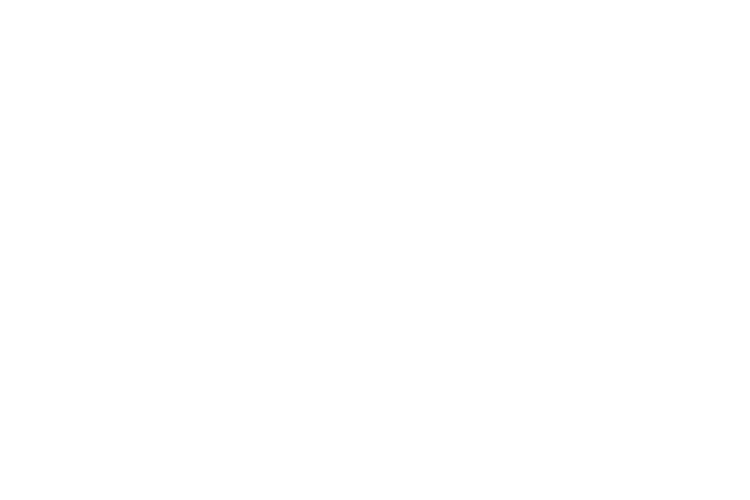

<IPython.core.display.Javascript object>


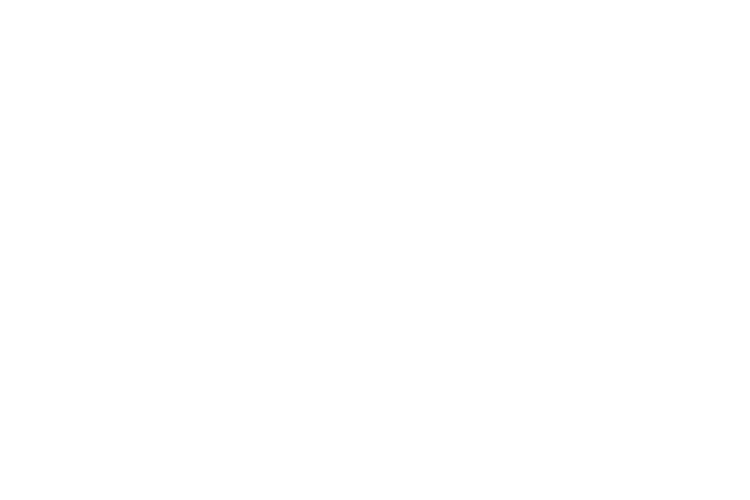

<IPython.core.display.Javascript object>


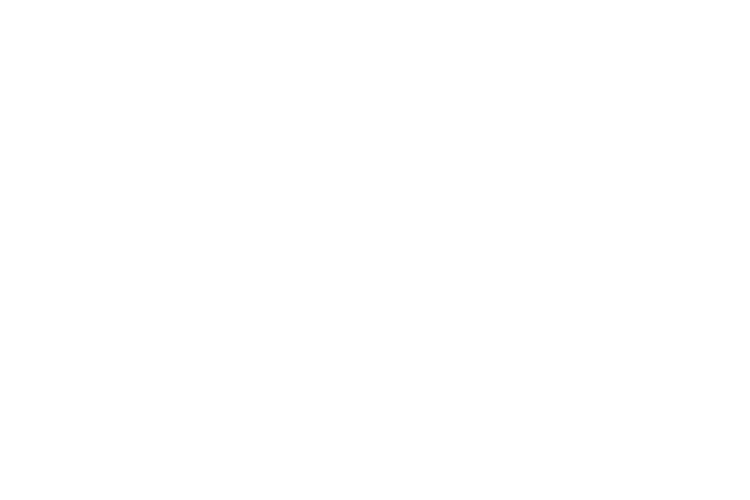

<IPython.core.display.Javascript object>


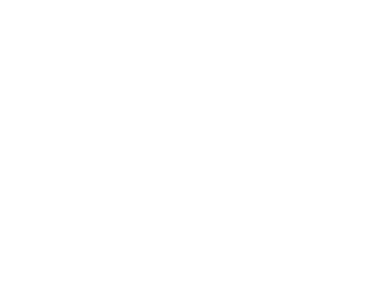

<IPython.core.display.Javascript object>


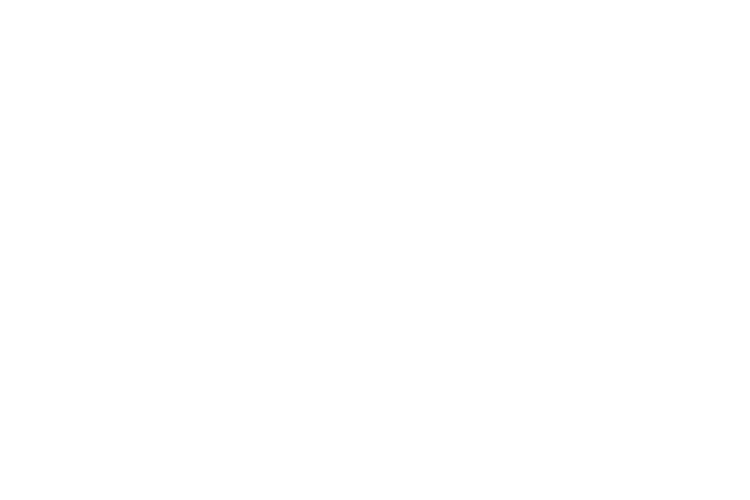

<IPython.core.display.Javascript object>


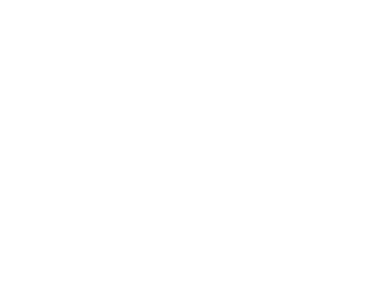

<IPython.core.display.Javascript object>


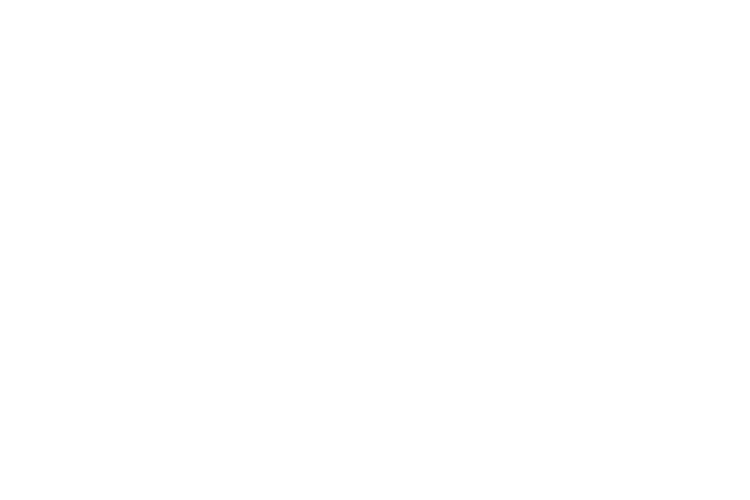

<IPython.core.display.Javascript object>


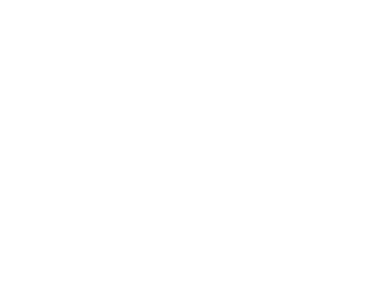

<IPython.core.display.Javascript object>


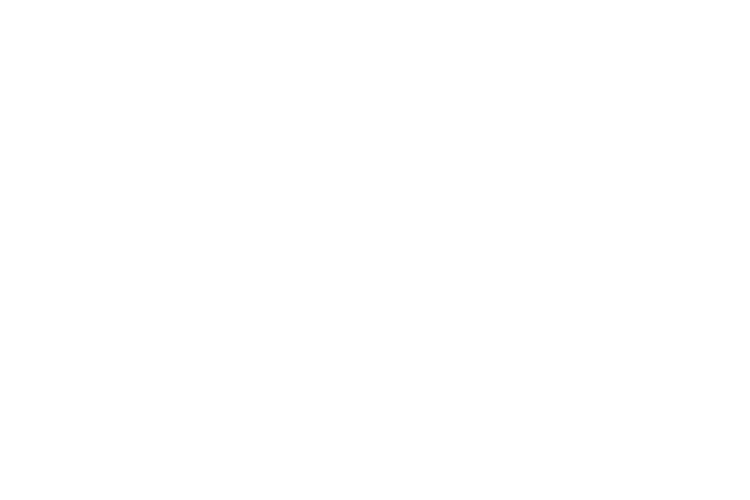

<IPython.core.display.Javascript object>


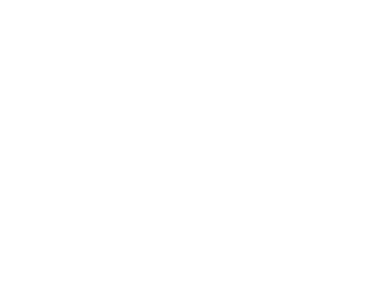

<IPython.core.display.Javascript object>


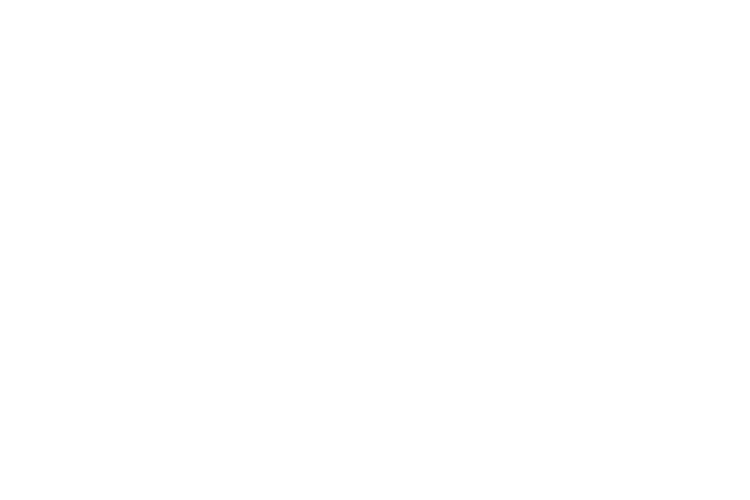

<IPython.core.display.Javascript object>


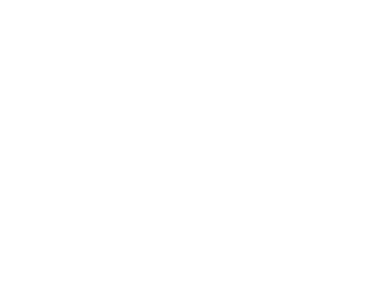

<IPython.core.display.Javascript object>


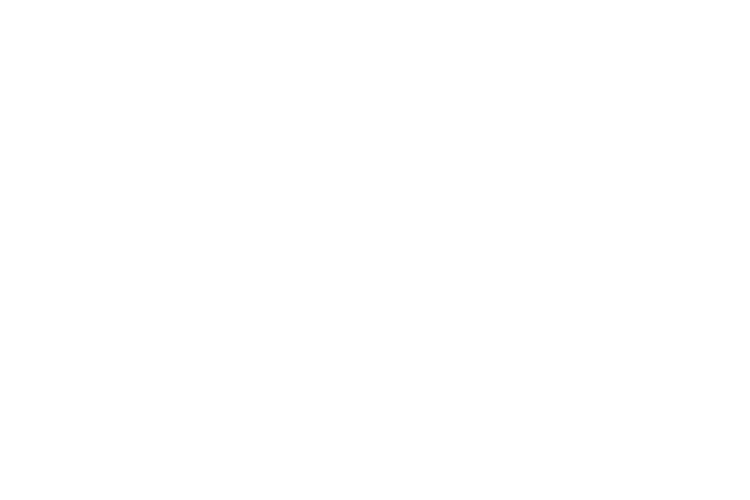

<IPython.core.display.Javascript object>


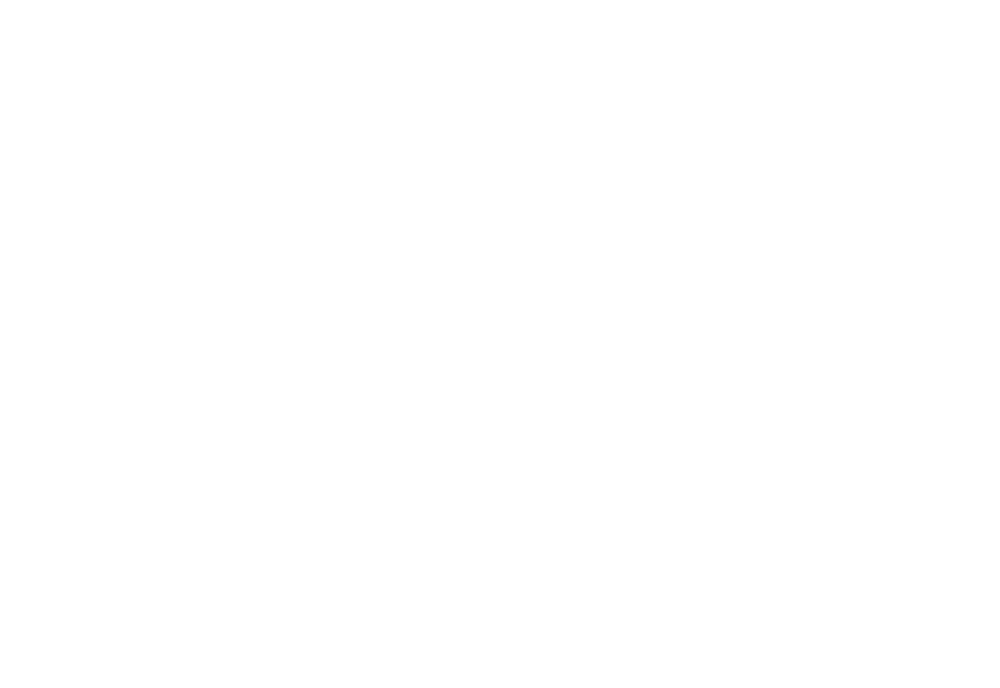

<IPython.core.display.Javascript object>


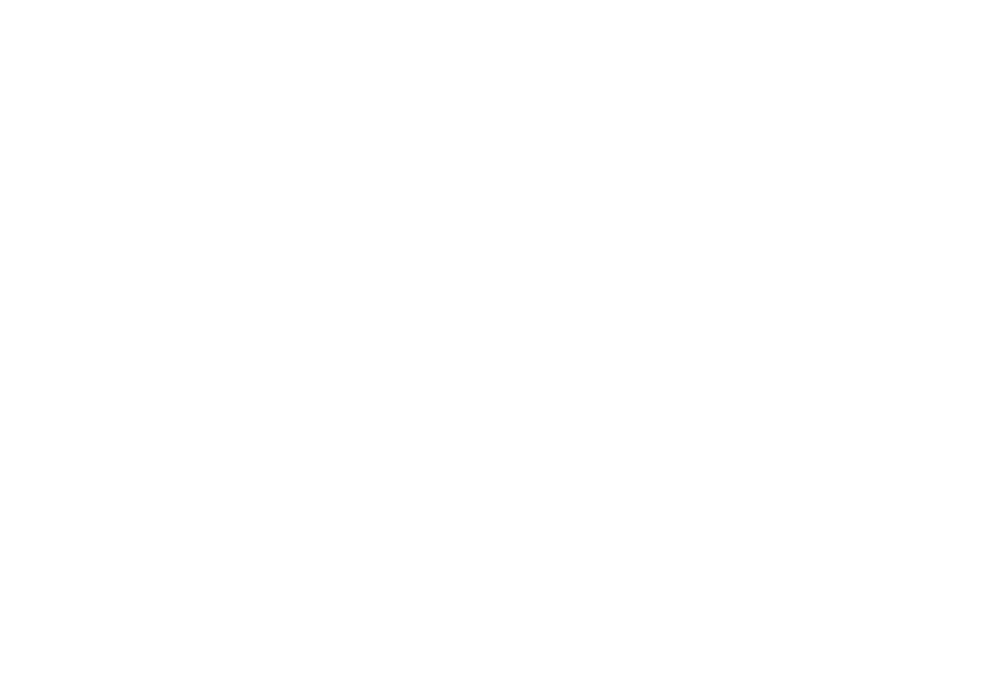

<IPython.core.display.Javascript object>


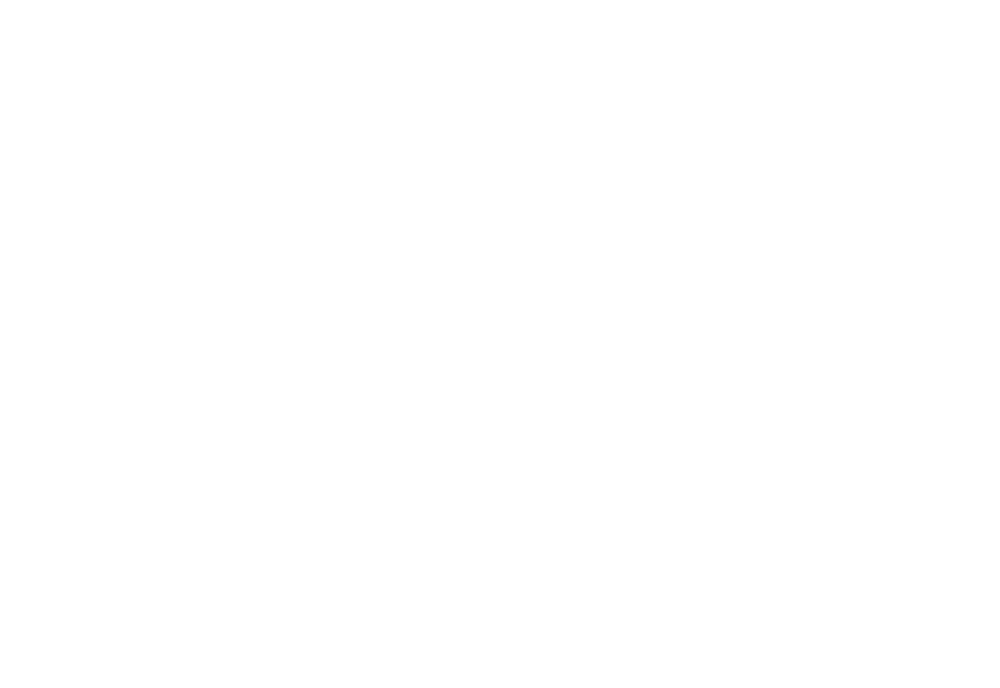

<IPython.core.display.Javascript object>


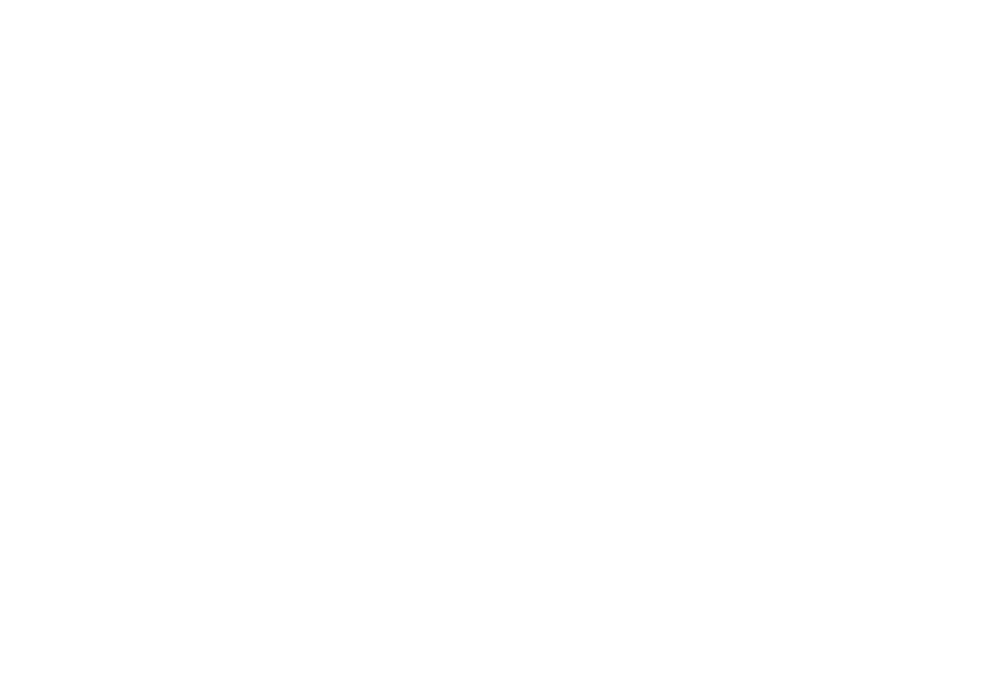

In [204]:
#getting a quick overview unsanitized dataset
!pip install pandas_profiling
import pandas_profiling                                                              
profile = pandas_profiling.ProfileReport(data)
profile.to_file("Movies_before_preprocessing.html")     

In [10]:
data_null = data.isna().sum()
data_null

id                         0
imdb_id                   10
popularity                 0
budget                     0
revenue                    0
original_title             0
cast                      76
homepage                7930
director                  44
tagline                 2824
keywords                1493
overview                   4
runtime                    0
genres                    23
production_companies    1030
release_date               0
vote_count                 0
vote_average               0
release_year               0
budget_adj                 0
revenue_adj                0
dtype: int64

In [11]:
!pip install missingno


In [12]:
import missingno as mno
mno.matrix(data)

<IPython.core.display.Javascript object>

<AxesSubplot:>

In [241]:
data.drop(['id', 'imdb_id', 'homepage', 'tagline','overview','cast',"production_companies",
         'keywords'], axis = 1, inplace = True)

In [242]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   popularity      10866 non-null  float64
 1   budget          10866 non-null  int64  
 2   revenue         10866 non-null  int64  
 3   original_title  10866 non-null  object 
 4   director        10822 non-null  object 
 5   runtime         10866 non-null  int64  
 6   genres          10843 non-null  object 
 7   release_date    10866 non-null  object 
 8   vote_count      10866 non-null  int64  
 9   vote_average    10866 non-null  float64
 10  release_year    10866 non-null  int64  
 11  budget_adj      10866 non-null  float64
 12  revenue_adj     10866 non-null  float64
dtypes: float64(4), int64(5), object(4)
memory usage: 1.1+ MB


In [243]:
col = list(data)
col.insert(0, col.pop(col.index('original_title')))

In [244]:
col

['original_title',
 'popularity',
 'budget',
 'revenue',
 'director',
 'runtime',
 'genres',
 'release_date',
 'vote_count',
 'vote_average',
 'release_year',
 'budget_adj',
 'revenue_adj']

In [245]:
data = data.loc[:, col]

In [246]:
data.head()

,original_title,popularity,budget,revenue,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,Jurassic World,32.985763,150000000,1513528810,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,28.419936,150000000,378436354,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,Insurgent,13.112507,110000000,295238201,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,11.173104,200000000,2068178225,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,Furious 7,9.335014,190000000,1506249360,James Wan,137,Action|Crime|Thriller,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09


In [219]:
data

,original_title,popularity,budget,revenue,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,Jurassic World,32.985763,150000000,1513528810,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,28.419936,150000000,378436354,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,Insurgent,13.112507,110000000,295238201,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,11.173104,200000000,2068178225,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,Furious 7,9.335014,190000000,1506249360,James Wan,137,Action|Crime|Thriller,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10861,The Endless Summer,0.080598,0,0,Bruce Brown,95,Documentary,6/15/66,11,7.4,1966,0.000000e+00,0.000000e+00
10862,Grand Prix,0.065543,0,0,John Frankenheimer,176,Action|Adventure|Drama,12/21/66,20,5.7,1966,0.000000e+00,0.000000e+00
10863,Beregis Avtomobilya,0.065141,0,0,Eldar Ryazanov,94,Mystery|Comedy,1/1/66,11,6.5,1966,0.000000e+00,0.000000e+00
10864,"What's Up, Tiger Lily?",0.064317,0,0,Woody Allen,80,Action|Comedy,11/2/66,22,5.4,1966,0.000000e+00,0.000000e+00


In [247]:
data.rename(columns = {'original_title': 'Title', } )

,Title,popularity,budget,revenue,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,Jurassic World,32.985763,150000000,1513528810,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,28.419936,150000000,378436354,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,Insurgent,13.112507,110000000,295238201,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,11.173104,200000000,2068178225,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,Furious 7,9.335014,190000000,1506249360,James Wan,137,Action|Crime|Thriller,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10861,The Endless Summer,0.080598,0,0,Bruce Brown,95,Documentary,6/15/66,11,7.4,1966,0.000000e+00,0.000000e+00
10862,Grand Prix,0.065543,0,0,John Frankenheimer,176,Action|Adventure|Drama,12/21/66,20,5.7,1966,0.000000e+00,0.000000e+00
10863,Beregis Avtomobilya,0.065141,0,0,Eldar Ryazanov,94,Mystery|Comedy,1/1/66,11,6.5,1966,0.000000e+00,0.000000e+00
10864,"What's Up, Tiger Lily?",0.064317,0,0,Woody Allen,80,Action|Comedy,11/2/66,22,5.4,1966,0.000000e+00,0.000000e+00


In [24]:
if sum(data.duplicated()):
    data.drop_duplicates(inplace=True)
sum(data.duplicated())

0

<IPython.core.display.Javascript object>


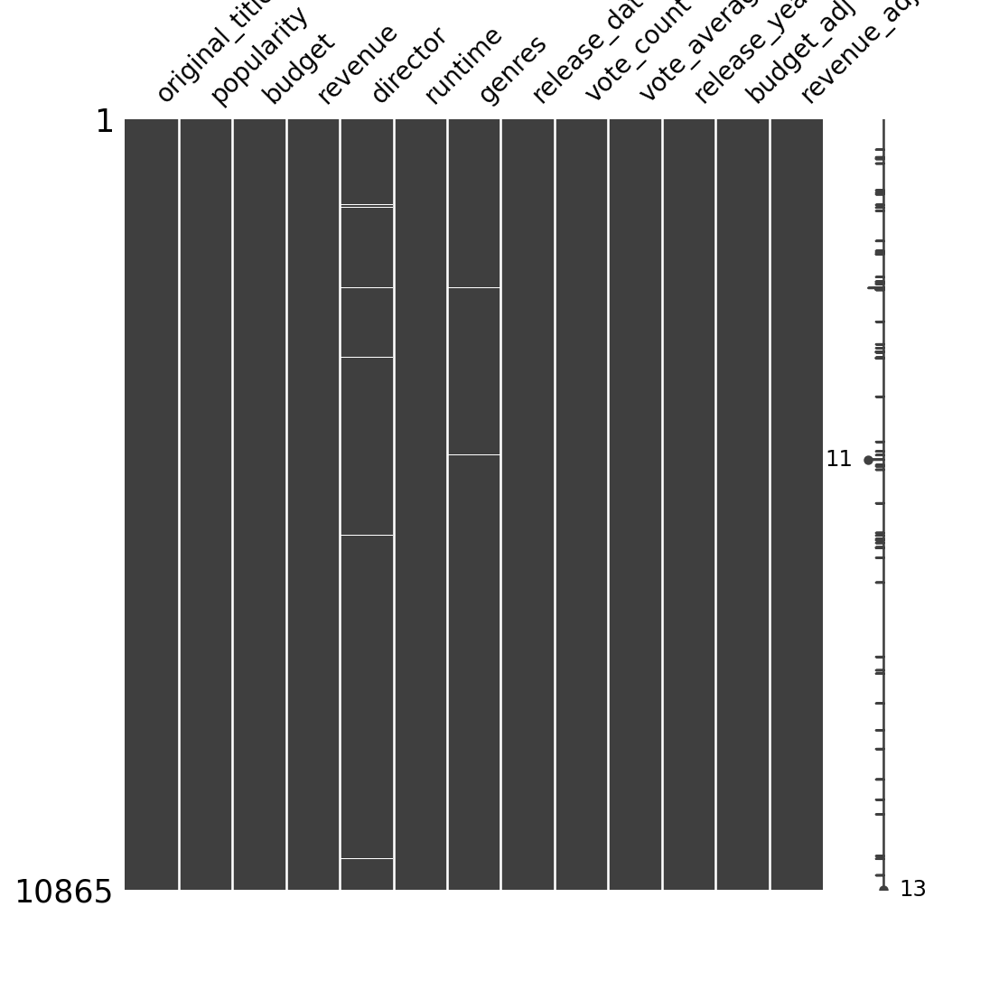

<AxesSubplot:>

In [25]:
mno.matrix(data)

In [27]:
budget_col = data['budget']
budget_col.replace(to_replace = 0, value = budget_col.mean(), inplace = True)

In [28]:
revenue_col = data['revenue']
revenue_col.replace(to_replace = 0, value = revenue_col.mean(), inplace = True)

In [29]:
budget_adj_col = data['budget_adj']
budget_adj_col.replace(to_replace = 0, value = budget_adj_col.mean(), inplace = True)

In [30]:
revenue_adj_col = data['revenue_adj']
revenue_adj_col.replace(to_replace = 0, value = revenue_adj_col.mean(), inplace = True)

In [234]:
data.head()

,original_title,popularity,budget,revenue,director,runtime,genres,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,Jurassic World,32.985763,150000000,1513528810,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,28.419936,150000000,378436354,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,Insurgent,13.112507,110000000,295238201,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,11.173104,200000000,2068178225,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,Furious 7,9.335014,190000000,1506249360,James Wan,137,Action|Crime|Thriller,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09


In [32]:
data.genres.fillna("other", inplace = True)
data.director.fillna("other", inplace = True)

In [33]:
data.isna().sum()

original_title    0
popularity        0
budget            0
revenue           0
director          0
runtime           0
genres            0
release_date      0
vote_count        0
vote_average      0
release_year      0
budget_adj        0
revenue_adj       0
dtype: int64

In [43]:
genreDict = {}
def genreCol(name):
    for i in str(name).split('|'):
        genreDict[i] = genreDict.get(i, 0) + 1 

In [44]:
data['genres'].apply(lambda x: genreCol(x))
genreDict

{'Action': 2384,
 'Adventure': 1471,
 'Science Fiction': 1229,
 'Thriller': 2907,
 'Fantasy': 916,
 'Crime': 1354,
 'Western': 165,
 'Drama': 4760,
 'Family': 1231,
 'Animation': 699,
 'Comedy': 3793,
 'Mystery': 810,
 'Romance': 1712,
 'War': 270,
 'History': 334,
 'Music': 408,
 'Horror': 1637,
 'Documentary': 520,
 'TV Movie': 167,
 'other': 23,
 'Foreign': 188}

In [45]:
genreCount = pd.Series(genreDict).sort_values()
genreCount

other                23
Western             165
TV Movie            167
Foreign             188
War                 270
History             334
Music               408
Documentary         520
Animation           699
Mystery             810
Fantasy             916
Science Fiction    1229
Family             1231
Crime              1354
Adventure          1471
Horror             1637
Romance            1712
Action             2384
Thriller           2907
Comedy             3793
Drama              4760
dtype: int64

<IPython.core.display.Javascript object>


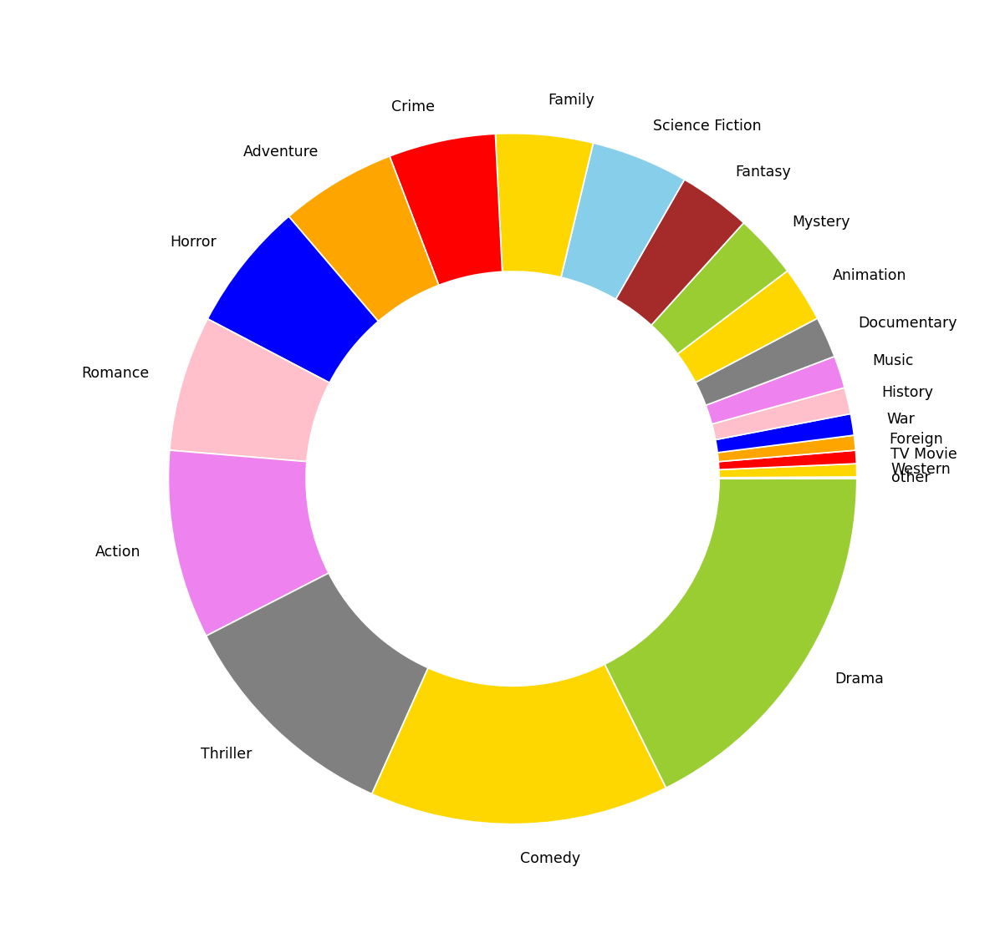

In [76]:
Genre_names=['other', 'Western', 'TV Movie','Foreign','War','History','Music','Documentary','Animation','Mystery','Fantasy','Science Fiction','Family','Crime','Adventure','Horror','Romance','Action','Thriller','Comedy','Drama']
fig, gen = plt.subplots()
gen.axis('equal')
Genpie, _ = gen.pie(genreCount, radius=2.5, labels=Genre_names, colors = ['skyblue', 'gold','red','orange','blue','pink','violet','grey','gold','yellowgreen','brown'])
plt.setp(Genpie, width=1, edgecolor='white')
plt.margins(0,0)

<IPython.core.display.Javascript object>


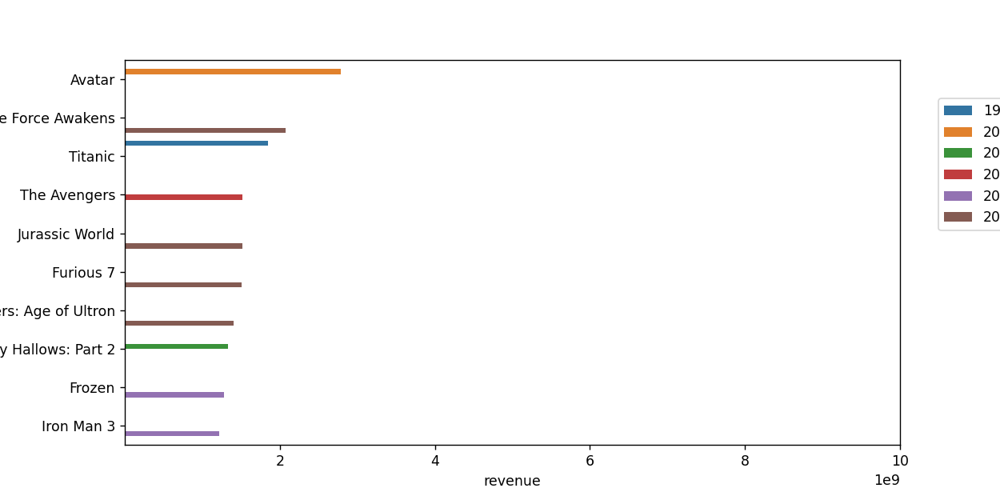

In [89]:

plt.figure(figsize=(10,5))
df_revenue=data.sort_values("revenue", ascending=False).head(10)
df1 = sns.barplot(x="revenue", y="original_title",hue='release_year', linewidth=0, data=df_revenue,ci= None)
#plt.title('Top 10 Movies with Highest Revenue',fontsize=18,fontweight="bold")
df1.set_xlim(990,9999999999)
plt.legend(bbox_to_anchor=(1.05, 0.9), loc=2, borderaxespad=0.)
plt.show()

<IPython.core.display.Javascript object>


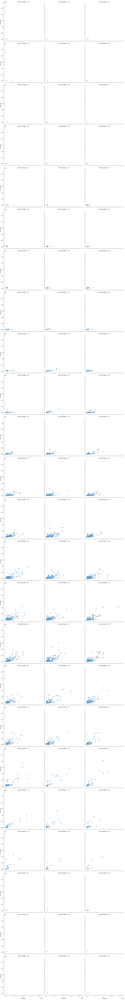

In [91]:
sns.relplot(x='budget', y='revenue', data=data, kind='scatter', 
            col='vote_average', col_wrap=3)
plt.show()

<IPython.core.display.Javascript object>


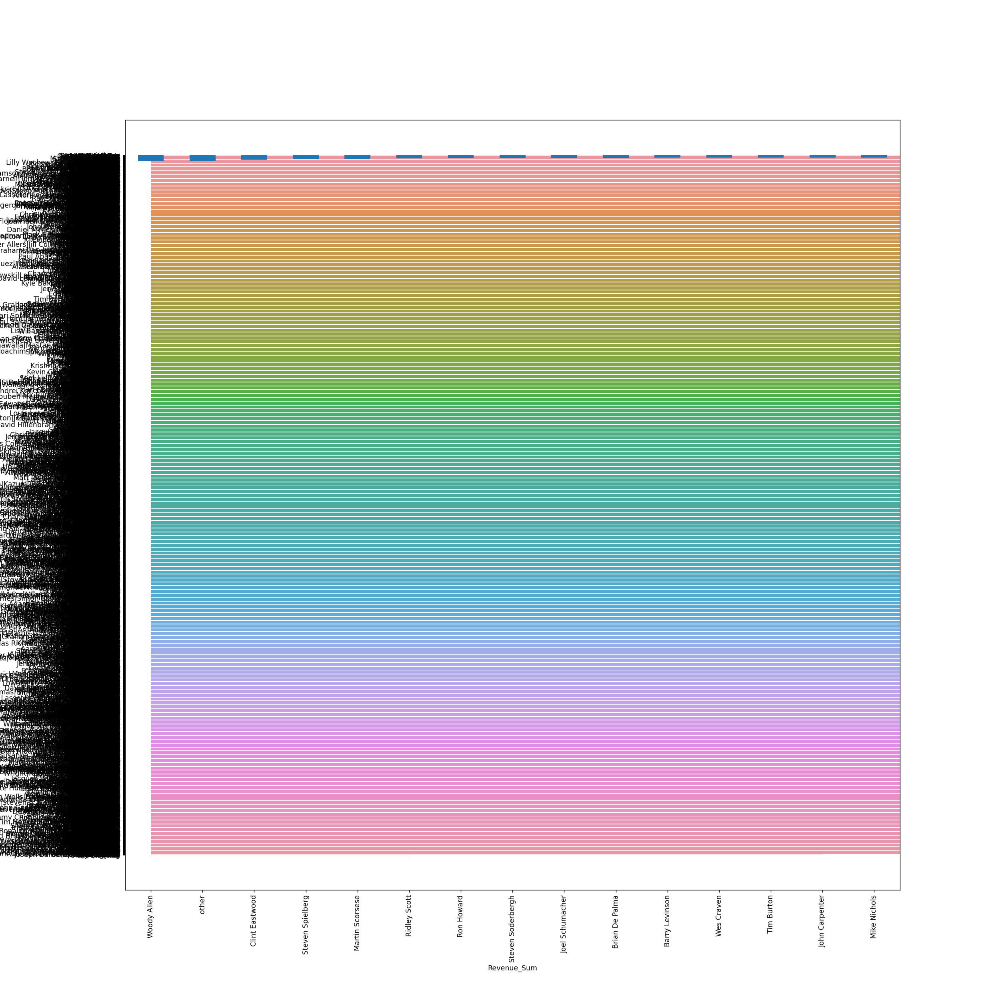

<IPython.core.display.Javascript object>


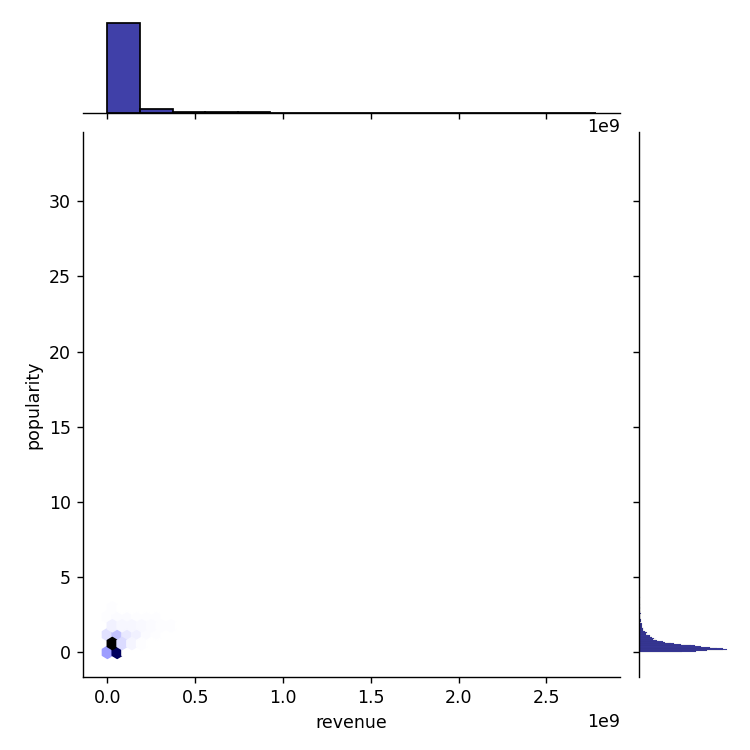

In [110]:
plt.figure(figsize=(20,20))
sns.jointplot("revenue","popularity", data=data, kind='hex', color='DarkBlue')

In [93]:
x =[]
y =[]

for i in data['release_year'].unique():
    y.append(data[data['release_year']==i]['revenue'].sum())
    x.append(i) 
z = pd.DataFrame(list(zip(x, y)), columns=['Year','Revenue_Sum'])

In [100]:
z.head()

,Year,Revenue_Sum
0,2015,4.321096e+10
1,2014,4.312945e+10
2,1977,3.494871e+09
3,2009,3.544253e+10
4,2010,3.279195e+10


<IPython.core.display.Javascript object>


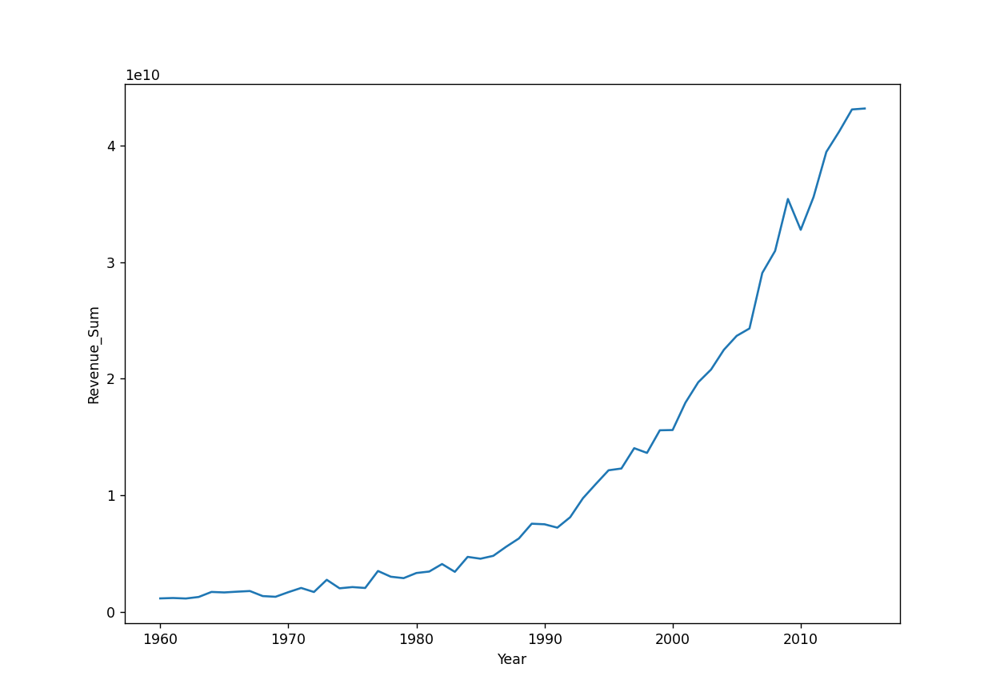

In [98]:
plt.figure(figsize=(10,7))
movieTrend = sns.lineplot(x="Year", y="Revenue_Sum",data=z,ci= None)

In [111]:
x =[]
y =[]

for i in data['director'].unique():
    y.append(data[data['director']==i]['revenue'].sum())
    x.append(i)
df6 = (pd.DataFrame(list(zip(x, y)), columns=['director','Revenue_Sum'])).sort_values('Revenue_Sum', ascending=False)

In [113]:
low_rev_dir = df6.tail(5)
low_rev_dir

,director,Revenue_Sum
3595,Benedikt Erlingsson,11.0
4461,Rusty Cundieff,11.0
2456,Silvio Muccino,9.0
4457,Peter Hall,6.0
4524,Gilbert Adler,5.0


In [114]:
high_rev_dir = df6.head(5)
high_rev_dir

,director,Revenue_Sum
33,Steven Spielberg,9.098218e+09
616,Peter Jackson,6.602898e+09
1274,James Cameron,5.921549e+09
628,Michael Bay,4.917208e+09
612,Christopher Nolan,4.247202e+09


<IPython.core.display.Javascript object>


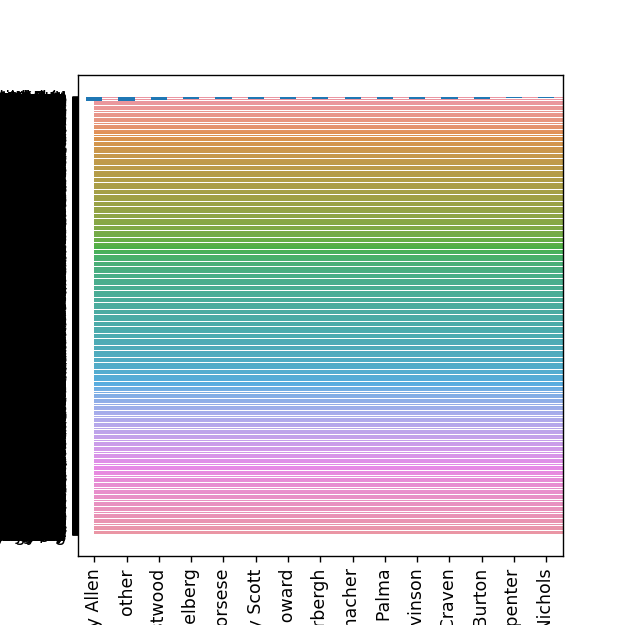

In [124]:
plt.figure(figsize=(5,5))
sns.barplot(x="Revenue_Sum", y="director", data=df6, ci= None)
plt.show()

<IPython.core.display.Javascript object>


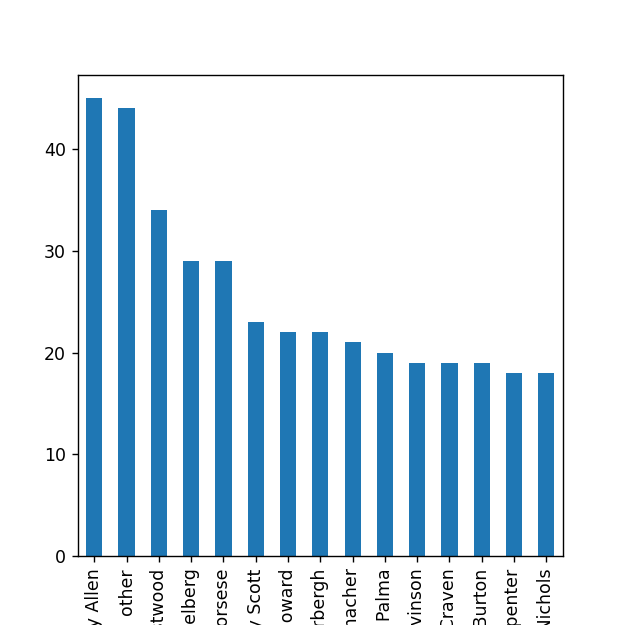

<AxesSubplot:>

In [127]:
plt.figure(figsize=(5,5))
data.director.value_counts().head(15).plot.bar()

In [128]:
g = []
h = []
for i in range(2000,2010):
    den = data[data['release_year']==i]['runtime'].count()
    g.append(int((data[data['release_year']==i]['runtime'].sum())/den))
    h.append(i)

In [130]:
df_YT = (pd.DataFrame(list(zip(g,h)), columns=['AvgRuntime','Year']))
df_YT

,AvgRuntime,Year
0,103,2000
1,108,2001
2,106,2002
3,100,2003
4,105,2004
5,102,2005
6,101,2006
7,100,2007
8,100,2008
9,98,2009


<IPython.core.display.Javascript object>


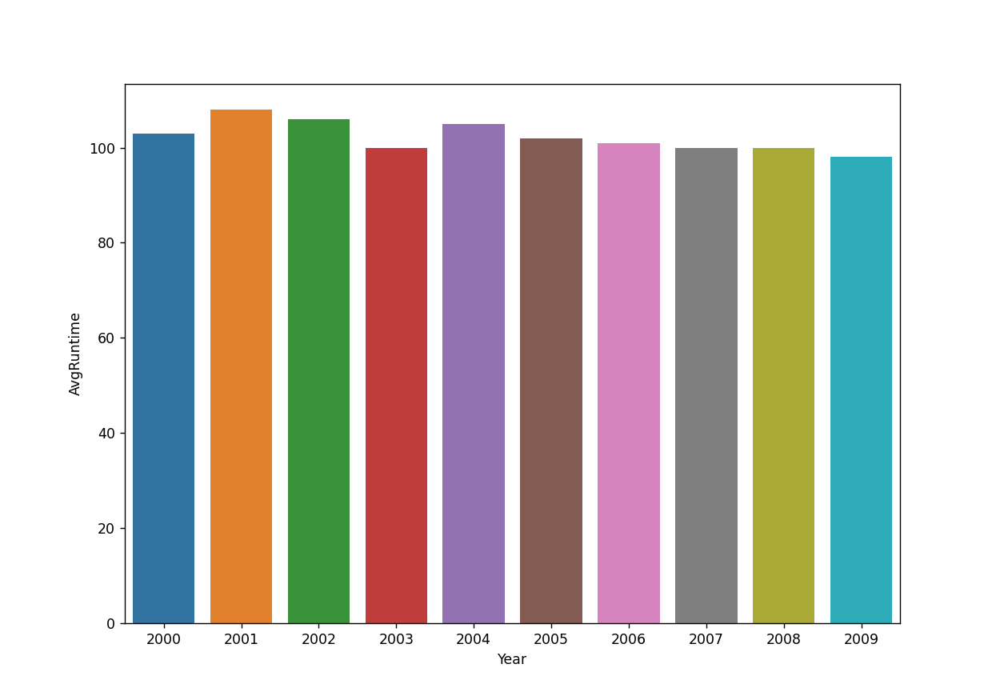

<AxesSubplot:xlabel='Year', ylabel='AvgRuntime'>

In [131]:
plt.figure(figsize=(10,7))
sns.barplot(x="Year", y="AvgRuntime",data=df_YT,ci= None)

In [133]:
data['genres'].value_counts().head(15) 

Comedy                  712
Drama                   712
Documentary             312
Drama|Romance           289
Comedy|Drama            280
Comedy|Romance          268
Horror|Thriller         259
Horror                  253
Comedy|Drama|Romance    222
Drama|Thriller          138
Comedy|Family           102
Action|Thriller         101
Thriller                 93
Drama|Comedy             92
Animation|Family         90
Name: genres, dtype: int64

In [134]:
genreCombiList = ['Comedy',
'Drama',
'Documentary',
'Drama|Romance',
'Comedy|Drama',
'Comedy|Romance',
'Horror|Thriller',
'Horror',
'Comedy|Drama|Romance',
'Drama|Thriller',
'Comedy|Family',
'Action|Thriller',
'Thriller',
'Drama|Comedy',
'Animation|Family']

In [137]:
TopGenre = []
for i in genreCombiList:
    x = int(data[data['genres']==i]['revenue'].sum())
    TopGenre.append(x)

# TopGen DataFrame for the values.
TopGen= pd.DataFrame(TopGenre)
TopGen.columns =['revenueSum'] 
TopGen['Genres'] = genreCombiList

In [139]:
TopGen=TopGen.sort_values('revenueSum', ascending=False)
TopGen

,revenueSum,Genres
0,36692743948,Comedy
1,30281580752,Drama
5,16484259454,Comedy|Romance
3,12334050679,Drama|Romance
8,11074557719,Comedy|Drama|Romance
4,10985236691,Comedy|Drama
2,10660803086,Documentary
6,10327622256,Horror|Thriller
7,10309779234,Horror
14,9409955087,Animation|Family


<IPython.core.display.Javascript object>


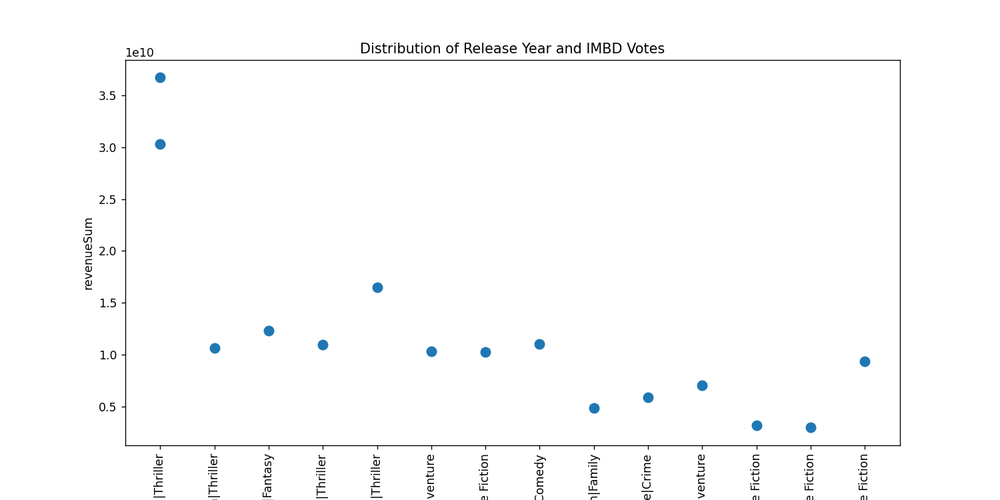

In [162]:
# #plt.figure(figsize=(10,7))
# f,ax1 = plt.subplots(figsize =(5,5))
# ax1.set(ylim=(3000000000, 39999999999))
# ax1.set(xlim = (1, 15))
# sns.barplot(x=data['genres'], y=TopGen['revenueSum'], palette="rocket", ax=ax1)
# plt.xticks(rotation= 90)
# plt.xlabel('Genres')
# plt.ylabel('RevenueSum')
# plt.show()

plt.figure(figsize=(12,6))
plt.title('Distribution of Release Year and IMBD Votes')
plt.xticks(rotation = 90)
sns.scatterplot(x=data['genres'],
                y=TopGen['revenueSum'],
               s=100);



In [258]:
!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS
import nltk

In [259]:
from PIL import Image


In [266]:
# from os import path
# ironManMask = np.array(Image.open('/Users/admin/ironManMask.jpg'))

In [289]:
def Freq_df(cleanwordlist):
    Freq_dist_nltk = nltk.FreqDist(cleanwordlist)
    df_freq = pd.DataFrame.from_dict(Freq_dist_nltk, orient='index')
    df_freq.columns = ['Frequency']
    df_freq.index.name = 'Term'
    df_freq = df_freq.sort_values(by=['Frequency'],ascending=False)
    df_freq = df_freq.reset_index()
    return df_freq

def Word_Cloud(data, color_background, colormap, title):
    plt.figure(figsize = (20,10))
    wc = WordCloud(width=1600, 
               height=800, 
               max_words=50,
               #colormap= colormap,
               max_font_size = 100,
               mask = ironManMask,
               random_state=88, 
               #contour_width=3, contour_color='steelblue'    
               background_color=color_background).generate_from_frequencies(data)
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=20)
    plt.axis('off')
    plt.show()

<IPython.core.display.Javascript object>


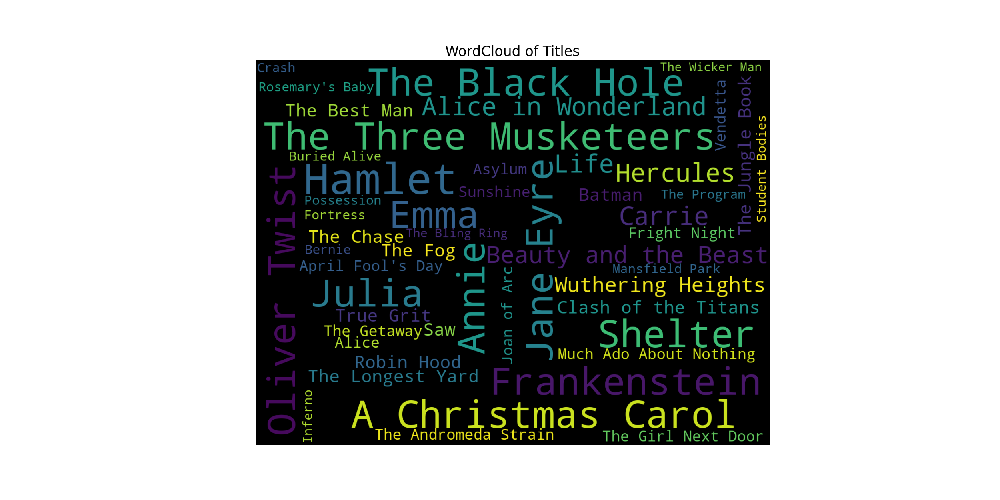

In [290]:
freq_df = Freq_df(data['original_title'].values.tolist())
dataCloud = dict(zip(freq_df['Term'].tolist(), freq_df['Frequency'].tolist()))
dataCloud = freq_df.set_index('Term').to_dict()['Frequency']

Word_Cloud(dataCloud ,'black','RdBu', 'WordCloud of Titles')

NameError: name 'cleanwordList' is not defined